# Setting the environment

### Import packages

In [3]:
#%pip install sunbird
#%pip install seaborn
#%pip install yellowbrick
#%pip install plotly

In [4]:
import pandas as pds
import numpy as npy
import seaborn as sbn
import matplotlib.pyplot as mpl

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_squared_error, accuracy_score, classification_report
from sklearn.metrics import pairwise_distances_argmin_min
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram

#from sunbird.categorical_encoding import frequency_encoding
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from mpl_toolkits.mplot3d import Axes3D
from collections import Counter
import plotly.express as px
import random

from google.colab import drive

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [5]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Upload data

In [6]:
df_mean_prediction = pds.read_csv('/content/drive/MyDrive/cust_clust/media-prediction-and-its-cost.csv')

In [7]:
display(df_mean_prediction.tail(7))
print("------------------------------------------------------")
display(df_mean_prediction.sample(7))

,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,gender,...,grocery_sqft,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost
60421,Specialty,Carousel,Non-Consumable,0.99,0.4554,1.0,Green Light Special,USA,S,F,...,15321.0,4294.0,2863.0,1.0,0.0,0.0,0.0,0.0,Cash Register Handout,127.19
60422,Specialty,Carousel,Non-Consumable,1.21,0.4477,1.0,Unbeatable Price Savers,USA,S,F,...,15321.0,4294.0,2863.0,1.0,0.0,0.0,0.0,0.0,"Sunday Paper, Radio",78.45
60423,Specialty,Carousel,Non-Consumable,2.76,1.3248,1.0,You Save Days,USA,M,F,...,15321.0,4294.0,2863.0,1.0,0.0,0.0,0.0,0.0,In-Store Coupon,95.25
60424,Specialty,Carousel,Non-Consumable,1.60,0.4960,1.0,Price Cutters,USA,S,F,...,15321.0,4294.0,2863.0,1.0,0.0,0.0,0.0,0.0,Sunday Paper,69.42
60425,Specialty,Carousel,Non-Consumable,5.52,2.5392,2.0,Weekend Markdown,USA,M,M,...,15321.0,4294.0,2863.0,1.0,0.0,0.0,0.0,0.0,"Sunday Paper, Radio, TV",67.51
60426,Specialty,Carousel,Non-Consumable,8.28,2.5668,3.0,Sales Days,Canada,S,M,...,27463.0,4193.0,2795.0,1.0,0.0,0.0,0.0,1.0,Sunday Paper,132.88
60427,Specialty,Carousel,Non-Consumable,9.20,4.2320,4.0,Super Duper Savers,Canada,S,F,...,27463.0,4193.0,2795.0,1.0,0.0,0.0,0.0,1.0,"Daily Paper, Radio",87.76


------------------------------------------------------


,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,gender,...,grocery_sqft,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost
19389,Snack Foods,Snack Foods,Food,8.70,3.3060,3.0,Wallet Savers,USA,S,F,...,22063.0,4923.0,3282.0,0.0,0.0,0.0,0.0,0.0,"Sunday Paper, Radio, TV",79.95
38545,Snack Foods,Snack Foods,Food,10.64,5.0008,4.0,Save-It Sale,USA,M,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,Radio,144.38
55684,Kitchen Products,Household,Non-Consumable,3.80,1.5960,2.0,Dollar Days,USA,M,F,...,14210.0,5633.0,3755.0,0.0,0.0,0.0,0.0,1.0,Sunday Paper,143.04
46306,Frozen Entrees,Frozen Foods,Food,6.33,2.1522,3.0,Two for One,USA,M,F,...,22063.0,4923.0,3282.0,0.0,0.0,0.0,0.0,0.0,"Daily Paper, Radio, TV",57.52
33784,Jams and Jellies,Baking Goods,Food,5.91,2.6595,3.0,Saving Days,Mexico,S,M,...,16844.0,4149.0,2766.0,1.0,0.0,1.0,1.0,1.0,"Daily Paper, Radio, TV",90.65
55923,Dairy,Dairy,Food,11.52,5.7600,4.0,Wallet Savers,USA,S,F,...,22063.0,4923.0,3282.0,0.0,0.0,0.0,0.0,0.0,"Sunday Paper, Radio, TV",79.95
476,Bread,Baked Goods,Food,2.04,0.6528,4.0,Save-It Sale,USA,S,M,...,14210.0,5633.0,3755.0,0.0,0.0,0.0,0.0,1.0,Daily Paper,81.79


# Exploratory Data Analysis

In [8]:
column_names = df_mean_prediction.columns.to_list()
column_names.sort()
for name in column_names:
    print(name)

SRP
avg. yearly_income
avg_cars_at home(approx)
avg_cars_at home(approx).1
brand_name
coffee_bar
cost
education
florist
food_category
food_department
food_family
frozen_sqft
gender
grocery_sqft
gross_weight
houseowner
low_fat
marital_status
meat_sqft
media_type
member_card
net_weight
num_children_at_home
occupation
prepared_food
promotion_name
recyclable_package
salad_bar
sales_country
store_city
store_cost(in millions)
store_sales(in millions)
store_sqft
store_state
store_type
total_children
unit_sales(in millions)
units_per_case
video_store


In [9]:
df_mean_prediction = df_mean_prediction.drop('avg_cars_at home(approx).1', axis = 1)

In [10]:
display(df_mean_prediction.columns.to_list())
print("------------------------------------------------------")
display(df_mean_prediction.info())
print("------------------------------------------------------")
display(df_mean_prediction.isnull().sum())
print("------------------------------------------------------")
display(df_mean_prediction.isnull().values.any())
print("------------------------------------------------------")
#display(df_mean_prediction.isna())

['food_category',
 'food_department',
 'food_family',
 'store_sales(in millions)',
 'store_cost(in millions)',
 'unit_sales(in millions)',
 'promotion_name',
 'sales_country',
 'marital_status',
 'gender',
 'total_children',
 'education',
 'member_card',
 'occupation',
 'houseowner',
 'avg_cars_at home(approx)',
 'avg. yearly_income',
 'num_children_at_home',
 'brand_name',
 'SRP',
 'gross_weight',
 'net_weight',
 'recyclable_package',
 'low_fat',
 'units_per_case',
 'store_type',
 'store_city',
 'store_state',
 'store_sqft',
 'grocery_sqft',
 'frozen_sqft',
 'meat_sqft',
 'coffee_bar',
 'video_store',
 'salad_bar',
 'prepared_food',
 'florist',
 'media_type',
 'cost']

------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60428 entries, 0 to 60427
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   food_category             60428 non-null  object 
 1   food_department           60428 non-null  object 
 2   food_family               60428 non-null  object 
 3   store_sales(in millions)  60428 non-null  float64
 4   store_cost(in millions)   60428 non-null  float64
 5   unit_sales(in millions)   60428 non-null  float64
 6   promotion_name            60428 non-null  object 
 7   sales_country             60428 non-null  object 
 8   marital_status            60428 non-null  object 
 9   gender                    60428 non-null  object 
 10  total_children            60428 non-null  float64
 11  education                 60428 non-null  object 
 12  member_card               60428 non-null  object 
 13  occupa

None

------------------------------------------------------


food_category               0
food_department             0
food_family                 0
store_sales(in millions)    0
store_cost(in millions)     0
unit_sales(in millions)     0
promotion_name              0
sales_country               0
marital_status              0
gender                      0
total_children              0
education                   0
member_card                 0
occupation                  0
houseowner                  0
avg_cars_at home(approx)    0
avg. yearly_income          0
num_children_at_home        0
brand_name                  0
SRP                         0
gross_weight                0
net_weight                  0
recyclable_package          0
low_fat                     0
units_per_case              0
store_type                  0
store_city                  0
store_state                 0
store_sqft                  0
grocery_sqft                0
frozen_sqft                 0
meat_sqft                   0
coffee_bar                  0
video_stor

------------------------------------------------------


False

------------------------------------------------------


In [11]:
df_mean_prediction['avg. yearly_income'].sample(9)
df_mean_prediction_copy = pds.DataFrame(df_mean_prediction)

In [12]:
df_mean_prediction_copy.head(7)

,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,gender,...,grocery_sqft,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost
0,Breakfast Foods,Frozen Foods,Food,7.36,2.7232,4.0,Bag Stuffers,USA,M,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",126.62
1,Breakfast Foods,Frozen Foods,Food,5.52,2.5944,3.0,Cash Register Lottery,USA,M,M,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",59.86
2,Breakfast Foods,Frozen Foods,Food,3.68,1.3616,2.0,High Roller Savings,USA,S,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",84.16
3,Breakfast Foods,Frozen Foods,Food,3.68,1.1776,2.0,Cash Register Lottery,USA,M,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,In-Store Coupon,95.78
4,Breakfast Foods,Frozen Foods,Food,4.08,1.4280,3.0,Double Down Sale,USA,M,M,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,Radio,50.79
5,Breakfast Foods,Frozen Foods,Food,4.08,1.4688,3.0,Double Down Sale,USA,M,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,Radio,50.79
6,Breakfast Foods,Frozen Foods,Food,5.44,2.5568,4.0,Cash Register Lottery,USA,S,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,In-Store Coupon,95.78


In [13]:
yearly_income = {'$10K - $30K':20000,
                 '$30K - $50K':40000,
                 '$50K - $70K':60000,
                 '$70K - $90K':80000,
                 '$90K - $110K':100000,
                 '$110K - $130K':120000,
                 '$130K - $150K':140000,
                 '$150K +':160000
                }

In [14]:
df_mean_prediction_copy.rename(columns={'avg. yearly_income' : 'avg_yearly_income'}, inplace=True)

In [15]:
display(df_mean_prediction_copy['avg_yearly_income'].head(10))
print("------------------------------------------------------")
display(df_mean_prediction_copy['avg_yearly_income'].tail(10))

0    $10K - $30K
1    $50K - $70K
2    $10K - $30K
3    $30K - $50K
4    $30K - $50K
5    $50K - $70K
6    $30K - $50K
7    $50K - $70K
8    $10K - $30K
9    $70K - $90K
Name: avg_yearly_income, dtype: object

------------------------------------------------------


60418      $30K - $50K
60419      $70K - $90K
60420      $10K - $30K
60421    $130K - $150K
60422      $50K - $70K
60423      $10K - $30K
60424      $30K - $50K
60425      $30K - $50K
60426      $70K - $90K
60427      $10K - $30K
Name: avg_yearly_income, dtype: object

In [16]:
df_mean_prediction_copy['avg_yearly_income'] = df_mean_prediction_copy['avg_yearly_income'].map(yearly_income)

In [17]:
df_mean_prediction_copy['avg_yearly_income'].sample(9)

4589      40000
40296     20000
45236    140000
52580     20000
10386     80000
40294     80000
10675     20000
28499    160000
10771     20000
Name: avg_yearly_income, dtype: int64

In [18]:
pop_city = {"Salem": 152405,
            "Tacoma": 216457,
            "Seattle": 737015,
            "Spokane": 220270,
            "Los Angeles": 3971883,
            "Beverly Hills": 34133,
            "Portland": 653115,
            "Bellingham": 80888,
            "Orizaba": 150000,
            "Merida": 920000,
            "Hidalgo": 214685,
            "Mexico City": 21804515,
            "Vancouver": 2313652,
            "Bremerton": 37056,
            "Camacho": 100000,
            "Guadalajara": 1542000,
            "Acapulco": 763331,
            "San Francisco": 873965,
            "Victoria": 85796
           }

pop_country = {"USA": 331002651,
               "Canada": 37742154,
               "Mexico": 128932753
              }

In [19]:
display(df_mean_prediction_copy['store_city'].sample(10))
print("------------------------------------------------------")
display(df_mean_prediction_copy['sales_country'].tail(10))

35940      Los Angeles
6987       Los Angeles
31138          Seattle
17368         Portland
32415         Portland
44869    Beverly Hills
54086      Mexico City
56304         Portland
1980             Salem
52969          Orizaba
Name: store_city, dtype: object

------------------------------------------------------


60418    Mexico
60419    Mexico
60420    Mexico
60421       USA
60422       USA
60423       USA
60424       USA
60425       USA
60426    Canada
60427    Canada
Name: sales_country, dtype: object

In [20]:
df_mean_prediction_copy['population_city'] = df_mean_prediction_copy['store_city'].map(pop_city)
df_mean_prediction_copy['population_country'] = df_mean_prediction_copy['sales_country'].map(pop_country)

In [21]:
display(df_mean_prediction_copy.tail(7))
print("------------------------------------------------------")
display(df_mean_prediction_copy.info())

,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,gender,...,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost,population_city,population_country
60421,Specialty,Carousel,Non-Consumable,0.99,0.4554,1.0,Green Light Special,USA,S,F,...,2863.0,1.0,0.0,0.0,0.0,0.0,Cash Register Handout,127.19,873965,331002651
60422,Specialty,Carousel,Non-Consumable,1.21,0.4477,1.0,Unbeatable Price Savers,USA,S,F,...,2863.0,1.0,0.0,0.0,0.0,0.0,"Sunday Paper, Radio",78.45,873965,331002651
60423,Specialty,Carousel,Non-Consumable,2.76,1.3248,1.0,You Save Days,USA,M,F,...,2863.0,1.0,0.0,0.0,0.0,0.0,In-Store Coupon,95.25,873965,331002651
60424,Specialty,Carousel,Non-Consumable,1.60,0.4960,1.0,Price Cutters,USA,S,F,...,2863.0,1.0,0.0,0.0,0.0,0.0,Sunday Paper,69.42,873965,331002651
60425,Specialty,Carousel,Non-Consumable,5.52,2.5392,2.0,Weekend Markdown,USA,M,M,...,2863.0,1.0,0.0,0.0,0.0,0.0,"Sunday Paper, Radio, TV",67.51,873965,331002651
60426,Specialty,Carousel,Non-Consumable,8.28,2.5668,3.0,Sales Days,Canada,S,M,...,2795.0,1.0,0.0,0.0,0.0,1.0,Sunday Paper,132.88,85796,37742154
60427,Specialty,Carousel,Non-Consumable,9.20,4.2320,4.0,Super Duper Savers,Canada,S,F,...,2795.0,1.0,0.0,0.0,0.0,1.0,"Daily Paper, Radio",87.76,85796,37742154


------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60428 entries, 0 to 60427
Data columns (total 41 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   food_category             60428 non-null  object 
 1   food_department           60428 non-null  object 
 2   food_family               60428 non-null  object 
 3   store_sales(in millions)  60428 non-null  float64
 4   store_cost(in millions)   60428 non-null  float64
 5   unit_sales(in millions)   60428 non-null  float64
 6   promotion_name            60428 non-null  object 
 7   sales_country             60428 non-null  object 
 8   marital_status            60428 non-null  object 
 9   gender                    60428 non-null  object 
 10  total_children            60428 non-null  float64
 11  education                 60428 non-null  object 
 12  member_card               60428 non-null  object 
 13  occupa

None

In [22]:
df_prediction_customers = pds.read_csv('/content/drive/MyDrive/cust_clust/df_mean_prediction_customers.csv')
df_prediction_stores = pds.read_csv('/content/drive/MyDrive/cust_clust/df_mean_prediction_stores.csv')
df_prediction_sales = pds.read_csv('/content/drive/MyDrive/cust_clust/df_mean_prediction_sales.csv')

In [23]:
display(df_prediction_customers.tail(7))
print("------------------------------------------------------")
display(df_prediction_stores.head(7))
print("------------------------------------------------------")
display(df_prediction_sales.tail(7))

,sales_country,population_country,store_city,population_city,member_card,cost,gender,education,occupation,marital_status,num_children_at_home,total_children,houseowner,avg_cars_at home(approx),avg_yearly_income
60421,USA,331002651,San Francisco,873965,Bronze,127.19,F,High School Degree,Professional,S,0.0,2.0,Y,3.0,140000
60422,USA,331002651,San Francisco,873965,Bronze,78.45,F,Partial High School,Skilled Manual,S,0.0,1.0,N,2.0,60000
60423,USA,331002651,San Francisco,873965,Normal,95.25,F,Partial High School,Skilled Manual,M,1.0,1.0,Y,1.0,20000
60424,USA,331002651,San Francisco,873965,Bronze,69.42,F,High School Degree,Skilled Manual,S,0.0,2.0,N,2.0,40000
60425,USA,331002651,San Francisco,873965,Bronze,67.51,M,High School Degree,Manual,M,0.0,1.0,Y,3.0,40000
60426,Canada,37742154,Victoria,85796,Bronze,132.88,M,Bachelors Degree,Professional,S,0.0,2.0,N,4.0,80000
60427,Canada,37742154,Victoria,85796,Bronze,87.76,F,Partial High School,Manual,S,0.0,3.0,Y,1.0,20000


------------------------------------------------------


,sales_country,population_country,store_city,population_city,store_sales(in millions),store_cost(in millions),unit_sales(in millions),store_sqft,grocery_sqft,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist
0,USA,331002651,Salem,152405,7.36,2.7232,4.0,27694.0,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0
1,USA,331002651,Salem,152405,5.52,2.5944,3.0,27694.0,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0
2,USA,331002651,Salem,152405,3.68,1.3616,2.0,27694.0,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0
3,USA,331002651,Salem,152405,3.68,1.1776,2.0,27694.0,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0
4,USA,331002651,Salem,152405,4.08,1.4280,3.0,27694.0,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0
5,USA,331002651,Salem,152405,4.08,1.4688,3.0,27694.0,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0
6,USA,331002651,Salem,152405,5.44,2.5568,4.0,27694.0,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0


------------------------------------------------------


,sales_country,population_country,store_city,population_city,store_state,store_type,food_category,food_department,food_family,brand_name,promotion_name,media_type,recyclable_package,low_fat,units_per_case,gross_weight,net_weight,SRP
60421,USA,331002651,San Francisco,873965,CA,Small Grocery,Specialty,Carousel,Non-Consumable,King,Green Light Special,Cash Register Handout,1.0,0.0,25.0,11.7,10.6,0.99
60422,USA,331002651,San Francisco,873965,CA,Small Grocery,Specialty,Carousel,Non-Consumable,Toretti,Unbeatable Price Savers,"Sunday Paper, Radio",0.0,0.0,26.0,18.9,15.8,1.21
60423,USA,331002651,San Francisco,873965,CA,Small Grocery,Specialty,Carousel,Non-Consumable,ADJ,You Save Days,In-Store Coupon,1.0,0.0,26.0,19.6,18.6,2.76
60424,USA,331002651,San Francisco,873965,CA,Small Grocery,Specialty,Carousel,Non-Consumable,Symphony,Price Cutters,Sunday Paper,1.0,0.0,36.0,17.4,15.3,1.60
60425,USA,331002651,San Francisco,873965,CA,Small Grocery,Specialty,Carousel,Non-Consumable,ADJ,Weekend Markdown,"Sunday Paper, Radio, TV",1.0,0.0,26.0,19.6,18.6,2.76
60426,Canada,37742154,Victoria,85796,BC,Mid-Size Grocery,Specialty,Carousel,Non-Consumable,ADJ,Sales Days,Sunday Paper,1.0,0.0,26.0,19.6,18.6,2.76
60427,Canada,37742154,Victoria,85796,BC,Mid-Size Grocery,Specialty,Carousel,Non-Consumable,Prelude,Super Duper Savers,"Daily Paper, Radio",1.0,0.0,29.0,21.5,19.5,2.30


In [24]:
df_prediction_f = pds.read_csv('/content/drive/MyDrive/cust_clust/df_mean_prediction.csv')

In [25]:
display(df_prediction_f.head(7))
print("------------------------------------------------------")
display(df_prediction_f.info())

,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,gender,...,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost,population_city,population_country
0,Breakfast Foods,Frozen Foods,Food,7.36,2.7232,4.0,Bag Stuffers,USA,M,F,...,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",126.62,152405,331002651
1,Breakfast Foods,Frozen Foods,Food,5.52,2.5944,3.0,Cash Register Lottery,USA,M,M,...,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",59.86,152405,331002651
2,Breakfast Foods,Frozen Foods,Food,3.68,1.3616,2.0,High Roller Savings,USA,S,F,...,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",84.16,152405,331002651
3,Breakfast Foods,Frozen Foods,Food,3.68,1.1776,2.0,Cash Register Lottery,USA,M,F,...,3610.0,1.0,1.0,1.0,1.0,1.0,In-Store Coupon,95.78,152405,331002651
4,Breakfast Foods,Frozen Foods,Food,4.08,1.4280,3.0,Double Down Sale,USA,M,M,...,3610.0,1.0,1.0,1.0,1.0,1.0,Radio,50.79,152405,331002651
5,Breakfast Foods,Frozen Foods,Food,4.08,1.4688,3.0,Double Down Sale,USA,M,F,...,3610.0,1.0,1.0,1.0,1.0,1.0,Radio,50.79,152405,331002651
6,Breakfast Foods,Frozen Foods,Food,5.44,2.5568,4.0,Cash Register Lottery,USA,S,F,...,3610.0,1.0,1.0,1.0,1.0,1.0,In-Store Coupon,95.78,152405,331002651


------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60428 entries, 0 to 60427
Data columns (total 41 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   food_category             60428 non-null  object 
 1   food_department           60428 non-null  object 
 2   food_family               60428 non-null  object 
 3   store_sales(in millions)  60428 non-null  float64
 4   store_cost(in millions)   60428 non-null  float64
 5   unit_sales(in millions)   60428 non-null  float64
 6   promotion_name            60428 non-null  object 
 7   sales_country             60428 non-null  object 
 8   marital_status            60428 non-null  object 
 9   gender                    60428 non-null  object 
 10  total_children            60428 non-null  float64
 11  education                 60428 non-null  object 
 12  member_card               60428 non-null  object 
 13  occupa

None

### Charts

In [26]:
def chart_occupation_country(df_dt, pltt, y_tl, pl_title, ylb):

  if pltt == "Set2":
    df_1 = df_dt[['occupation', 'sales_country']]
    df_1a = df_1.groupby(['occupation','sales_country']).size().reset_index()
    df_1a.columns = ['occupation','country','total']
  elif pltt == 'Paired':
    df_1 = df_prediction_f[['occupation', 'sales_country','population_country']]
    df_1a = df_1.groupby(['occupation','sales_country','population_country']).size().reset_index()
    df_1a.columns = ['occupation','country','population_country','total']
    df_1a['country_density'] = df_1a['total'] / df_1a['population_country']

  mpl.figure(figsize=(9,6))

  sbn.barplot(
      x="occupation",
      y=y_tl,
      hue="country",
      data=df_1a,
      saturation = 0.75,
      palette = pltt)

  for i, bar in enumerate(mpl.gca().patches):
    mpl.text(bar.get_x() + bar.get_width() / 2,
             bar.get_y() + bar.get_height(),
             df_1a['total'].iloc[i],
             ha="center",
             va="bottom",
             fontsize=8)


  mpl.title(pl_title)
  mpl.xlabel('country')
  mpl.ylabel(ylb)

  mpl.show()

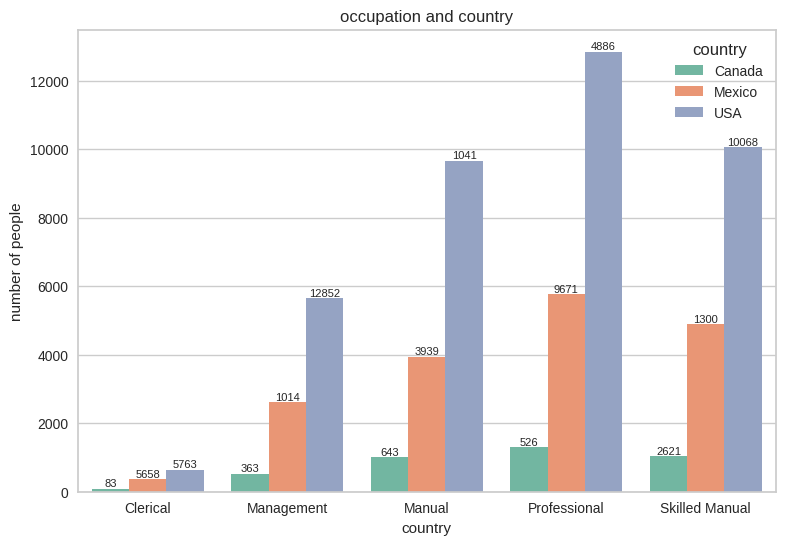

In [27]:
chart_occupation_country(df_prediction_f,
                         'Set2',
                         "total",
                         'occupation and country',
                         'number of people')

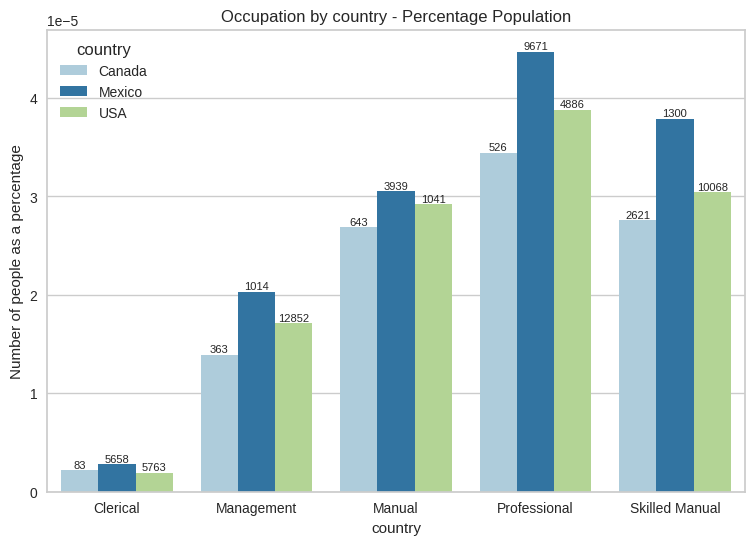

In [28]:
chart_occupation_country(df_prediction_f,
                         "Paired",
                         "country_density",
                         'Occupation by country - Percentage Population',
                         'Number of people as a percentage')

In [29]:
# sales_country, store_sales(in millions), unit_sales(in millions), food_family, and population_country

df_3 = pds.concat([df_prediction_stores[['sales_country','store_sales(in millions)','unit_sales(in millions)']],
                   df_prediction_sales[['food_family','population_country']]], axis = 1)

# Grouped by country and type
df_3a = df_3.groupby(['sales_country','food_family','population_country'])
# Counting by type
df_3b = df_3a.size()
# Get sales associated with that group
df_3c = df_3a.sum()['store_sales(in millions)']

df_country_sales = pds.DataFrame({'product_qty' : df_3b,
                                  'store_sales_millions)': df_3c})

df_country_sales = df_country_sales.reset_index()
#df_country_sales.sample(5)

# ------------------------------------------------------------------------------

def chart_stores_sales(df_dt, pltt, y_tl, pl_title):
  fig, ax = mpl.subplots(figsize = (9,6))

  if pltt == "rocket":
    df_dt
  elif pltt == 'husl':
    df_dt['proportion_of_products'] = df_dt['product_qty'] / df_dt['population_country']

  sbn.barplot(
      x="food_family",
      y=y_tl,
      hue="sales_country",
      data=df_dt,
      saturation = 0.70,
      palette = pltt)

  for i, bar in enumerate(mpl.gca().patches):
    mpl.text(bar.get_x() + bar.get_width() / 2,
             bar.get_y() + bar.get_height(),
             df_dt['product_qty'].iloc[i],
             ha="center",
             va="bottom",
             fontsize=8)


  mpl.title(pl_title)
  mpl.xlabel('food family - type')
  mpl.ylabel('Units sold')

  mpl.show()

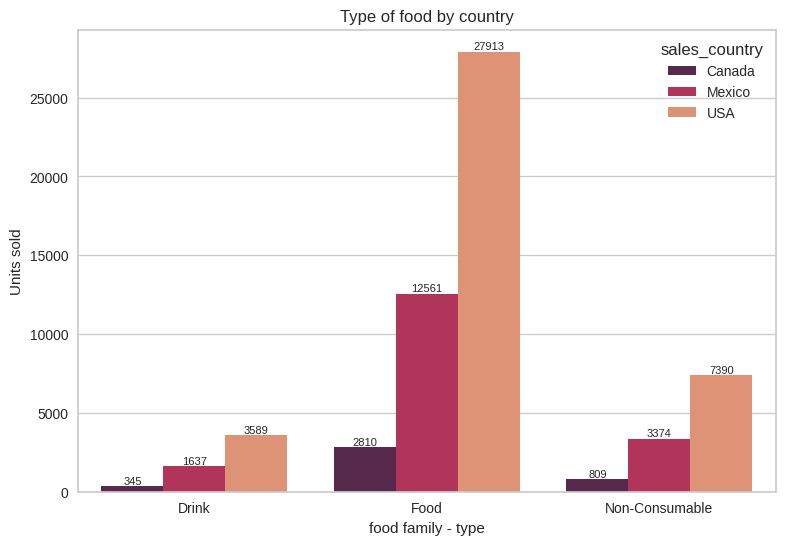

In [30]:
chart_stores_sales(df_country_sales,
                   "rocket",
                   "product_qty",
                   'Type of food by country')

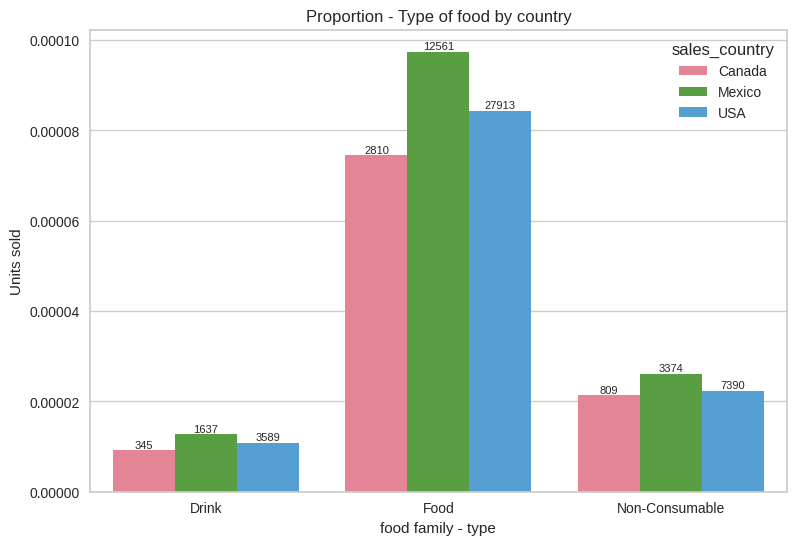

In [31]:
chart_stores_sales(df_country_sales,
                   "husl",
                   "proportion_of_products",
                   'Proportion - Type of food by country')

In [32]:
# sales_country, store_city, store_sales(in millions), store_cost(in millions), unit_sales(in millions) and population_city
df_4 = df_prediction_stores[['sales_country',
                             'store_city',
                             'store_sales(in millions)',
                             'store_cost(in millions)',
                             'unit_sales(in millions)',
                             'population_city']]

# Sum qty store_sales(in millions), store_cost(in millions) by store_city
sales_store = df_4.groupby(['sales_country','store_city','population_city']).sum()

# cretae utility column (sales and cost)
sales_store['profit(in millions)'] = sales_store['store_sales(in millions)'] - sales_store['store_cost(in millions)']

sales_store.sort_values(['sales_country','profit(in millions)'])

# cretae diff column
sales_store['diff_mean_profit'] = sales_store['profit(in millions)'] - sales_store['profit(in millions)'].mean()

sales_store = sales_store.reset_index()

# remove sales and cost columns
sales_store = sales_store.drop(['store_sales(in millions)', 'store_cost(in millions)'], axis = 1)

sales_store.sample(5)

# ------------------------------------------------------------------------------

def chart_sales_cost(df_dt, pltt, y_tl, pl_title):
  sbn.set(style = "whitegrid")

  mpl.figure(figsize=(12, 6))

  if pltt == "Set2":
    df_dt
    mean_val = df_dt['unit_sales(in millions)'].mean()
    mv_row = 'unit_sales(in millions)'
  elif pltt == "tab10":
    # Density calculation
    df_dt['sales_density'] = df_dt['unit_sales(in millions)'] / df_dt['population_city']
    mean_val = df_dt['sales_density'].mean()
    mv_row = 'sales_density'

  sbn.barplot(x="store_city",
              y=y_tl,
              hue="sales_country",
              data=df_dt,
              palette = pltt,
              errorbar=None)

  mpl.title(pl_title)
  mpl.xlabel("City")
  mpl.ylabel("sales (in millions) $")
  mpl.xticks(rotation=45)
  mpl.tight_layout()

  # add mean line
  mpl.axhline(mean_val,
              linestyle='--',
              label='mean value',
              color='pink')

  mpl.text(0, mean_val,
           f'Mean: {mean_val: .2f}',
           va='bottom',
           ha='left',
           fontsize = 10)

  # Add asterisks (*) over columns that exceed the average value
  for index, row in df_dt.iterrows():
    if row[mv_row] > mean_val:
      mpl.text(index, row[mv_row], '*',
               ha='center', va='bottom',
               fontsize=12, color='pink')

  mpl.show()

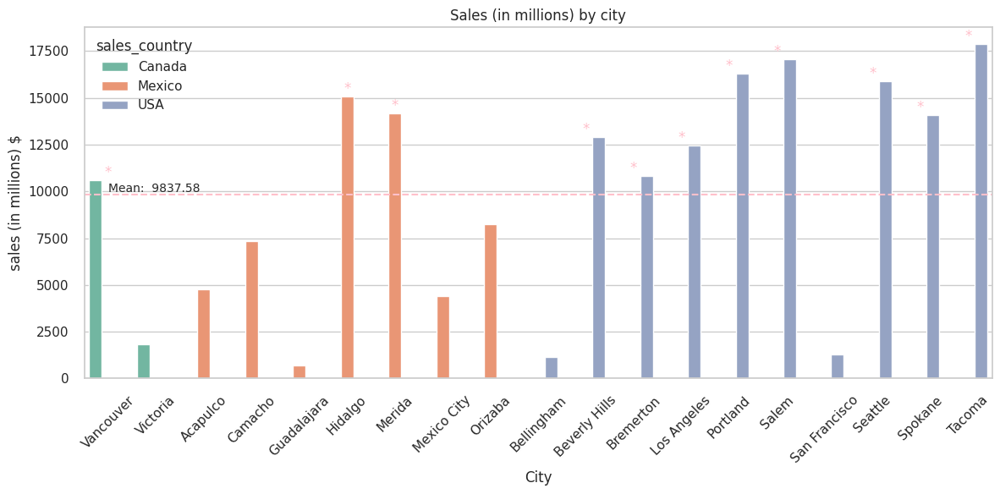

In [33]:
chart_sales_cost(sales_store,
                 "Set2",
                 "unit_sales(in millions)",
                 "Sales (in millions) by city")

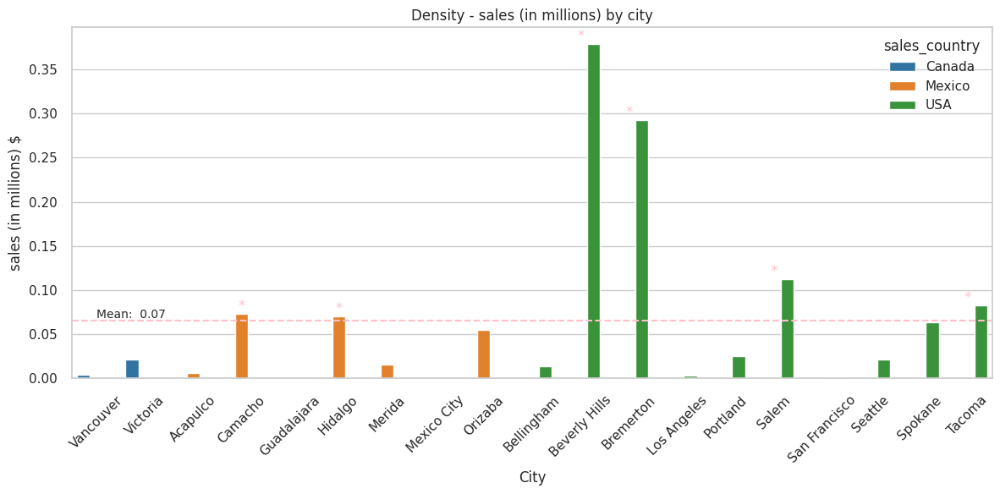

In [34]:
chart_sales_cost(sales_store,
                 "tab10",
                 "sales_density",
                 "Density - sales (in millions) by city")

In [35]:
def chart_sales_stores_gender(df_dt, pltt, tlt, x_tl, x_lb, mv_tx, lim):
  mpl.figure(figsize=(11, 7))

  sbn.barplot(x=x_tl,
              y="avg_yearly_income",
              hue="gender",
              data=df_dt,
              palette=pltt,
              errorbar=None)


  mpl.title(tlt)
  mpl.xlabel(x_lb)
  mpl.ylabel("customers yearly income ")
  mpl.xticks(rotation=45)
  mpl.tight_layout()

  mean_val = df_prediction_customers['avg_yearly_income'].mean()

  mpl.axhline(mean_val,
              linestyle='-.',
              label='sales mean',
              color='pink')

  mpl.text(mv_tx, mean_val,
          f' Mean: {mean_val:.2f}',
          va='bottom',
          ha='left',
          fontsize=9,
          color='gray')

  # Set lower limit on y-axis
  mpl.ylim(lim, mpl.ylim()[1])

  for i, bar in enumerate(mpl.gca().patches):
      if bar.get_height() > mean_val:
        mpl.text(bar.get_x() + bar.get_width() / 2,
                bar.get_height(), '*',
                ha='center', va='bottom', color='pink')

  mpl.show()

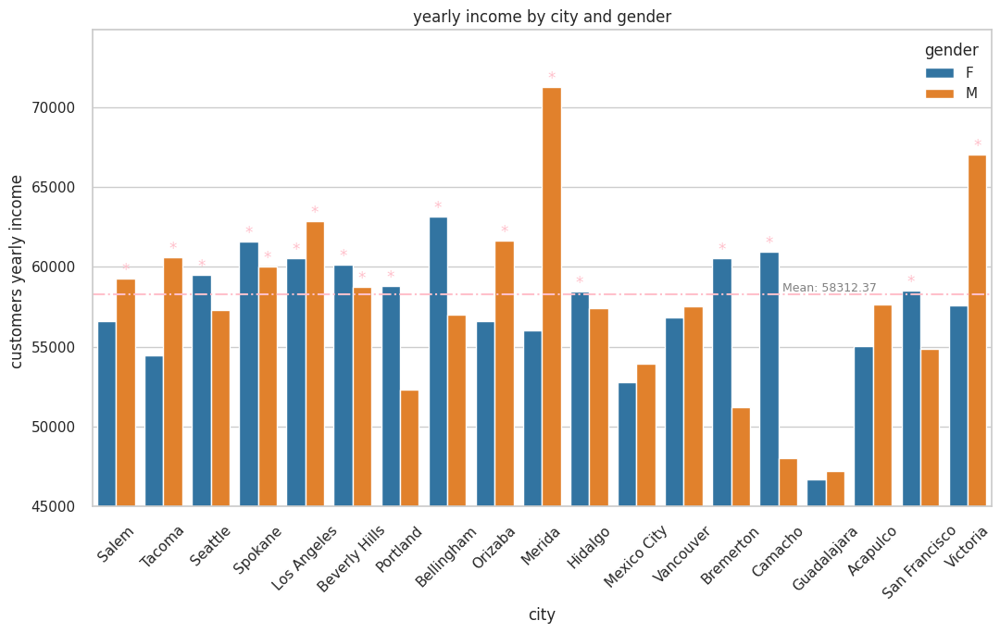

In [36]:
chart_sales_stores_gender(df_prediction_customers,
                          "tab10",
                          "yearly income by city and gender",
                          "store_city",
                          "city",
                          14, 45000)

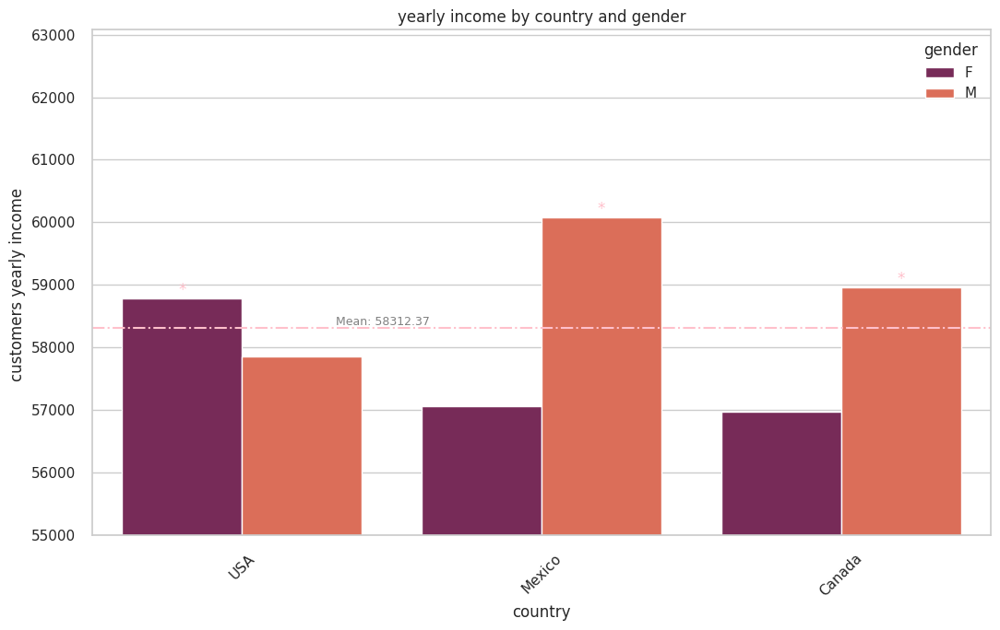

In [37]:
chart_sales_stores_gender(df_prediction_customers,
                          "rocket",
                          "yearly income by country and gender",
                          "sales_country",
                          "country",
                          0.3, 55000)

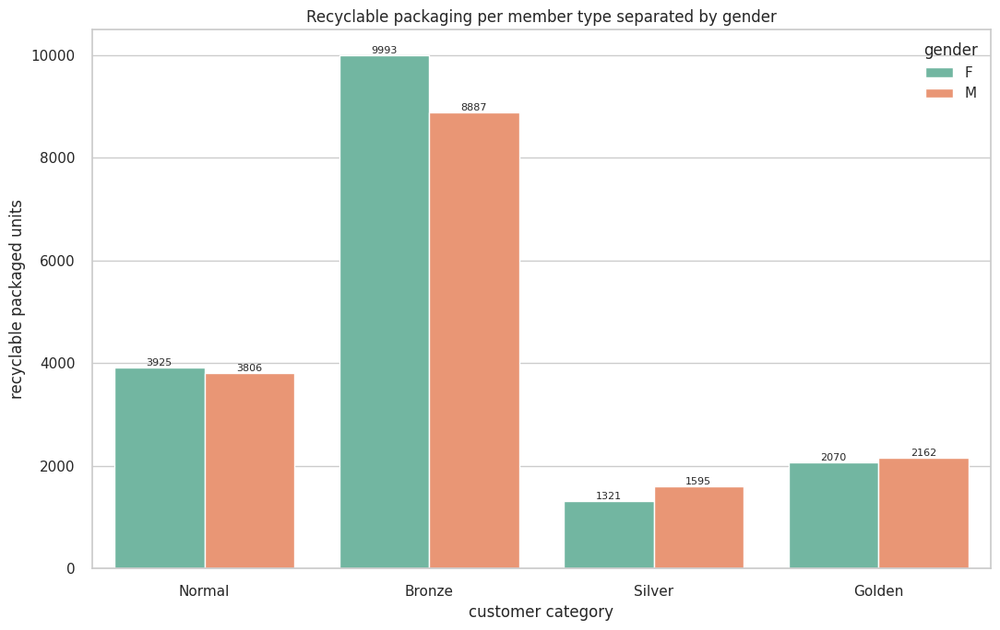

In [38]:
mpl.figure(figsize=(11, 7))

df_5 = pds.concat([df_prediction_customers[['member_card', 'gender']], df_prediction_sales['recyclable_package']], axis=1)
df_5 = df_5.groupby(['member_card', 'gender']).sum().reset_index()

members_sorted = ['Normal', 'Bronze', 'Silver', 'Golden']

ax = sbn.barplot(x="member_card",
                 y="recyclable_package",
                 hue="gender",
                 data=df_5,
                 order=members_sorted,
                 errorbar=None,
                 palette='Set2')

mpl.title("Recyclable packaging per member type separated by gender")
mpl.xlabel("customer category")
mpl.ylabel("recyclable packaged units")
mpl.tight_layout()

# Add labels at the top of each bar
for bar in ax.patches:
    mpl.text(bar.get_x() + bar.get_width() / 2,
             bar.get_height(),
             f"{int(bar.get_height())}", # Convert the value to integer and add it as a tag
             ha="center",
             va="bottom",
             fontsize=8)

mpl.show()

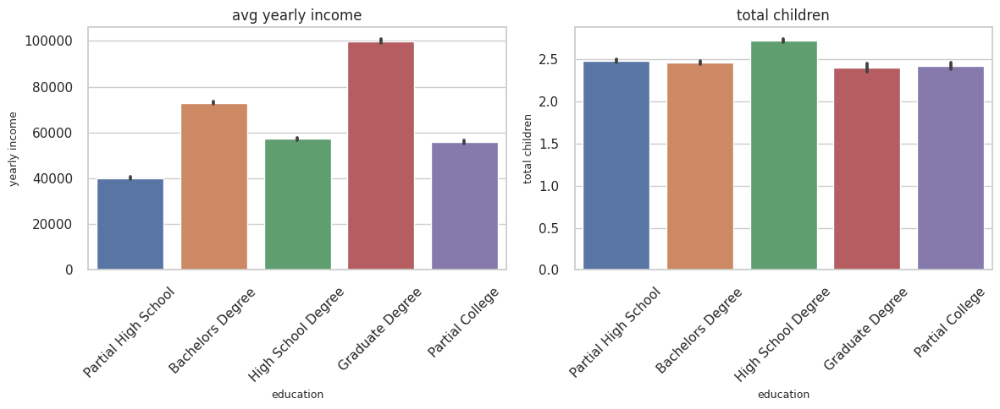

In [39]:
fig, (ax1, ax2) = mpl.subplots(1, 2, figsize=(12, 5))

sbn.barplot(x='education',
            y='avg_yearly_income',
            data=df_prediction_f,
            ax=ax1)

ax1.set_title("avg yearly income", fontsize=12)
ax1.set_xlabel("education", fontsize=9)
ax1.set_ylabel("yearly income", fontsize=9)
ax1.set_xticklabels(df_prediction_f['education'].unique().tolist(), rotation=45)

sbn.barplot(x='education',
            y='total_children',
            data=df_prediction_f,
            ax=ax2)

ax2.set_title("total children", fontsize=12)
ax2.set_xlabel("education", fontsize=9)
ax2.set_ylabel("total children", fontsize=9)
mpl.xticks(rotation=45)

# Adjust spacing between subplots
mpl.tight_layout()

mpl.show()

In [40]:
def chart_by_mix(x1_lb, xlb, y1_lb, y2_lb, x1_tl, x2_tl, yl1_tl, yl2_tl):

  fig, (ax1, ax2) = mpl.subplots(1, 2, figsize=(14, 5))

  sbn.boxplot(x=x1_lb,
              y=y1_lb,
              data=df_prediction_f,
              ax=ax1)

  ax1.set_title(x1_tl, fontsize=12)
  ax1.set_xlabel(xlb, fontsize=10)
  ax1.set_ylabel(yl1_tl, fontsize=10)

  sbn.boxplot(x=x1_lb,
              y=y2_lb,
              data=df_prediction_f,
              ax=ax2)

  ax2.set_title(x2_tl, fontsize=12)
  ax2.set_xlabel(xlb, fontsize=10)
  ax2.set_ylabel(yl2_tl, fontsize=10)

  mpl.tight_layout()
  mpl.show()

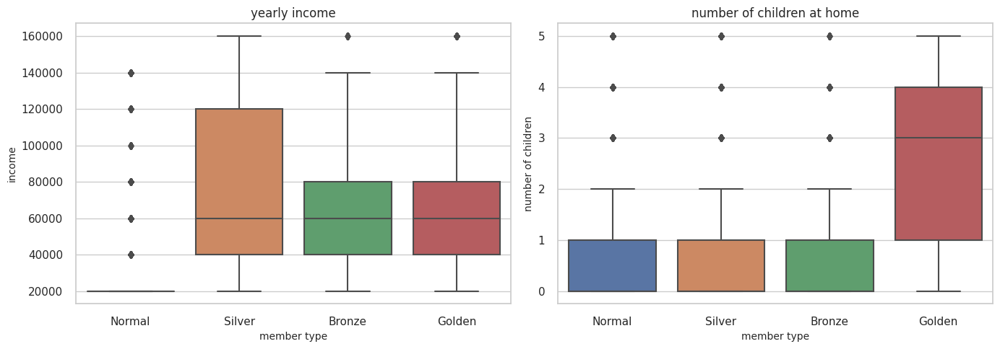

In [41]:
chart_by_mix('member_card',
             'member type',
             'avg_yearly_income',
             'num_children_at_home',
             'yearly income',
             'number of children at home',
             'income',
             'number of children')

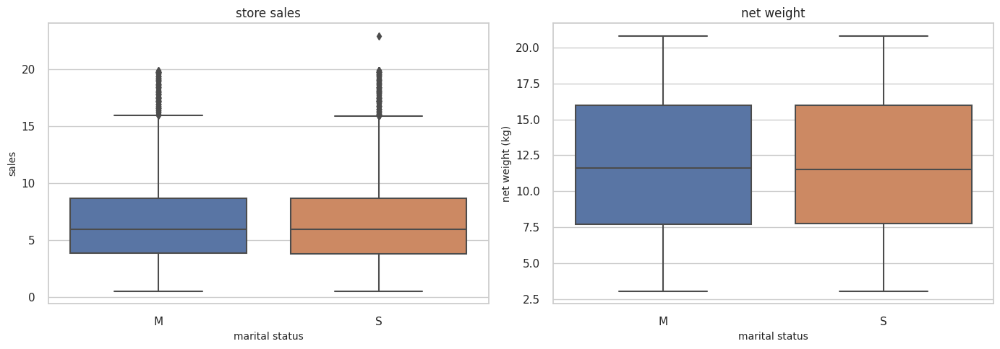

In [42]:
chart_by_mix('marital_status',
             'marital status',
             'store_sales(in millions)',
             'net_weight',
             'store sales',
             'net weight',
             'sales',
             'net weight (kg)')

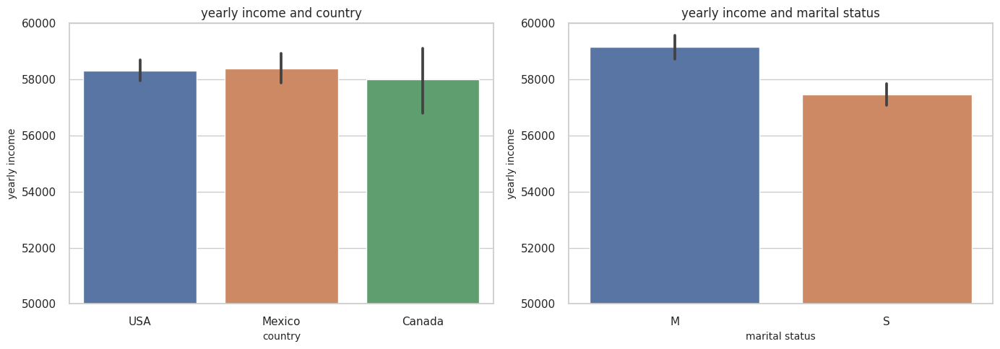

In [43]:
fig, (ax1, ax2) = mpl.subplots(1, 2, figsize=(14, 5))

sbn.barplot(x='sales_country',
            y='avg_yearly_income',
            data=df_prediction_f,
            ax=ax1)

ax1.set_ylim(50000, 60000) # Dimension y-axis
ax1.set_title("yearly income and country", fontsize=12)
ax1.set_xlabel("country", fontsize=10)
ax1.set_ylabel("yearly income", fontsize=10)

sbn.barplot(x='marital_status',
            y='avg_yearly_income',
            data=df_prediction_f,
            ax=ax2)

ax2.set_ylim(50000, 60000)
ax2.set_title("yearly income and marital status", fontsize=12)
ax2.set_xlabel("marital status", fontsize=10)
ax2.set_ylabel("yearly income", fontsize=10)


mpl.tight_layout()

mpl.show()

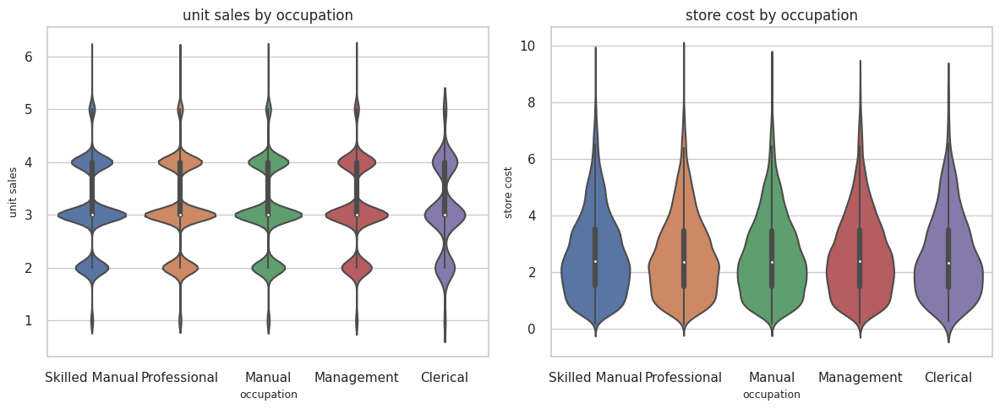

In [44]:
fig, (ax1, ax2) = mpl.subplots(1, 2, figsize=(12, 5))

sbn.violinplot(x='occupation',
               y='unit_sales(in millions)',
               data=df_prediction_f,
               ax=ax1)

ax1.set_title("unit sales by occupation", fontsize=12)
ax1.set_xlabel("occupation", fontsize=9)
ax1.set_ylabel("unit sales", fontsize=9)

sbn.violinplot(x='occupation',
               y='store_cost(in millions)',
               data=df_prediction_f,
               ax=ax2)

ax2.set_title("store cost by occupation", fontsize=12)
ax2.set_xlabel("occupation", fontsize=9)
ax2.set_ylabel("store cost", fontsize=9)

mpl.tight_layout()

mpl.show()

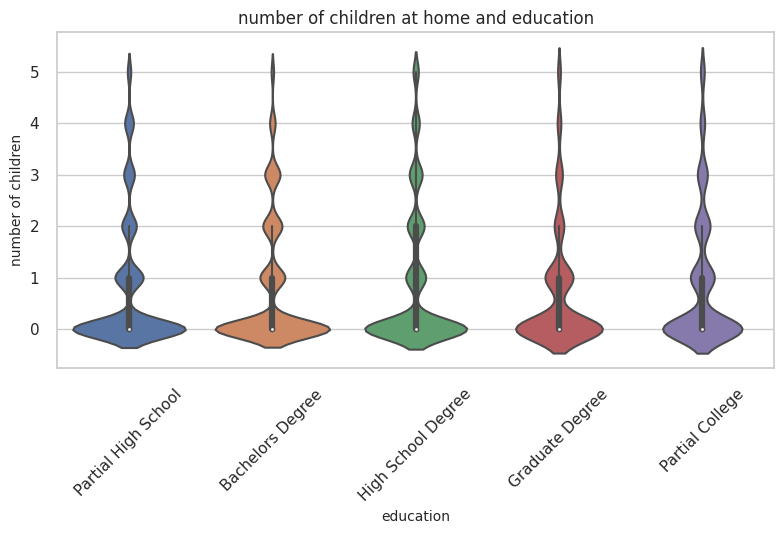

In [45]:
fig, ax = mpl.subplots()

sbn.violinplot(x='education',
               y='num_children_at_home',
               data=df_prediction_f,
               ax=ax)

ax.set_title("number of children at home and education", fontsize=12)
ax.set_xlabel('education', fontsize=10)
ax.set_ylabel('number of children', fontsize=10)

mpl.xticks(rotation=45)
mpl.tight_layout()
mpl.show()

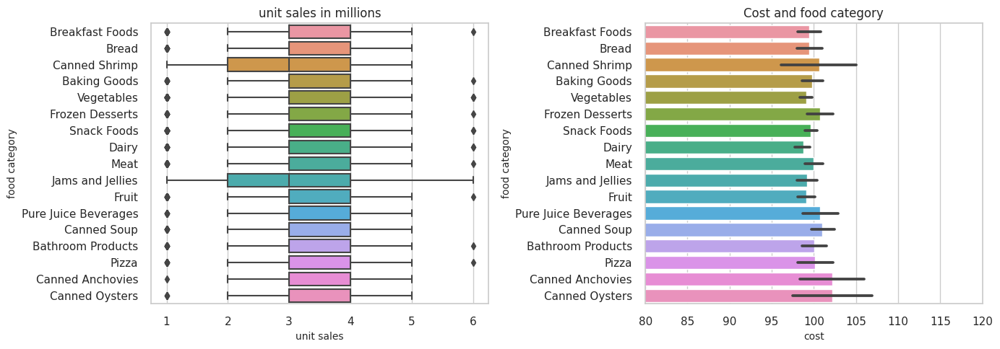

In [46]:
# get the top 10
top10_sales = df_prediction_f['food_category'].value_counts().index[:10]
top10_cost = df_prediction_f.groupby('food_category')['cost'].mean().sort_values(ascending=False).index[:10]

# filter df
top10 = df_prediction_f[df_prediction_f['food_category'].isin(top10_sales) | df_prediction_f['food_category'].isin(top10_cost)]

fig, (ax1, ax2) = mpl.subplots(1, 2, figsize=(14, 5))


sbn.boxplot(x='unit_sales(in millions)',
            y='food_category',
            data=top10,
            ax=ax1)

ax1.set_title("unit sales in millions", fontsize=12)
ax1.set_ylabel("food category", fontsize=10)
ax1.set_xlabel("unit sales", fontsize=10)


ax2.set_xlim(80, 120) # Dimension x-axis

sbn.barplot(x='cost',
            y='food_category',
            data=top10,
            ax=ax2)

ax2.set_title("Cost and food category", fontsize=12)
ax2.set_ylabel("food category", fontsize=10)
ax2.set_xlabel("cost", fontsize=10)

mpl.tight_layout()

mpl.show()

### Features

In [47]:
df_prediction_features = df_prediction_f.copy()

In [48]:
df_prediction_features.sample(7)

,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,gender,...,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost,population_city,population_country
29451,Meat,Deli,Food,6.88,2.1328,2.0,Two Day Sale,Mexico,S,M,...,5624.0,0.0,0.0,0.0,0.0,0.0,"Daily Paper, Radio, TV",97.34,21804515,128932753
19456,Snack Foods,Snack Foods,Food,6.92,3.2524,4.0,High Roller Savings,USA,M,F,...,3755.0,0.0,0.0,0.0,0.0,1.0,Daily Paper,101.84,3971883,331002651
11273,Dairy,Dairy,Food,10.14,3.3462,3.0,Shelf Clearing Days,Mexico,M,F,...,4262.0,1.0,1.0,1.0,1.0,1.0,Sunday Paper,98.81,920000,128932753
58979,Hot Beverages,Beverages,Drink,5.26,1.9988,2.0,Super Savers,USA,S,M,...,3164.0,1.0,0.0,0.0,0.0,0.0,In-Store Coupon,134.66,737015,331002651
34433,Paper Products,Household,Non-Consumable,10.12,4.8576,4.0,Green Light Days,USA,S,M,...,1635.0,0.0,0.0,0.0,0.0,0.0,Cash Register Handout,139.19,653115,331002651
39979,Snack Foods,Snack Foods,Food,8.19,3.2760,3.0,Saving Days,USA,M,M,...,1635.0,0.0,0.0,0.0,0.0,0.0,"Daily Paper, Radio",118.36,653115,331002651
2210,Vegetables,Produce,Food,2.78,0.9730,2.0,Cash Register Lottery,USA,S,F,...,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",59.86,152405,331002651


In [49]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
df_prediction_num = df_prediction_features.select_dtypes(include=numerics)
df_prediction_cat = df_prediction_features.select_dtypes(exclude=numerics)

In [50]:
display(df_prediction_num.sample(7))
print("------------------------------------------------------")
display(df_prediction_cat.sample(7))

,store_sales(in millions),store_cost(in millions),unit_sales(in millions),total_children,avg_cars_at home(approx),avg_yearly_income,num_children_at_home,SRP,gross_weight,net_weight,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
18369,5.94,2.4354,3.0,3.0,3.0,100000,0.0,1.98,15.70,14.60,...,5011.0,3340.0,1.0,1.0,1.0,1.0,1.0,128.20,34133,331002651
28962,2.50,0.8250,5.0,4.0,1.0,20000,4.0,0.50,9.61,8.60,...,4149.0,2766.0,1.0,0.0,1.0,1.0,1.0,89.90,100000,128932753
45831,2.16,0.7344,3.0,4.0,2.0,60000,3.0,0.72,9.71,7.71,...,4819.0,3213.0,0.0,0.0,0.0,0.0,0.0,132.60,214685,128932753
25422,7.59,3.2637,3.0,4.0,1.0,40000,2.0,2.53,20.40,18.30,...,4923.0,3282.0,0.0,0.0,0.0,0.0,0.0,86.42,220270,331002651
47935,6.78,2.5764,2.0,4.0,1.0,20000,0.0,3.39,18.80,17.70,...,2452.0,1635.0,0.0,0.0,0.0,0.0,0.0,53.01,653115,331002651
41691,6.20,3.0380,4.0,1.0,1.0,80000,0.0,1.55,20.70,18.70,...,4016.0,2678.0,1.0,1.0,1.0,1.0,1.0,53.21,2313652,37742154
10598,4.35,2.1315,3.0,2.0,3.0,40000,2.0,1.45,17.30,15.20,...,4746.0,3164.0,1.0,0.0,0.0,0.0,0.0,135.80,737015,331002651


------------------------------------------------------


,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,houseowner,brand_name,store_type,store_city,store_state,media_type
13854,Hot Beverages,Beverages,Drink,Super Savers,Mexico,S,F,Graduate Degree,Bronze,Professional,Y,Super,Mid-Size Grocery,Mexico City,DF,"Daily Paper, Radio"
32820,Canned Soup,Canned Foods,Food,Dimes Off,Mexico,M,M,High School Degree,Bronze,Manual,Y,Just Right,Deluxe Supermarket,Hidalgo,Zacatecas,Radio
9281,Snack Foods,Snack Foods,Food,Go For It,USA,S,M,Bachelors Degree,Bronze,Professional,Y,Fast,Supermarket,Portland,OR,Product Attachment
7882,Candy,Snacks,Food,Two for One,USA,S,F,Bachelors Degree,Bronze,Management,Y,Gulf Coast,Gourmet Supermarket,Beverly Hills,CA,Daily Paper
9164,Snack Foods,Snack Foods,Food,Pick Your Savings,USA,M,F,Partial High School,Normal,Skilled Manual,Y,Fort West,Gourmet Supermarket,Beverly Hills,CA,Sunday Paper
5231,Vegetables,Produce,Food,Big Time Savings,Mexico,M,M,High School Degree,Bronze,Skilled Manual,Y,High Top,Deluxe Supermarket,Merida,Yucatan,"Daily Paper, Radio"
8788,Snack Foods,Snack Foods,Food,Weekend Markdown,USA,S,F,Partial High School,Silver,Professional,N,Horatio,Supermarket,Seattle,WA,"Daily Paper, Radio"


In [51]:
df_prediction_cat_copy = df_prediction_cat.copy()
column_features = df_prediction_cat_copy.columns.to_list()
column_features

['food_category',
 'food_department',
 'food_family',
 'promotion_name',
 'sales_country',
 'marital_status',
 'gender',
 'education',
 'member_card',
 'occupation',
 'houseowner',
 'brand_name',
 'store_type',
 'store_city',
 'store_state',
 'media_type']

In [52]:
#Checking how many labels are there:
for col in df_prediction_cat_copy.columns[:]:
    print(col,':',len(df_prediction_cat_copy[col].unique()),'labels')

food_category : 45 labels
food_department : 22 labels
food_family : 3 labels
promotion_name : 49 labels
sales_country : 3 labels
marital_status : 2 labels
gender : 2 labels
education : 5 labels
member_card : 4 labels
occupation : 5 labels
houseowner : 2 labels
brand_name : 111 labels
store_type : 5 labels
store_city : 19 labels
store_state : 10 labels
media_type : 13 labels


In [53]:
display(df_prediction_cat_copy.occupation.value_counts())
print("------------------------------------------------------")
display(df_prediction_cat_copy.member_card.value_counts())

Professional      19915
Skilled Manual    15995
Manual            14624
Management         8805
Clerical           1089
Name: occupation, dtype: int64

------------------------------------------------------


Bronze    33807
Normal    13867
Golden     7556
Silver     5198
Name: member_card, dtype: int64

In [54]:
#capturing the counts in a dictionary so that we can use to re-map the labels: (count on the right hand side)
display(df_prediction_cat_copy.member_card.value_counts().to_dict())
print("-----------------------------------------------------------------")
display(df_prediction_cat_copy.education.value_counts().to_dict())

{'Bronze': 33807, 'Normal': 13867, 'Golden': 7556, 'Silver': 5198}

-----------------------------------------------------------------


{'Partial High School': 18201,
 'High School Degree': 17838,
 'Bachelors Degree': 15994,
 'Partial College': 5284,
 'Graduate Degree': 3111}

In [55]:
# list freqs
for c1 in column_features:
    maps1 = df_prediction_cat_copy[c1].value_counts().to_dict()
    print(maps1)

{'Vegetables': 7440, 'Snack Foods': 6919, 'Dairy': 3835, 'Meat': 3107, 'Fruit': 3080, 'Jams and Jellies': 2550, 'Baking Goods': 1947, 'Breakfast Foods': 1946, 'Bread': 1797, 'Canned Soup': 1722, 'Beer and Wine': 1590, 'Paper Products': 1568, 'Bathroom Products': 1552, 'Electrical': 1544, 'Candy': 1538, 'Frozen Desserts': 1446, 'Specialty': 1174, 'Starchy Foods': 1103, 'Magazines': 971, 'Kitchen Products': 969, 'Eggs': 952, 'Hot Beverages': 891, 'Hygiene': 831, 'Pain Relievers': 828, 'Pizza': 821, 'Carbonated Beverages': 782, 'Pure Juice Beverages': 760, 'Cleaning Supplies': 748, 'Side Dishes': 601, 'Frozen Entrees': 595, 'Drinks': 581, 'Plastic Products': 578, 'Hardware': 575, 'Cold Remedies': 399, 'Decongestants': 396, 'Canned Tuna': 395, 'Seafood': 375, 'Canned Anchovies': 213, 'Canned Clams': 199, 'Candles': 195, 'Miscellaneous': 194, 'Canned Oysters': 189, 'Canned Shrimp': 182, 'Packaged Vegetables': 179, 'Canned Sardines': 171}
{'Produce': 8521, 'Snack Foods': 6919, 'Household': 6

In [56]:
# list label/integer
def find_maps(data, variable):
    return {k: i for i, k in enumerate(data[variable].unique())}

for c2 in column_features:
    maps2 = find_maps(df_prediction_cat_copy, c2)
    print(maps2)

{'Breakfast Foods': 0, 'Bread': 1, 'Canned Shrimp': 2, 'Baking Goods': 3, 'Vegetables': 4, 'Frozen Desserts': 5, 'Candy': 6, 'Snack Foods': 7, 'Dairy': 8, 'Starchy Foods': 9, 'Cleaning Supplies': 10, 'Decongestants': 11, 'Meat': 12, 'Hot Beverages': 13, 'Jams and Jellies': 14, 'Carbonated Beverages': 15, 'Seafood': 16, 'Specialty': 17, 'Kitchen Products': 18, 'Electrical': 19, 'Beer and Wine': 20, 'Candles': 21, 'Fruit': 22, 'Pure Juice Beverages': 23, 'Canned Soup': 24, 'Paper Products': 25, 'Canned Tuna': 26, 'Eggs': 27, 'Hardware': 28, 'Canned Sardines': 29, 'Canned Clams': 30, 'Pain Relievers': 31, 'Side Dishes': 32, 'Bathroom Products': 33, 'Magazines': 34, 'Frozen Entrees': 35, 'Pizza': 36, 'Cold Remedies': 37, 'Canned Anchovies': 38, 'Drinks': 39, 'Hygiene': 40, 'Plastic Products': 41, 'Canned Oysters': 42, 'Packaged Vegetables': 43, 'Miscellaneous': 44}
{'Frozen Foods': 0, 'Baked Goods': 1, 'Canned Foods': 2, 'Baking Goods': 3, 'Produce': 4, 'Snacks': 5, 'Snack Foods': 6, 'Dair

# Encoding

In [57]:
df_prediction_cat_labl = df_prediction_cat.copy()
df_prediction_cat_freq = df_prediction_cat.copy()

In [58]:
display(df_prediction_cat_labl.sample(9))
print("------------------------------------------------------")
display(df_prediction_cat_freq.sample(9))

,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,houseowner,brand_name,store_type,store_city,store_state,media_type
32708,Canned Soup,Canned Foods,Food,Three for One,Mexico,M,M,Bachelors Degree,Silver,Management,Y,Blue Label,Deluxe Supermarket,Merida,Yucatan,"Sunday Paper, Radio"
42600,Pain Relievers,Health and Hygiene,Non-Consumable,Price Slashers,Mexico,S,M,Bachelors Degree,Bronze,Professional,Y,Faux Products,Supermarket,Acapulco,Guerrero,Street Handout
11498,Dairy,Dairy,Food,Go For It,Mexico,S,F,Partial High School,Normal,Manual,N,Gorilla,Deluxe Supermarket,Hidalgo,Zacatecas,Bulk Mail
5998,Vegetables,Produce,Food,Money Savers,USA,S,M,Bachelors Degree,Bronze,Professional,N,Hermanos,Supermarket,Bremerton,WA,"Sunday Paper, Radio, TV"
21390,Meat,Deli,Food,Super Savers,USA,S,F,High School Degree,Bronze,Manual,Y,Cutting Edge,Supermarket,Spokane,WA,"Sunday Paper, Radio"
58248,Paper Products,Household,Non-Consumable,Go For It,Mexico,M,M,Partial High School,Golden,Manual,Y,Cormorant,Mid-Size Grocery,Hidalgo,Zacatecas,Bulk Mail
36524,Meat,Deli,Food,You Save Days,USA,S,M,High School Degree,Bronze,Skilled Manual,N,American,Supermarket,Portland,OR,TV
56742,Baking Goods,Baking Goods,Food,Price Destroyers,USA,S,F,Bachelors Degree,Bronze,Professional,Y,CDR,Supermarket,Portland,OR,Sunday Paper
18787,Snack Foods,Snack Foods,Food,Savings Galore,Mexico,S,F,Partial High School,Bronze,Manual,N,Fast,Mid-Size Grocery,Hidalgo,Zacatecas,Sunday Paper


------------------------------------------------------


,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,houseowner,brand_name,store_type,store_city,store_state,media_type
12337,Starchy Foods,Starchy Foods,Food,Money Savers,USA,S,F,Graduate Degree,Bronze,Management,Y,Shady Lake,Small Grocery,San Francisco,CA,Radio
24735,Fruit,Produce,Food,Cash Register Lottery,USA,S,F,High School Degree,Bronze,Skilled Manual,Y,Ebony,Deluxe Supermarket,Salem,OR,"Sunday Paper, Radio"
23102,Beer and Wine,Alcoholic Beverages,Drink,Save-It Sale,USA,S,M,Bachelors Degree,Silver,Management,N,Pearl,Supermarket,Los Angeles,CA,Daily Paper
22175,Electrical,Household,Non-Consumable,Two for One,USA,S,M,High School Degree,Silver,Manual,N,Denny,Supermarket,Spokane,WA,"Daily Paper, Radio, TV"
52695,Hygiene,Health and Hygiene,Non-Consumable,Double Your Savings,USA,S,M,Bachelors Degree,Bronze,Management,Y,Steady,Supermarket,Seattle,WA,Radio
2606,Vegetables,Produce,Food,Double Down Sale,USA,M,M,Bachelors Degree,Bronze,Management,N,High Top,Deluxe Supermarket,Tacoma,WA,TV
30554,Frozen Desserts,Frozen Foods,Food,Sales Days,USA,M,M,Bachelors Degree,Bronze,Professional,Y,Golden,Supermarket,Spokane,WA,Bulk Mail
45054,Vegetables,Canned Foods,Food,Bag Stuffers,USA,M,M,Partial High School,Golden,Manual,Y,Better,Deluxe Supermarket,Salem,OR,Product Attachment
47041,Candy,Snacks,Food,Big Promo,USA,M,F,High School Degree,Golden,Professional,Y,Gulf Coast,Supermarket,Spokane,WA,Radio


In [59]:
# freq
def freq_encode(data, variable, ordinal_mapping):
    data[variable] = data[variable].map(ordinal_mapping)

for var_freq in column_features:
    map_freq = df_prediction_cat_freq[var_freq].value_counts().to_dict()
    freq_encode(df_prediction_cat_freq, var_freq, map_freq)

# label
def find_category_mappings(data, variable):
    return {k: i for i, k in enumerate(data[variable].unique())}

def integer_encode(data, variable, ordinal_mapping):
    data[variable] = data[variable].map(ordinal_mapping)

for var_labl in column_features:
    map_labl = find_category_mappings(df_prediction_cat_labl, var_labl)
    integer_encode(df_prediction_cat_labl, var_labl, map_labl)

In [60]:
display(df_prediction_cat_freq.sample(9))
print("------------------------------------------------------")
display(df_prediction_cat_labl.sample(9))

,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,houseowner,brand_name,store_type,store_city,store_state,media_type
40045,6919,6919,43284,1042,17572,30073,30942,17838,33807,15995,23918,1425,22954,4498,4498,4050
10606,3835,3835,43284,1150,38892,30355,30942,18201,13867,14624,36510,806,26192,5051,19370,6820
52450,3107,2787,43284,402,38892,30355,29486,5284,33807,1089,36510,558,26192,3451,19370,3576
11039,3835,3835,43284,2330,38892,30355,30942,15994,33807,8805,23918,855,26192,5150,10628,5119
6242,7440,8521,43284,402,38892,30073,29486,17838,7556,15995,36510,1592,26192,3451,19370,3576
4894,7440,8521,43284,1702,17572,30355,29486,17838,33807,15995,23918,1729,22954,4498,4498,4859
18436,6919,6919,43284,389,38892,30355,29486,17838,33807,15995,23918,1405,26192,5150,10628,4002
18793,6919,6919,43284,876,17572,30073,30942,18201,13867,14624,36510,1304,22954,4761,7113,3346
14058,3835,3835,5571,1555,38892,30073,29486,18201,33807,8805,23918,706,22954,5478,10628,6820


------------------------------------------------------


,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,houseowner,brand_name,store_type,store_city,store_state,media_type
9773,7,6,0,9,1,0,0,2,2,0,0,31,4,11,6,0
37340,27,17,0,32,0,0,0,4,2,0,0,87,1,6,0,0
17151,9,8,0,38,0,1,0,0,0,2,1,44,1,2,1,0
45960,4,2,0,41,2,1,0,0,2,1,1,14,0,12,7,4
10702,8,7,0,23,0,0,0,1,2,1,1,37,1,3,1,6
33654,14,3,0,5,1,0,0,0,2,2,1,19,0,9,4,0
9871,7,6,0,22,2,0,1,4,3,0,1,31,0,12,7,8
50133,18,9,1,2,0,1,0,2,2,2,0,49,0,0,0,0
17355,9,8,0,33,0,1,1,3,2,1,0,41,1,6,0,9


In [61]:
prediction_freq_df = pds.concat([df_prediction_cat_freq, df_prediction_num], axis=1)
prediction_labl_df = pds.concat([df_prediction_cat_labl, df_prediction_num], axis=1)

In [62]:
display(prediction_freq_df.sample(9))
print("------------------------------------------------------")
display(prediction_freq_df.info())
print("------------------------------------------------------")
display(prediction_freq_df.isnull().sum())

,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
2588,7440,8521,43284,2108,38892,30355,30942,15994,33807,19915,...,7041.0,4694.0,1.0,0.0,1.0,1.0,1.0,94.63,216457,331002651
23566,1590,1590,5571,1843,17572,30355,30942,18201,13867,15995,...,4819.0,3213.0,0.0,0.0,0.0,0.0,0.0,146.72,214685,128932753
15364,2550,4497,43284,2321,38892,30073,29486,17838,33807,15995,...,5011.0,3340.0,1.0,1.0,1.0,1.0,1.0,149.75,34133,331002651
54287,578,6185,11573,972,38892,30073,30942,5284,5198,14624,...,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,69.47,152405,331002651
37478,952,952,43284,1493,17572,30355,30942,18201,33807,14624,...,5188.0,3458.0,1.0,1.0,1.0,1.0,1.0,68.63,214685,128932753
14244,3835,3835,5571,1217,38892,30073,30942,18201,33807,8805,...,4746.0,3164.0,1.0,0.0,0.0,0.0,0.0,66.78,737015,331002651
24337,2550,4497,43284,2279,38892,30355,29486,15994,33807,19915,...,5011.0,3340.0,1.0,1.0,1.0,1.0,1.0,128.20,34133,331002651
32734,1722,4238,43284,1690,17572,30073,30942,15994,33807,8805,...,6393.0,4262.0,1.0,1.0,1.0,1.0,1.0,98.81,920000,128932753
49085,1946,778,43284,2108,17572,30073,30942,15994,7556,8805,...,3671.0,2447.0,0.0,0.0,0.0,0.0,0.0,103.90,763331,128932753


------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60428 entries, 0 to 60427
Data columns (total 41 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   food_category             60428 non-null  int64  
 1   food_department           60428 non-null  int64  
 2   food_family               60428 non-null  int64  
 3   promotion_name            60428 non-null  int64  
 4   sales_country             60428 non-null  int64  
 5   marital_status            60428 non-null  int64  
 6   gender                    60428 non-null  int64  
 7   education                 60428 non-null  int64  
 8   member_card               60428 non-null  int64  
 9   occupation                60428 non-null  int64  
 10  houseowner                60428 non-null  int64  
 11  brand_name                60428 non-null  int64  
 12  store_type                60428 non-null  int64  
 13  store_

None

------------------------------------------------------


food_category               0
food_department             0
food_family                 0
promotion_name              0
sales_country               0
marital_status              0
gender                      0
education                   0
member_card                 0
occupation                  0
houseowner                  0
brand_name                  0
store_type                  0
store_city                  0
store_state                 0
media_type                  0
store_sales(in millions)    0
store_cost(in millions)     0
unit_sales(in millions)     0
total_children              0
avg_cars_at home(approx)    0
avg_yearly_income           0
num_children_at_home        0
SRP                         0
gross_weight                0
net_weight                  0
recyclable_package          0
low_fat                     0
units_per_case              0
store_sqft                  0
grocery_sqft                0
frozen_sqft                 0
meat_sqft                   0
coffee_bar

In [63]:
display(prediction_labl_df.sample(9))
print("------------------------------------------------------")
display(prediction_labl_df.info())
print("------------------------------------------------------")
display(prediction_labl_df.isnull().sum())

,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
45438,4,2,0,24,0,0,0,0,0,0,...,5633.0,3755.0,0.0,0.0,0.0,0.0,1.0,81.79,3971883,331002651
59453,34,18,1,37,1,1,1,0,0,0,...,3671.0,2447.0,0.0,0.0,0.0,0.0,0.0,112.19,763331,128932753
58299,25,9,1,22,2,1,0,0,0,0,...,4016.0,2678.0,1.0,1.0,1.0,1.0,1.0,144.54,2313652,37742154
29059,12,14,0,1,0,0,1,0,2,0,...,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,55.59,152405,331002651
36026,26,2,0,22,1,0,0,4,2,4,...,5062.0,3375.0,0.0,0.0,1.0,1.0,0.0,144.31,150000,128932753
47783,36,0,0,43,0,1,0,3,2,1,...,4923.0,3282.0,0.0,0.0,0.0,0.0,0.0,106.66,220270,331002651
22518,19,9,1,43,1,0,0,4,2,4,...,5188.0,3458.0,1.0,1.0,1.0,1.0,1.0,79.59,214685,128932753
2962,4,4,0,17,0,1,0,4,1,4,...,4746.0,3164.0,1.0,0.0,0.0,0.0,0.0,137.77,737015,331002651
46157,35,0,0,1,0,1,0,1,2,3,...,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,95.78,152405,331002651


------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60428 entries, 0 to 60427
Data columns (total 41 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   food_category             60428 non-null  int64  
 1   food_department           60428 non-null  int64  
 2   food_family               60428 non-null  int64  
 3   promotion_name            60428 non-null  int64  
 4   sales_country             60428 non-null  int64  
 5   marital_status            60428 non-null  int64  
 6   gender                    60428 non-null  int64  
 7   education                 60428 non-null  int64  
 8   member_card               60428 non-null  int64  
 9   occupation                60428 non-null  int64  
 10  houseowner                60428 non-null  int64  
 11  brand_name                60428 non-null  int64  
 12  store_type                60428 non-null  int64  
 13  store_

None

------------------------------------------------------


food_category               0
food_department             0
food_family                 0
promotion_name              0
sales_country               0
marital_status              0
gender                      0
education                   0
member_card                 0
occupation                  0
houseowner                  0
brand_name                  0
store_type                  0
store_city                  0
store_state                 0
media_type                  0
store_sales(in millions)    0
store_cost(in millions)     0
unit_sales(in millions)     0
total_children              0
avg_cars_at home(approx)    0
avg_yearly_income           0
num_children_at_home        0
SRP                         0
gross_weight                0
net_weight                  0
recyclable_package          0
low_fat                     0
units_per_case              0
store_sqft                  0
grocery_sqft                0
frozen_sqft                 0
meat_sqft                   0
coffee_bar

### Correlation (no scaled)

In [64]:
def correl_chart(df_data):
    corr = df_data.corr()
    mpl.rcParams['font.family']='DejaVu Sans'
    mpl.figure(figsize = (16, 11))
    #sbn.heatmap(corr, annot= True)
    sbn.heatmap(corr)

def correl_vars_feat(df_data):
    corr = df_data.corr()
    #Correlation with member_card variable
    cor_target = abs(corr["member_card"])
    #Selecting highly correlated features
    relevant_features = cor_target[cor_target > 0.5]
    display(relevant_features)

def correl_list(df_data):
    corr = df_data.corr()
    corr_features = corr["member_card"].sort_values(ascending=False)
    print(corr_features)

------------------------------------------------------


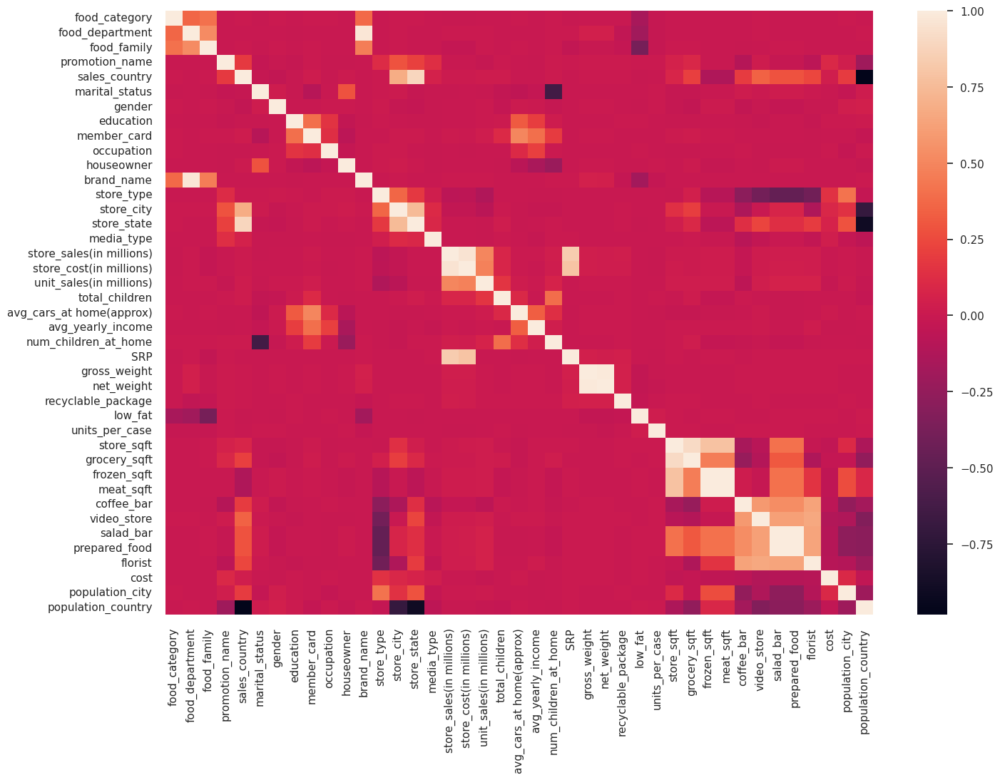

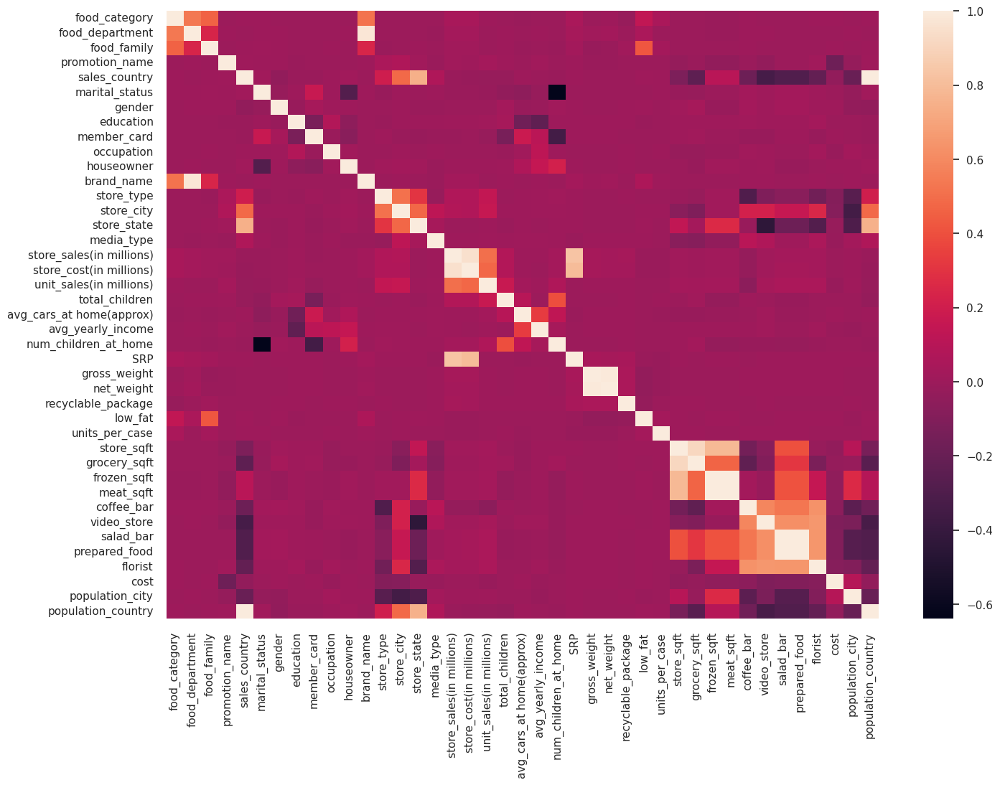

In [65]:
correl_chart(prediction_labl_df)
print("------------------------------------------------------")
correl_chart(prediction_freq_df)

In [66]:
correl_vars_feat(prediction_labl_df)
print("------------------------------------------------------")
correl_vars_feat(prediction_freq_df)

member_card    1.0
Name: member_card, dtype: float64

------------------------------------------------------


member_card    1.0
Name: member_card, dtype: float64

In [67]:
correl_list(prediction_labl_df)
print("------------------------------------------------------")
correl_list(prediction_freq_df)

member_card                 1.000000
avg_cars_at home(approx)    0.496933
avg_yearly_income           0.403204
education                   0.401094
num_children_at_home        0.192490
occupation                  0.128667
total_children              0.108770
unit_sales(in millions)     0.030262
grocery_sqft                0.021044
sales_country               0.019085
store_sqft                  0.015351
store_city                  0.012056
store_state                 0.010228
store_sales(in millions)    0.010034
store_cost(in millions)     0.007463
net_weight                  0.005419
food_family                 0.005236
promotion_name              0.004854
gross_weight                0.004842
food_category               0.004005
meat_sqft                   0.001371
frozen_sqft                 0.001365
recyclable_package          0.001048
low_fat                     0.000661
prepared_food              -0.000173
salad_bar                  -0.000173
food_department            -0.000897
b

In [68]:
display(prediction_labl_df.describe().T)
print("------------------------------------------------------")
display(prediction_freq_df.describe().T)

,count,mean,std,min,25%,50%,75%,max
food_category,60428.0,1.480987e+01,1.133978e+01,0.000000e+00,6.000000e+00,1.200000e+01,2.200000e+01,4.400000e+01
food_department,60428.0,6.815897e+00,4.966012e+00,0.000000e+00,3.000000e+00,6.000000e+00,1.000000e+01,2.100000e+01
food_family,60428.0,3.759019e-01,6.472954e-01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.000000e+00
promotion_name,60428.0,2.086505e+01,1.336247e+01,0.000000e+00,9.000000e+00,2.000000e+01,3.200000e+01,4.800000e+01
sales_country,60428.0,4.219898e-01,6.124688e-01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.000000e+00
marital_status,60428.0,5.023334e-01,4.999987e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
gender,60428.0,4.879526e-01,4.998590e-01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
education,60428.0,1.359287e+00,1.208408e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.000000e+00,4.000000e+00
member_card,60428.0,1.580062e+00,9.760369e-01,0.000000e+00,1.000000e+00,2.000000e+00,2.000000e+00,3.000000e+00
occupation,60428.0,1.322797e+00,1.071242e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.000000e+00,4.000000e+00


------------------------------------------------------


,count,mean,std,min,25%,50%,75%,max
food_category,60428.0,3.047930e+03,2.481804e+03,1.710000e+02,1.103000e+03,1.946000e+03,3.835000e+03,7.440000e+03
food_department,60428.0,4.847741e+03,2.376519e+03,2.250000e+02,3.014000e+03,4.497000e+03,6.919000e+03,8.521000e+03
food_family,60428.0,3.373395e+04,1.524828e+04,5.571000e+03,1.157300e+04,4.328400e+04,4.328400e+04,4.328400e+04
promotion_name,60428.0,1.487311e+03,5.137479e+02,2.100000e+02,1.099000e+03,1.493000e+03,1.843000e+03,2.330000e+03
sales_country,60428.0,3.040107e+04,1.183690e+04,3.964000e+03,1.757200e+04,3.889200e+04,3.889200e+04,3.889200e+04
marital_status,60428.0,3.021466e+04,1.409996e+02,3.007300e+04,3.007300e+04,3.035500e+04,3.035500e+04,3.035500e+04
gender,60428.0,3.023154e+04,7.277947e+02,2.948600e+04,2.948600e+04,3.094200e+04,3.094200e+04,3.094200e+04
education,60428.0,1.560332e+04,4.570922e+03,3.111000e+03,1.599400e+04,1.783800e+04,1.820100e+04,1.820100e+04
member_card,60428.0,2.348778e+04,1.188826e+04,5.198000e+03,1.386700e+04,3.380700e+04,3.380700e+04,3.380700e+04
occupation,60428.0,1.563882e+04,4.114532e+03,1.089000e+03,1.462400e+04,1.599500e+04,1.991500e+04,1.991500e+04


In [69]:
prediction_labl_df_copy = prediction_labl_df.copy()
prediction_freq_df_copy = prediction_freq_df.copy()

In [70]:
display(prediction_labl_df_copy.head())
print("------------------------------------------------------")
display(prediction_freq_df_copy.head())

,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
0,0,0,0,0,0,0,0,0,0,0,...,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,126.62,152405,331002651
1,0,0,0,1,0,0,1,1,1,1,...,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,59.86,152405,331002651
2,0,0,0,2,0,1,0,0,0,2,...,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,84.16,152405,331002651
3,0,0,0,1,0,0,0,2,2,2,...,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,95.78,152405,331002651
4,0,0,0,3,0,0,1,0,2,0,...,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,50.79,152405,331002651


------------------------------------------------------


,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
0,1946,6126,43284,1066,38892,30073,30942,18201,13867,15995,...,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,126.62,152405,331002651
1,1946,6126,43284,1555,38892,30073,29486,15994,5198,19915,...,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,59.86,152405,331002651
2,1946,6126,43284,1741,38892,30355,30942,18201,13867,14624,...,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,84.16,152405,331002651
3,1946,6126,43284,1555,38892,30073,30942,17838,33807,14624,...,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,95.78,152405,331002651
4,1946,6126,43284,1755,38892,30073,29486,18201,33807,15995,...,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,50.79,152405,331002651


### Outliers BoxPlot and Fixing

In [71]:
def bxplt_outliers_df(df_data):
    mpl.figure(figsize=(11,11))
    mpl.rcParams['font.family']='DejaVu Sans'
    sbn.boxplot(data=df_data)
    mpl.xticks(rotation=90)
    mpl.show()

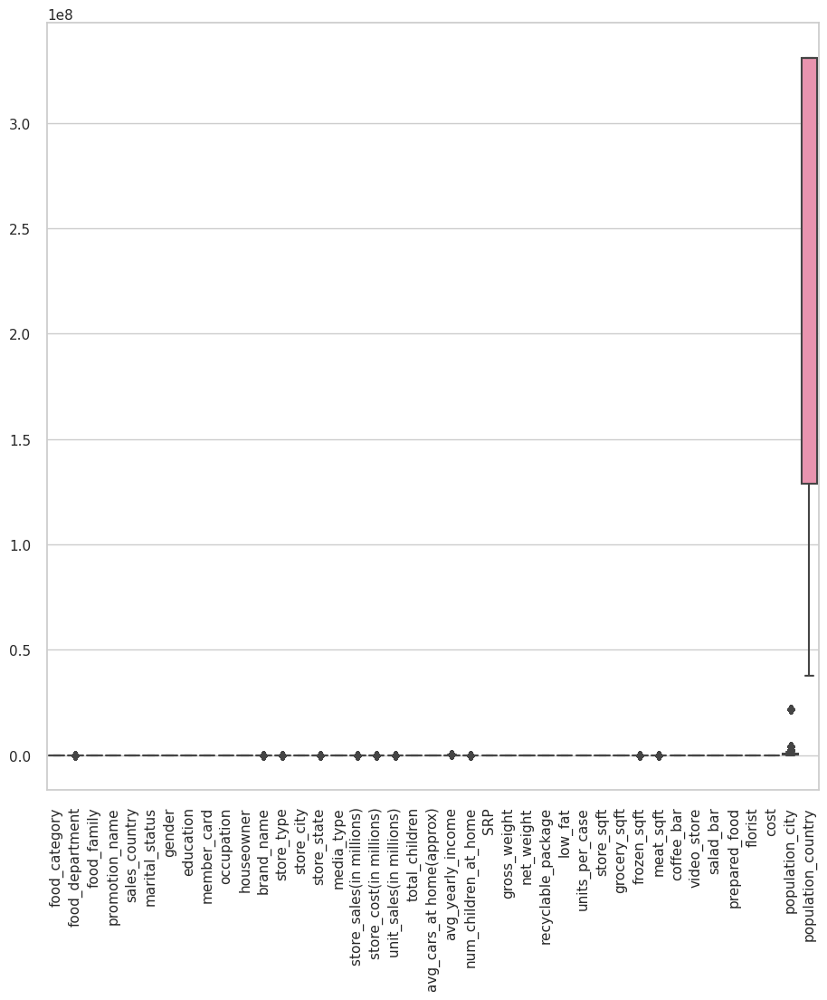

------------------------------------------------------


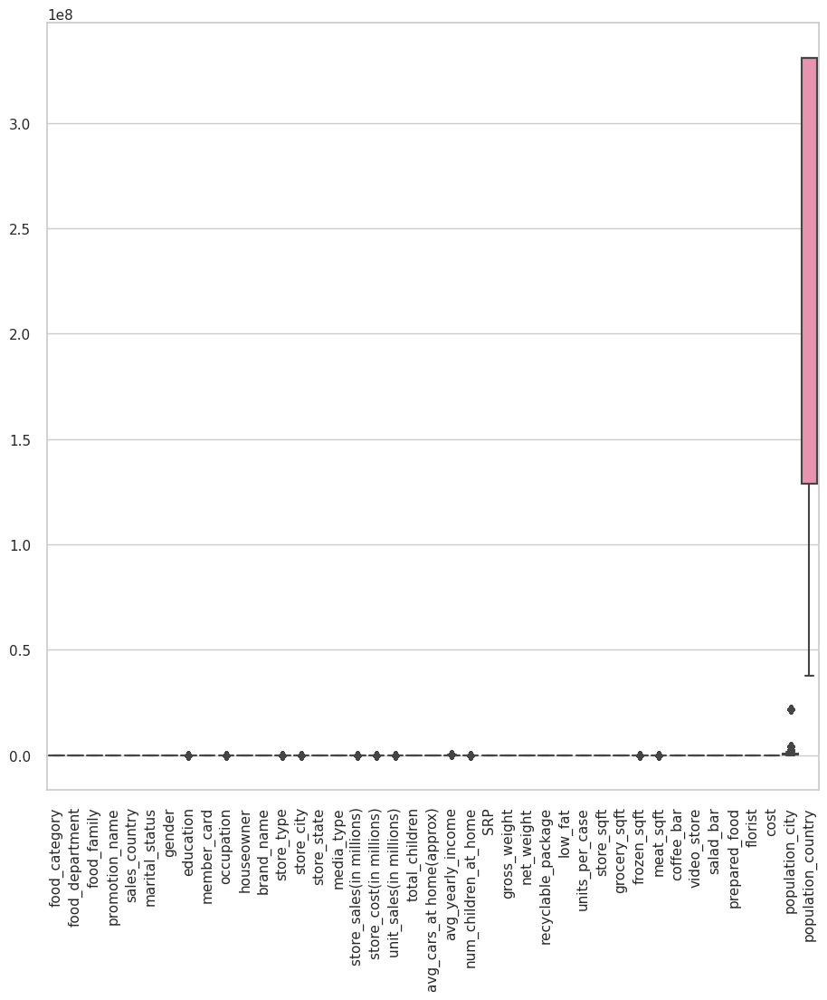

In [72]:
bxplt_outliers_df(prediction_labl_df_copy)
print("------------------------------------------------------")
bxplt_outliers_df(prediction_freq_df_copy)

In [73]:
def bxplt_outliers_rmve_pop(df_data):
    col1 = 'population_country'
    col2 = 'population_city'

    df = df_data.drop([col1, col2], axis=1)

    mpl.figure(figsize = (11,11))
    mpl.rcParams['font.family']='DejaVu Sans'
    sbn.boxplot(data = df)
    mpl.xticks(rotation = 90)
    mpl.show()

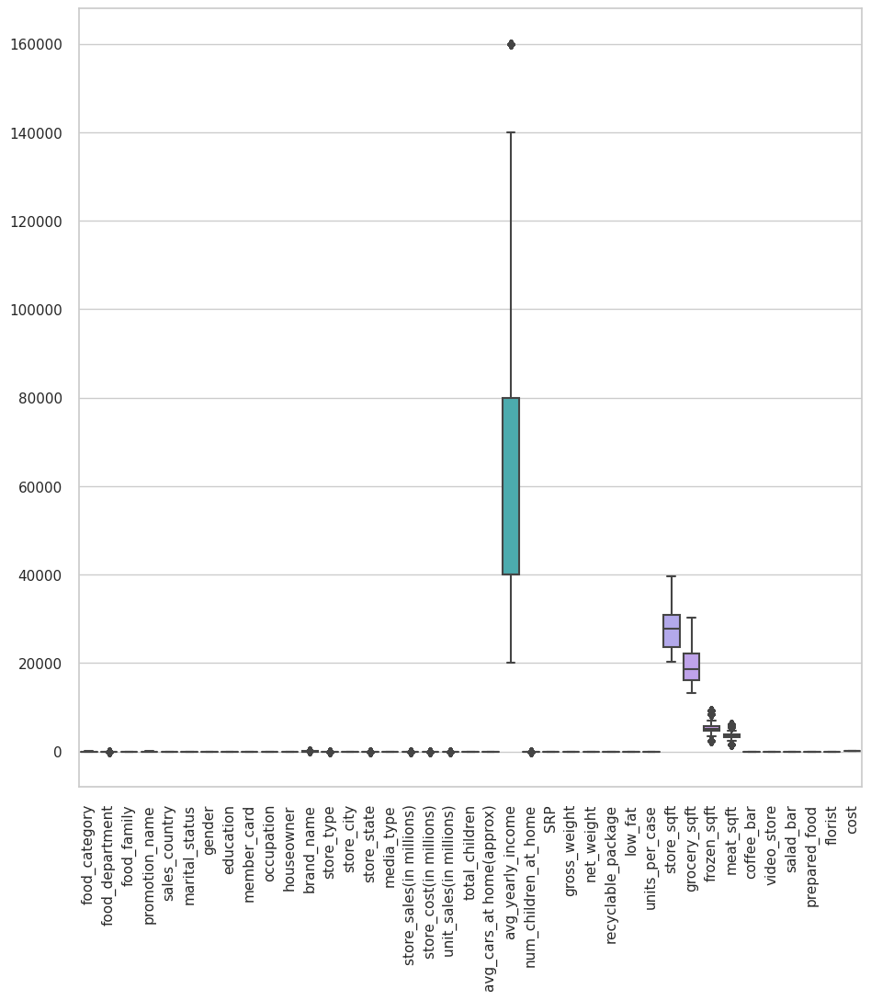

------------------------------------------------------


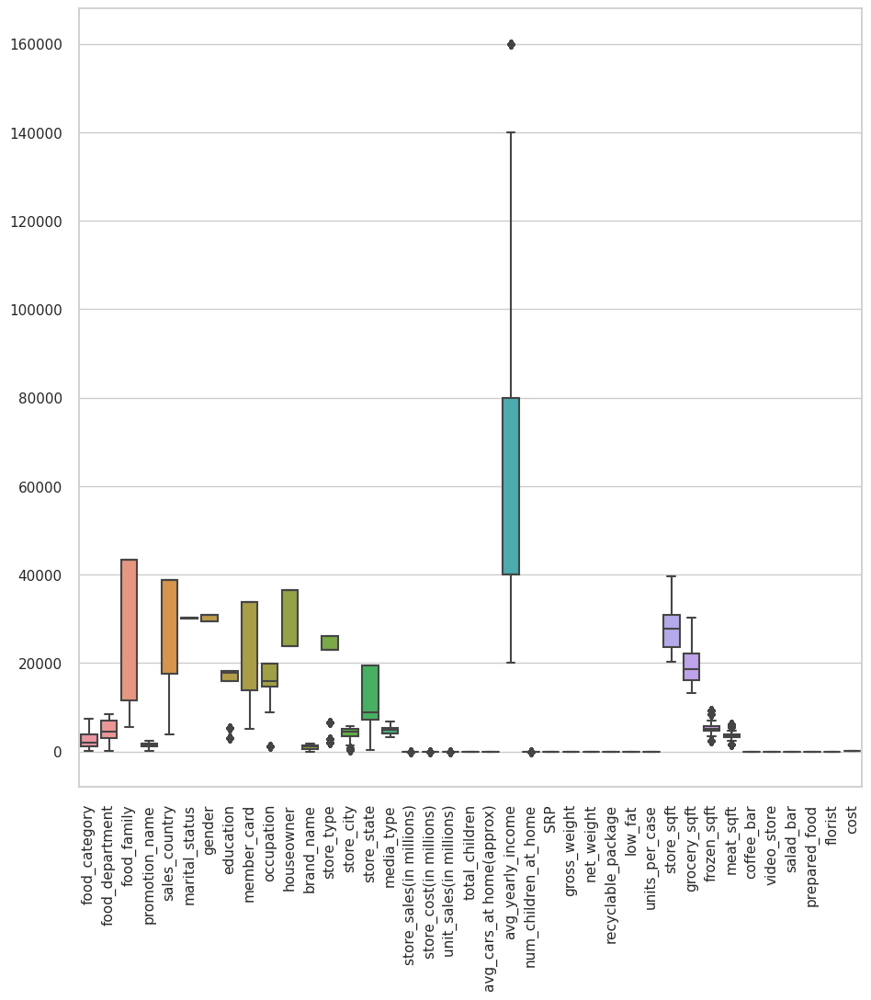

In [74]:
bxplt_outliers_rmve_pop(prediction_labl_df_copy)
print("------------------------------------------------------")
bxplt_outliers_rmve_pop(prediction_freq_df_copy)

In [75]:
def outlier_thresholds(data, variable):
    Q1 = data[variable].quantile(0.25)
    Q3 = data[variable].quantile(0.75)
    IQR = Q3 - Q1
    whisker_width = 1.5

    upper_limit = Q3 + whisker_width * IQR
    lower_limit = Q1 - whisker_width * IQR
    return lower_limit, upper_limit

def replace_with_thresholds(data, variable):
    lower_limit, upper_limit = outlier_thresholds(data, variable)
    data.loc[(data[variable] < lower_limit), variable] = lower_limit
    data.loc[(data[variable] > upper_limit), variable] = upper_limit

for ol in prediction_labl_df_copy.columns:
    replace_with_thresholds(prediction_labl_df_copy, ol)

for of in prediction_freq_df_copy.columns:
    replace_with_thresholds(prediction_freq_df_copy, of)

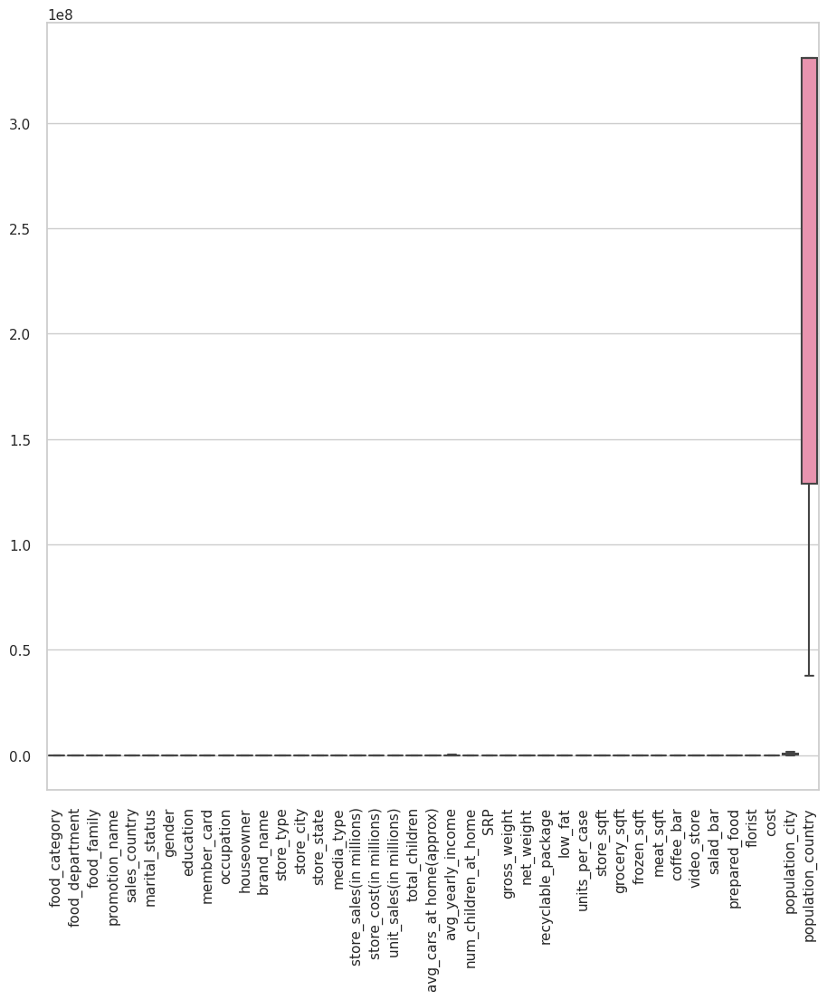

------------------------------------------------------


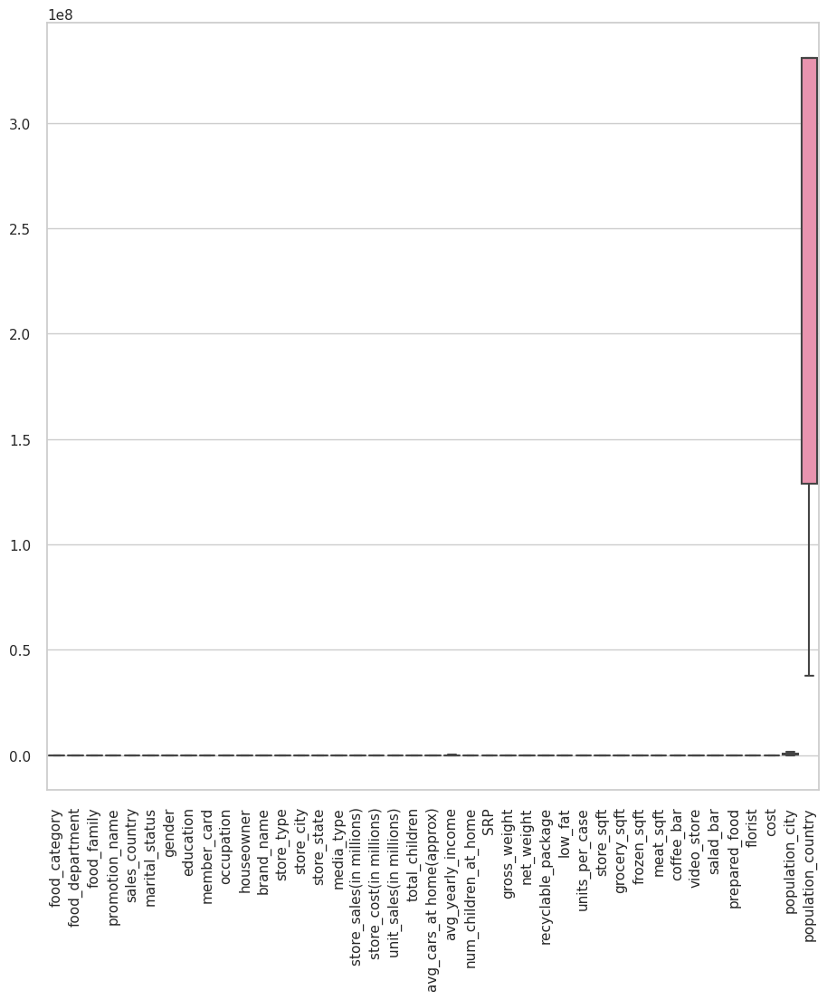

In [76]:
bxplt_outliers_df(prediction_labl_df_copy)
print("------------------------------------------------------")
bxplt_outliers_df(prediction_freq_df_copy)

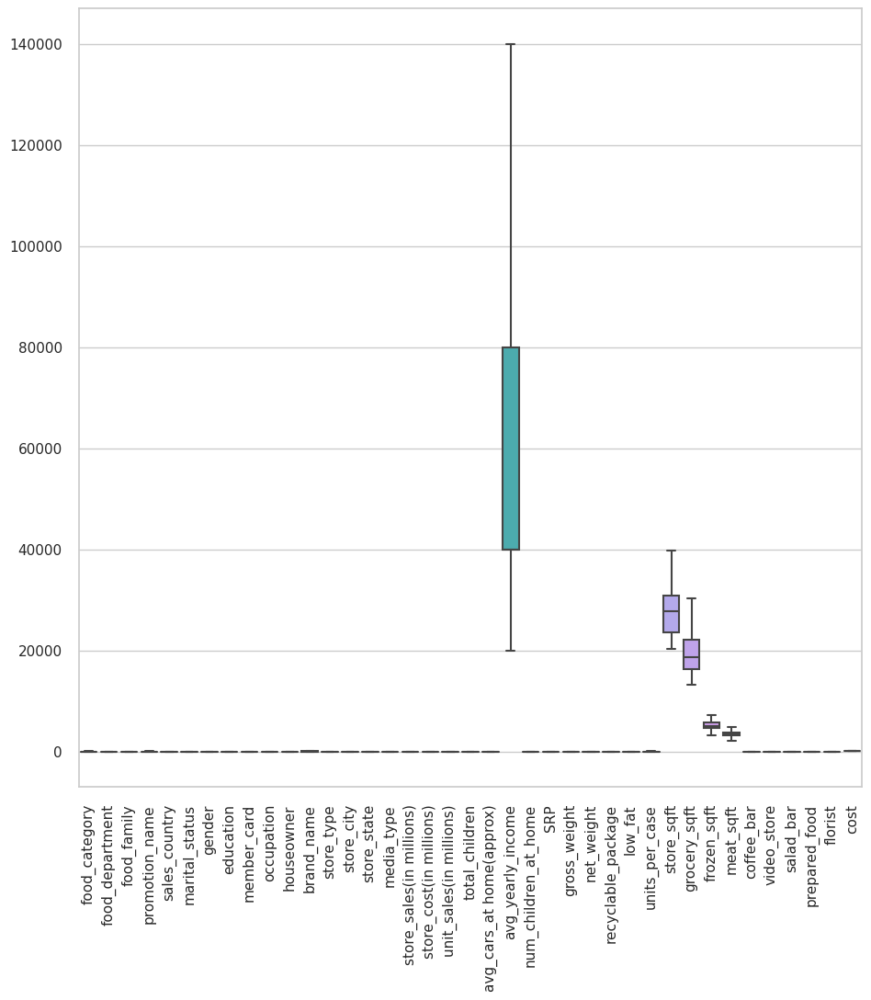

------------------------------------------------------


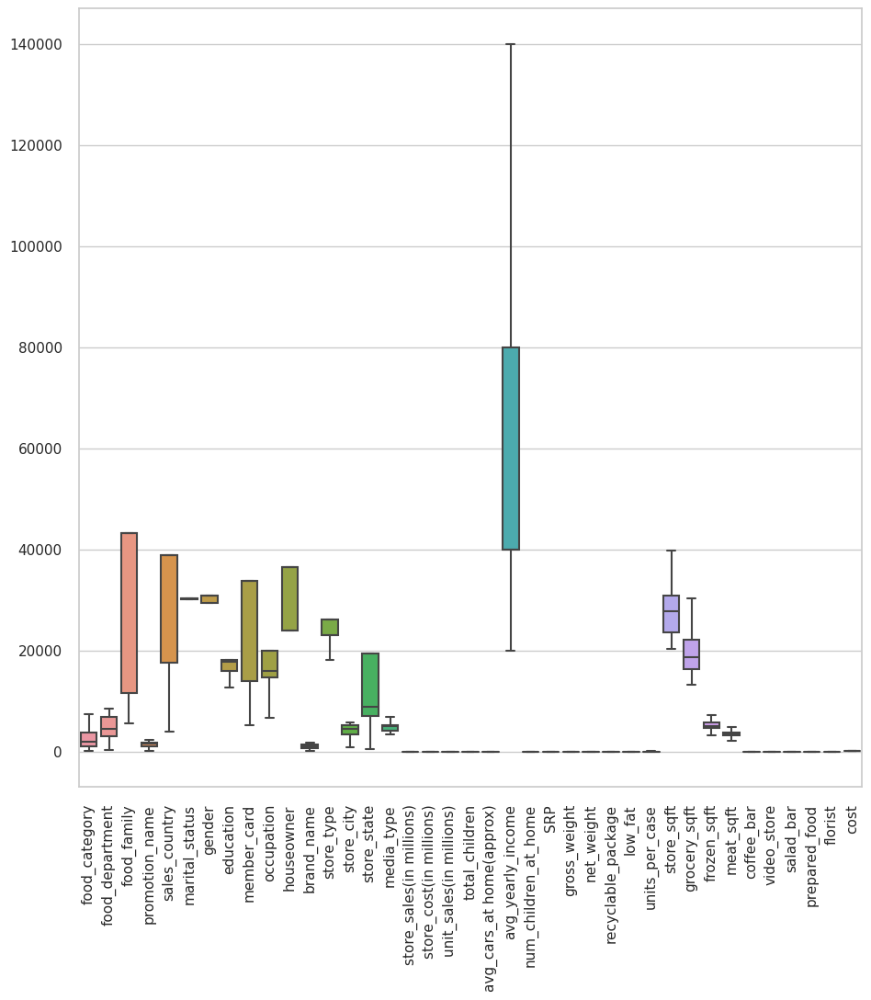

In [77]:
bxplt_outliers_rmve_pop(prediction_labl_df_copy)
print("------------------------------------------------------")
bxplt_outliers_rmve_pop(prediction_freq_df_copy)

In [78]:
display(prediction_labl_df_copy.sample(6))
print("------------------------------------------------------")
display(prediction_freq_df_copy.sample(6))

,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
29328,12,14.0,0.0,34.0,0.0,1.0,1.0,1,2.0,1,...,3238.5,2159.0,0.0,0.0,0.0,0.0,0.0,137.70,653115,331002651
14360,8,7.0,2.0,2.0,0.0,1.0,1.0,1,2.0,3,...,5633.0,3755.0,0.0,0.0,0.0,0.0,1.0,101.84,1679720,331002651
38783,7,6.0,0.0,24.0,0.0,0.0,0.0,2,2.0,2,...,5011.0,3340.0,1.0,1.0,1.0,1.0,1.0,81.79,34133,331002651
58656,8,7.0,0.0,36.0,1.0,0.0,1.0,2,3.0,2,...,7258.5,4839.0,0.0,0.0,0.0,0.0,0.0,109.09,1679720,128932753
32662,24,2.0,0.0,13.0,1.0,0.0,0.0,2,2.0,0,...,6393.0,4262.0,1.0,1.0,1.0,1.0,1.0,62.40,920000,128932753
8890,7,6.0,0.0,21.0,0.0,0.0,1.0,2,3.0,0,...,4923.0,3282.0,0.0,0.0,0.0,0.0,0.0,97.45,220270,331002651


------------------------------------------------------


,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
22386,1544,6185.0,11573.0,1042,17572,30355,30942,18201.0,13867,15995.0,...,5062.0,3375.0,0.0,0.0,1.0,1.0,0.0,125.48,150000,128932753
50745,1552,3807.0,11573.0,1075,38892,30073,30942,18201.0,13867,15995.0,...,5633.0,3755.0,0.0,0.0,0.0,0.0,1.0,131.81,1679720,331002651
13257,3107,385.0,43284.0,389,38892,30355,29486,18201.0,13867,15995.0,...,7258.5,4839.0,0.0,0.0,1.0,1.0,0.0,109.14,37056,331002651
9578,6919,6919.0,43284.0,910,17572,30355,29486,15994.0,7556,8805.0,...,6393.0,4262.0,1.0,1.0,1.0,1.0,1.0,99.38,920000,128932753
2935,7440,8521.0,43284.0,2330,38892,30073,29486,18201.0,13867,14624.0,...,4746.0,3164.0,1.0,0.0,0.0,0.0,0.0,133.60,737015,331002651
44519,6919,6919.0,43284.0,1480,38892,30355,29486,15994.0,33807,19915.0,...,4923.0,3282.0,0.0,0.0,0.0,0.0,0.0,59.40,220270,331002651


In [79]:
prediction_labl_df_copy = prediction_labl_df_copy.astype('int64')

In [80]:
display(prediction_labl_df_copy.info())
print("------------------------------------------------------")
display(prediction_labl_df_copy.sample(7))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60428 entries, 0 to 60427
Data columns (total 41 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   food_category             60428 non-null  int64
 1   food_department           60428 non-null  int64
 2   food_family               60428 non-null  int64
 3   promotion_name            60428 non-null  int64
 4   sales_country             60428 non-null  int64
 5   marital_status            60428 non-null  int64
 6   gender                    60428 non-null  int64
 7   education                 60428 non-null  int64
 8   member_card               60428 non-null  int64
 9   occupation                60428 non-null  int64
 10  houseowner                60428 non-null  int64
 11  brand_name                60428 non-null  int64
 12  store_type                60428 non-null  int64
 13  store_city                60428 non-null  int64
 14  store_state               60428 non-nu

None

------------------------------------------------------


,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
21453,12,14,0,11,0,1,1,1,2,3,...,5633,3755,0,0,0,0,1,53,1679720,331002651
32088,24,2,0,26,0,0,0,2,2,0,...,4923,3282,0,0,0,0,0,57,220270,331002651
16080,15,12,2,11,0,0,1,2,0,0,...,4746,3164,1,0,0,0,0,69,737015,331002651
28672,19,9,1,16,1,1,1,2,2,2,...,5062,3375,0,0,1,1,0,105,150000,128932753
7175,5,0,0,7,1,0,0,1,2,1,...,5062,3375,0,0,1,1,0,77,150000,128932753
787,1,1,0,16,1,0,0,0,0,0,...,4819,3213,0,0,0,0,0,135,214685,128932753
46643,35,0,0,7,2,0,1,1,2,1,...,4016,2678,1,1,1,1,1,77,1679720,37742154


### Random variable and DFs for testing

In [81]:
# df for testing classifier
prediction_labl_df_int = prediction_labl_df_copy.copy().astype('int64')
prediction_freq_df_int = prediction_freq_df_copy.copy().astype('int64')

In [82]:
display(prediction_labl_df_int.sample(6))
print("------------------------------------------------------")
display(prediction_freq_df_int.sample(6))

,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
53431,4,0,0,10,0,0,1,1,2,1,...,7041,4694,1,0,1,1,1,69,216457,331002651
2698,4,4,0,10,0,0,1,2,3,2,...,7041,4694,1,0,1,1,1,69,216457,331002651
56805,3,3,0,40,1,1,0,3,3,1,...,6393,4262,1,1,1,1,1,65,920000,128932753
36706,12,14,0,42,2,1,1,2,2,2,...,4016,2678,1,1,1,1,1,122,1679720,37742154
5115,4,4,0,13,1,0,0,0,0,0,...,6393,4262,1,1,1,1,1,62,920000,128932753
43745,4,0,0,29,0,1,0,0,2,0,...,4746,3164,1,0,0,0,0,90,737015,331002651


------------------------------------------------------


,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
30432,1446,6126,43284,1212,38892,30073,29486,17838,7556,14624,...,7041,4694,1,0,1,1,1,149,216457,331002651
40480,1797,1797,43284,1326,38892,30073,30942,15994,33807,19915,...,7041,4694,1,0,1,1,1,136,216457,331002651
35410,3080,400,43284,608,38892,30073,29486,17838,33807,19915,...,3561,2374,1,0,0,0,0,139,80888,331002651
15381,2550,4497,43284,868,38892,30073,30942,17838,13867,14624,...,5011,3340,1,1,1,1,1,53,34133,331002651
5852,7440,8521,43284,972,3964,30355,29486,17838,5198,14624,...,4016,2678,1,1,1,1,1,102,1679720,37742154
37737,952,952,43284,1075,38892,30073,29486,18201,13867,14624,...,4294,2863,1,0,0,0,0,95,873965,331002651


In [83]:
df_labl_rand = prediction_labl_df_copy.copy()
df_freq_rand = prediction_freq_df_copy.copy()

# add a new column with random values between 0 and 100
df_labl_rand['Rand_Var_lb'] = npy.random.randint(0, 100, size=len(df_labl_rand))
# add a new column with random values between 100 and 1000
df_freq_rand['Rand_Var_fq'] = npy.random.randint(100, 1000, size=len(df_freq_rand))

In [84]:
display(df_labl_rand.sample(6))
print("------------------------------------------------------")
display(df_freq_rand.sample(6))

,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country,Rand_Var_lb
470,1,1,0,33,0,0,0,2,3,1,...,3755,0,0,0,0,1,131,1679720,331002651,23
59352,34,18,1,24,0,1,1,1,2,1,...,3755,0,0,0,0,1,81,1679720,331002651,98
14874,8,7,2,36,0,0,1,0,0,0,...,4839,0,0,1,1,0,118,37056,331002651,34
22556,19,9,1,18,2,1,1,2,2,1,...,2678,1,1,1,1,1,95,1679720,37742154,27
36601,12,14,0,34,1,0,1,1,3,3,...,4262,1,1,1,1,1,99,920000,128932753,56
12540,11,10,1,6,0,0,1,1,2,1,...,3610,1,1,1,1,1,80,152405,331002651,99


------------------------------------------------------


,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country,Rand_Var_fq
9952,6919,6919.0,43284.0,1741,38892,30073,30942,12683.5,33807,8805.0,...,4839.0,0.0,0.0,1.0,1.0,0.0,68.15,37056,331002651,205
54821,578,6185.0,11573.0,1621,17572,30355,29486,15994.0,33807,19915.0,...,3834.0,1.0,0.0,0.0,0.0,0.0,61.27,1542000,128932753,830
1524,1947,4497.0,43284.0,1843,38892,30073,29486,17838.0,33807,19915.0,...,3340.0,1.0,1.0,1.0,1.0,1.0,85.88,34133,331002651,491
9764,6919,6919.0,43284.0,1326,17572,30355,30942,18201.0,13867,14624.0,...,4839.0,0.0,0.0,0.0,0.0,0.0,104.41,1679720,128932753,688
44870,971,971.0,11573.0,876,38892,30073,30942,18201.0,7556,19915.0,...,3340.0,1.0,1.0,1.0,1.0,1.0,67.25,34133,331002651,479
10463,3835,3835.0,43284.0,1212,38892,30355,29486,18201.0,13867,15995.0,...,4694.0,1.0,0.0,1.0,1.0,1.0,149.08,216457,331002651,361


# Scaling

In [85]:
'''def scaling_s_dfs(df_data):
    col_names = df_data.columns
    index_names = df_data.index
    sc = StandardScaler()
    df_scaled = sc.fit_transform(df_data)
    df_pred_scaled = pds.DataFrame(df_scaled, columns=col_names, index=index_names)

    display(df_pred_scaled.sample(2))
    print("------------------------------------------------------")
    display(df_scaled)

    return df_scaled, df_pred_scaled'''

'def scaling_s_dfs(df_data):\n    col_names = df_data.columns\n    index_names = df_data.index\n    sc = StandardScaler()\n    df_scaled = sc.fit_transform(df_data)\n    df_pred_scaled = pds.DataFrame(df_scaled, columns=col_names, index=index_names)\n\n    display(df_pred_scaled.sample(2))\n    print("------------------------------------------------------")\n    display(df_scaled)\n\n    return df_scaled, df_pred_scaled'

In [86]:
def scaling_m_dfs(df_data):
    col_names = df_data.columns
    index_names = df_data.index
    mm = MinMaxScaler()
    df_scaled = mm.fit_transform(df_data)
    df_pred_scaled = pds.DataFrame(df_scaled, columns=col_names, index=index_names)

    display(df_pred_scaled.sample(2))
    print("------------------------------------------------------")
    display(df_scaled)

    return df_scaled, df_pred_scaled

In [87]:
df_labl_scaled, df_pred_labl_scaled = scaling_m_dfs(prediction_labl_df_copy)
print("------------------------------------------------------")
df_freq_scaled, df_pred_freq_scaled = scaling_m_dfs(prediction_freq_df_copy)

,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
24462,0.318182,0.15,0.0,0.541667,0.5,0.0,0.0,0.25,1.000000,0.25,...,0.485075,0.484701,1.0,1.0,1.0,1.0,1.0,0.181818,0.109719,0.310954
4766,0.090909,0.20,0.0,0.562500,0.5,1.0,0.0,0.25,0.666667,0.25,...,0.453731,0.453731,0.0,0.0,1.0,1.0,0.0,0.454545,0.070411,0.310954


------------------------------------------------------


array([[0.        , 0.        , 0.        , ..., 0.76767677, 0.07187223,
        1.        ],
       [0.        , 0.        , 0.        , ..., 0.09090909, 0.07187223,
        1.        ],
       [0.        , 0.        , 0.        , ..., 0.34343434, 0.07187223,
        1.        ],
       ...,
       [0.38636364, 1.        , 0.5       , ..., 0.17171717, 0.51035406,
        1.        ],
       [0.38636364, 1.        , 0.5       , ..., 0.82828283, 0.03139488,
        0.        ],
       [0.38636364, 1.        , 0.5       , ..., 0.37373737, 0.03139488,
        0.        ]])

------------------------------------------------------


,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
22922,0.195213,0.164537,0.0,0.526415,1.0,1.0,0.0,0.934209,1.0,1.000000,...,0.37500,0.37500,1.0,0.0,0.0,0.0,0.0,0.815178,0.427131,1.0
10695,0.504058,0.435149,1.0,0.837736,1.0,0.0,0.0,0.934209,1.0,0.703648,...,0.41903,0.41903,0.0,0.0,0.0,0.0,0.0,0.506467,0.113113,1.0


------------------------------------------------------


array([[0.24418765, 0.71130665, 1.        , ..., 0.7662692 , 0.07187223,
        1.        ],
       [0.24418765, 0.71130665, 1.        , ..., 0.09165319, 0.07187223,
        1.        ],
       [0.24418765, 0.71130665, 1.        , ..., 0.33720695, 0.07187223,
        1.        ],
       ...,
       [0.13798322, 0.        , 0.15914936, ..., 0.16895715, 0.51035406,
        1.        ],
       [0.13798322, 0.        , 0.15914936, ..., 0.82952708, 0.03139488,
        0.        ],
       [0.13798322, 0.        , 0.15914936, ..., 0.37358529, 0.03139488,
        0.        ]])

In [88]:
pred_labl_no_scaled = npy.array(prediction_labl_df_copy)
pred_freq_no_scaled = npy.array(prediction_freq_df_copy)

In [89]:
display(pred_labl_no_scaled)
print("------------------------------------------------------")
display(pred_freq_no_scaled)

array([[        0,         0,         0, ...,       126,    152405,
        331002651],
       [        0,         0,         0, ...,        59,    152405,
        331002651],
       [        0,         0,         0, ...,        84,    152405,
        331002651],
       ...,
       [       17,        20,         1, ...,        67,    873965,
        331002651],
       [       17,        20,         1, ...,       132,     85796,
         37742154],
       [       17,        20,         1, ...,        87,     85796,
         37742154]])

------------------------------------------------------


array([[1.94600000e+03, 6.12600000e+03, 4.32840000e+04, ...,
        1.26620000e+02, 1.52405000e+05, 3.31002651e+08],
       [1.94600000e+03, 6.12600000e+03, 4.32840000e+04, ...,
        5.98600000e+01, 1.52405000e+05, 3.31002651e+08],
       [1.94600000e+03, 6.12600000e+03, 4.32840000e+04, ...,
        8.41600000e+01, 1.52405000e+05, 3.31002651e+08],
       ...,
       [1.17400000e+03, 2.25000000e+02, 1.15730000e+04, ...,
        6.75100000e+01, 8.73965000e+05, 3.31002651e+08],
       [1.17400000e+03, 2.25000000e+02, 1.15730000e+04, ...,
        1.32880000e+02, 8.57960000e+04, 3.77421540e+07],
       [1.17400000e+03, 2.25000000e+02, 1.15730000e+04, ...,
        8.77600000e+01, 8.57960000e+04, 3.77421540e+07]])

### scaling random variable

In [90]:
rand_labl_scaled, rand_pred_labl_scaled = scaling_m_dfs(df_labl_rand)
rand_freq_scaled, rand_pred_freq_scaled = scaling_m_dfs(df_freq_rand)

,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country,Rand_Var_lb
3883,0.090909,0.20,0.0,0.041667,0.0,1.0,0.0,0.25,0.333333,0.75,...,0.440672,1.0,1.0,1.0,1.0,1.0,0.454545,0.000000,1.0,0.272727
11150,0.181818,0.35,0.0,0.312500,0.0,1.0,1.0,0.50,0.666667,0.00,...,0.080224,1.0,0.0,0.0,0.0,0.0,0.717172,0.028412,1.0,0.939394


------------------------------------------------------


array([[0.        , 0.        , 0.        , ..., 0.07187223, 1.        ,
        0.18181818],
       [0.        , 0.        , 0.        , ..., 0.07187223, 1.        ,
        0.70707071],
       [0.        , 0.        , 0.        , ..., 0.07187223, 1.        ,
        0.97979798],
       ...,
       [0.38636364, 1.        , 0.5       , ..., 0.51035406, 1.        ,
        0.6969697 ],
       [0.38636364, 1.        , 0.5       , ..., 0.03139488, 0.        ,
        0.78787879],
       [0.38636364, 1.        , 0.5       , ..., 0.03139488, 0.        ,
        0.6969697 ]])

,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country,Rand_Var_fq
34082,0.192186,0.718419,0.159149,0.443396,1.000000,1.0,1.0,0.600000,1.000000,0.160083,...,0.375000,1.0,0.0,0.0,0.0,0.0,0.816390,0.427131,1.000000,0.572859
50976,0.189985,0.431774,0.159149,0.443396,0.389601,1.0,0.0,0.934209,0.082422,0.703648,...,0.484701,1.0,1.0,1.0,1.0,1.0,0.550627,0.109719,0.310954,0.568409


------------------------------------------------------


array([[0.24418765, 0.71130665, 1.        , ..., 0.07187223, 1.        ,
        0.23470523],
       [0.24418765, 0.71130665, 1.        , ..., 0.07187223, 1.        ,
        0.72413793],
       [0.24418765, 0.71130665, 1.        , ..., 0.07187223, 1.        ,
        0.68631813],
       ...,
       [0.13798322, 0.        , 0.15914936, ..., 0.51035406, 1.        ,
        0.13459399],
       [0.13798322, 0.        , 0.15914936, ..., 0.03139488, 0.        ,
        0.04115684],
       [0.13798322, 0.        , 0.15914936, ..., 0.03139488, 0.        ,
        0.92769744]])

------------------------------------------------------


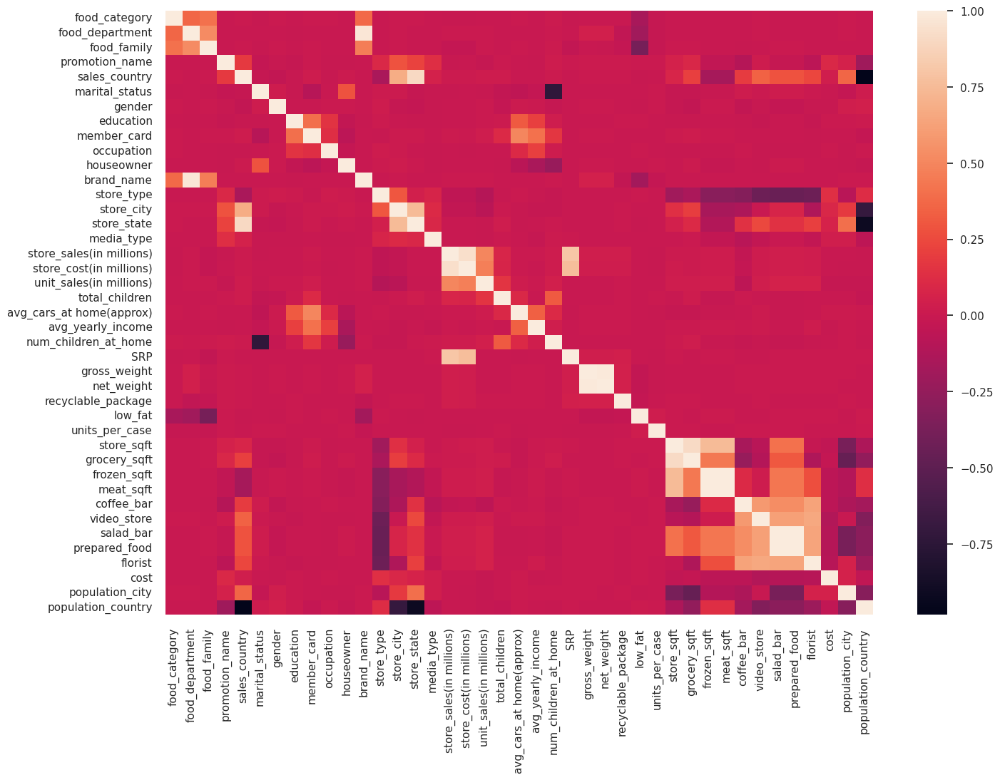

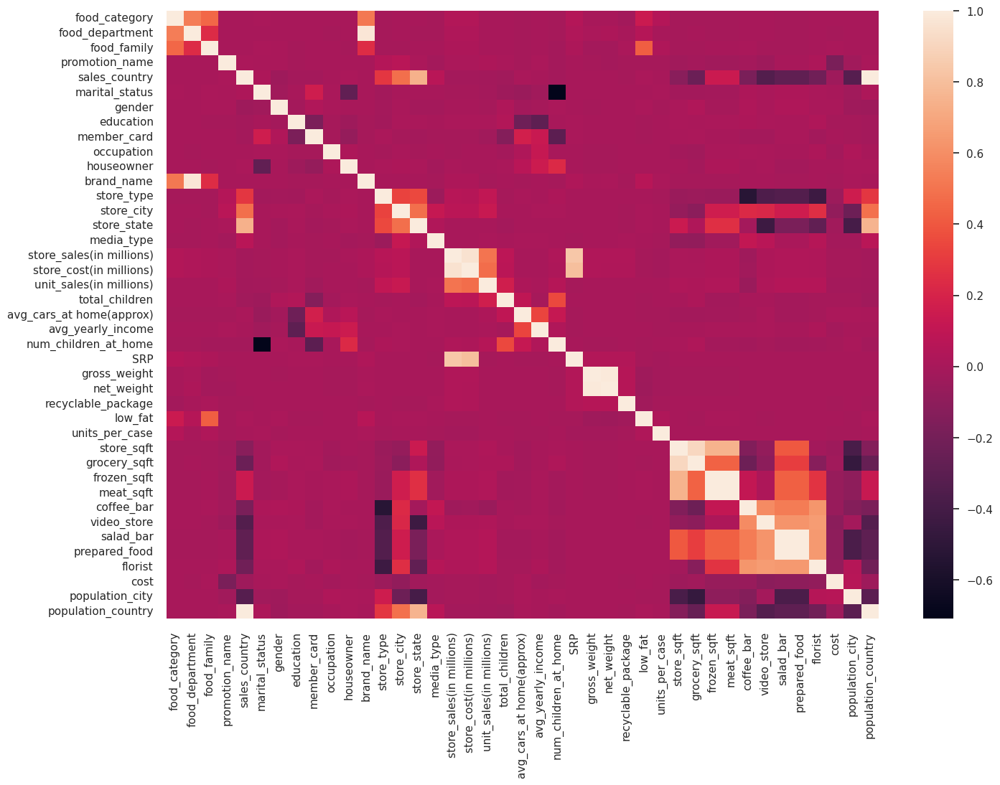

In [91]:
correl_chart(df_pred_labl_scaled)
print("------------------------------------------------------")
correl_chart(df_pred_freq_scaled)

In [92]:
correl_vars_feat(df_pred_labl_scaled)
print("------------------------------------------------------")
correl_vars_feat(df_pred_freq_scaled)

member_card    1.0
Name: member_card, dtype: float64

------------------------------------------------------


member_card    1.0
Name: member_card, dtype: float64

In [93]:
correl_list(df_pred_labl_scaled)
print("------------------------------------------------------")
correl_list(df_pred_freq_scaled)

member_card                 1.000000
avg_cars_at home(approx)    0.496933
avg_yearly_income           0.410927
education                   0.401094
num_children_at_home        0.169482
occupation                  0.128667
total_children              0.108770
unit_sales(in millions)     0.030166
grocery_sqft                0.021044
sales_country               0.019085
store_sqft                  0.015351
store_city                  0.012056
store_state                 0.010742
store_sales(in millions)    0.010166
store_cost(in millions)     0.006710
net_weight                  0.005741
food_family                 0.005236
gross_weight                0.005170
promotion_name              0.004854
meat_sqft                   0.004251
frozen_sqft                 0.004245
food_category               0.004005
recyclable_package          0.001048
low_fat                     0.000661
prepared_food              -0.000173
salad_bar                  -0.000173
food_department            -0.000894
b

In [94]:
print('------------prediction_labl_df_copy -> labl no scaled')
display(prediction_labl_df_copy.groupby('member_card').size())
print('\n------------df_prediction_labl_scaled -> labl scaled')
display(df_pred_labl_scaled.groupby('member_card').size())
print('\n------------prediction_freq_df_copy -> freq no scaled')
display(prediction_freq_df_copy.groupby('member_card').size())
print('\n------------df_prediction_freq_scaled -> freq scaled')
display(df_pred_freq_scaled.groupby('member_card').size())

------------prediction_labl_df_copy -> labl no scaled


member_card
0    13867
1     5198
2    33807
3     7556
dtype: int64


------------df_prediction_labl_scaled -> labl scaled


member_card
0.000000    13867
0.333333     5198
0.666667    33807
1.000000     7556
dtype: int64


------------prediction_freq_df_copy -> freq no scaled


member_card
5198      5198
7556      7556
13867    13867
33807    33807
dtype: int64


------------df_prediction_freq_scaled -> freq scaled


member_card
0.000000     5198
0.082422     7556
0.303017    13867
1.000000    33807
dtype: int64

In [95]:
display(df_labl_rand.groupby('member_card').size())
print('-------------------------------------------------------')
display(rand_pred_labl_scaled.groupby('member_card').size())
print('-------------------------------------------------------')
display(df_freq_rand.groupby('member_card').size())
print('-------------------------------------------------------')
display(rand_pred_freq_scaled.groupby('member_card').size())

member_card
0    13867
1     5198
2    33807
3     7556
dtype: int64

-------------------------------------------------------


member_card
0.000000    13867
0.333333     5198
0.666667    33807
1.000000     7556
dtype: int64

-------------------------------------------------------


member_card
5198      5198
7556      7556
13867    13867
33807    33807
dtype: int64

-------------------------------------------------------


member_card
0.000000     5198
0.082422     7556
0.303017    13867
1.000000    33807
dtype: int64

# Random Forest
- Regression
- Classification

In [96]:
# Regressor

In [97]:
def model_rfr(df_data):
    X = df_data.drop("member_card", axis=1) #Feature Matrix
    y = df_data["member_card"] #Target Variable

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.20,
                                                        random_state=7,
                                                        stratify=y)
    # train the model
    modell = RandomForestRegressor(random_state=7).fit(X_train, y_train)
    y_pred = modell.predict(X_train)
    mse = npy.sqrt(mean_squared_error(y_train, y_pred))
    print('MSE: ', mse)

    return modell, X

In [98]:
model_df_pred_labl_scaled, X_df_pred_labl_scaled = model_rfr(df_pred_labl_scaled)
model_df_pred_freq_scaled, X_df_pred_freq_scaled = model_rfr(df_pred_freq_scaled)
model_rand_pred_labl_scaled, X_rand_pred_labl_scaled = model_rfr(rand_pred_labl_scaled)
model_rand_pred_freq_scaled, X_rand_pred_freq_scaled = model_rfr(rand_pred_freq_scaled)

MSE:  0.026712726381097278
MSE:  0.050980932413449066
MSE:  0.028259394113713043
MSE:  0.053357247422294724


In [99]:
# Classification

In [100]:
df_pred_labl_scaled_copy = df_pred_labl_scaled.copy().astype('int64')
df_pred_freq_scaled_copy = df_pred_freq_scaled.copy().astype('int64')

rand_pred_labl_scaled_copy = rand_pred_labl_scaled.copy().astype('int64')
rand_pred_freq_scaled_copy = rand_pred_freq_scaled.copy().astype('int64')

In [101]:
display(df_pred_labl_scaled_copy.sample(2))
print('-------------------------------------------------------')
display(df_pred_freq_scaled_copy.sample(2))
print('-------------------------------------------------------')
display(rand_pred_labl_scaled_copy.sample(2))
print('-------------------------------------------------------')
display(rand_pred_freq_scaled_copy.sample(2))

,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
37755,0,0,0,0,0,0,1,0,0,0,...,0,0,1,1,1,1,1,0,0,1
43094,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,1,0,0,0,0


-------------------------------------------------------


,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country
27695,0,0,1,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
25226,0,1,1,0,1,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1


-------------------------------------------------------


,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country,Rand_Var_lb
40499,0,0,0,0,0,1,0,0,0,0,...,0,1,0,1,1,1,0,0,1,0
57443,0,0,0,0,0,1,1,0,0,0,...,0,1,1,1,1,1,0,0,0,0


-------------------------------------------------------


,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,...,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost,population_city,population_country,Rand_Var_fq
35829,0,0,1,0,1,1,1,0,0,1,...,0,1,1,1,1,1,0,0,1,0
35673,0,0,1,0,1,0,1,0,0,1,...,0,1,1,1,1,1,0,0,1,0


In [102]:
def model_clf(df_data):
    X = df_data.drop("member_card", axis=1) #Feature Matrix
    y = df_data["member_card"] #Target Variable

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.20,
                                                        random_state=7,
                                                        stratify=y)
    # train the model
    modell = RandomForestClassifier(n_estimators=100, random_state=7)
    modell.fit(X_train, y_train)
    y_pred = modell.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    print('Accuracy: ', acc)
    print('-------------------------------------------------------')
    print(classification_report(y_test, y_pred))

    return modell, X

In [103]:
model_df_pred_labl_scaled_copy, X_df_pred_labl_scaled_copy = model_clf(df_pred_labl_scaled_copy)
model_df_pred_freq_scaled_copy, X_df_pred_freq_scaled_copy = model_clf(df_pred_freq_scaled_copy)
model_rand_pred_labl_scaled_copy, X_rand_pred_labl_scaled_copy = model_clf(rand_pred_labl_scaled_copy)
model_rand_pred_freq_scaled_copy, X_rand_pred_freq_scaled_copy = model_clf(rand_pred_freq_scaled_copy)
model_df_labl_rand, X_df_labl_rand = model_clf(df_labl_rand)
model_df_freq_rand, X_df_freq_rand = model_clf(df_freq_rand)
model_prediction_labl_df_int, X_prediction_labl_df_int = model_clf(prediction_labl_df_int)
model_prediction_freq_df_int, X_prediction_freq_df_int = model_clf(prediction_freq_df_int)

Accuracy:  0.911467813999669
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.97      0.95     10575
           1       0.69      0.54      0.60      1511

    accuracy                           0.91     12086
   macro avg       0.81      0.75      0.78     12086
weighted avg       0.90      0.91      0.91     12086

Accuracy:  1.0
-------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     12086

    accuracy                           1.00     12086
   macro avg       1.00      1.00      1.00     12086
weighted avg       1.00      1.00      1.00     12086

Accuracy:  0.911798775442661
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.97      0.95     10575
           1       0.69      0.53      0.60      1

### Random Forest Feature Importances

In [104]:
# Feature importance plot
def plot_importance(model, features, num, save=False):
    feature_imp = pds.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    mpl.rcParams['font.family']='DejaVu Sans'
    mpl.figure(figsize=(9, 9))
    sbn.set(font_scale=1)
    sbn.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    mpl.title('Features')
    mpl.tight_layout()
    mpl.show()
    #if save:
        #mpl.savefig('importances.png')

In [105]:
# Feature importance Regressor

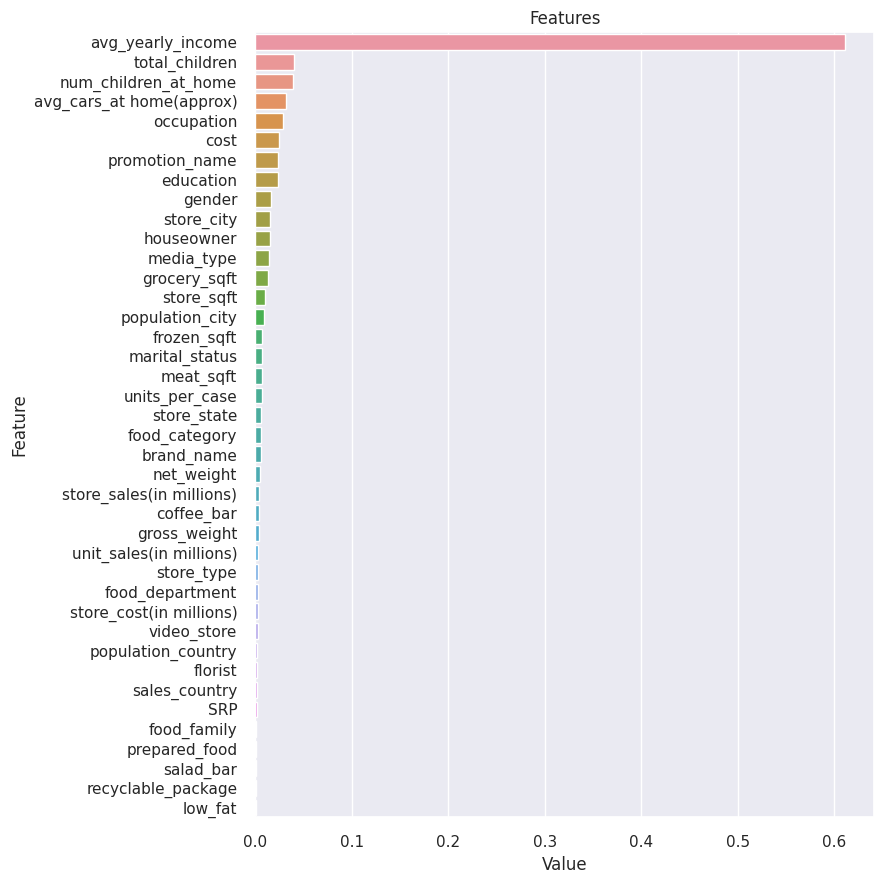

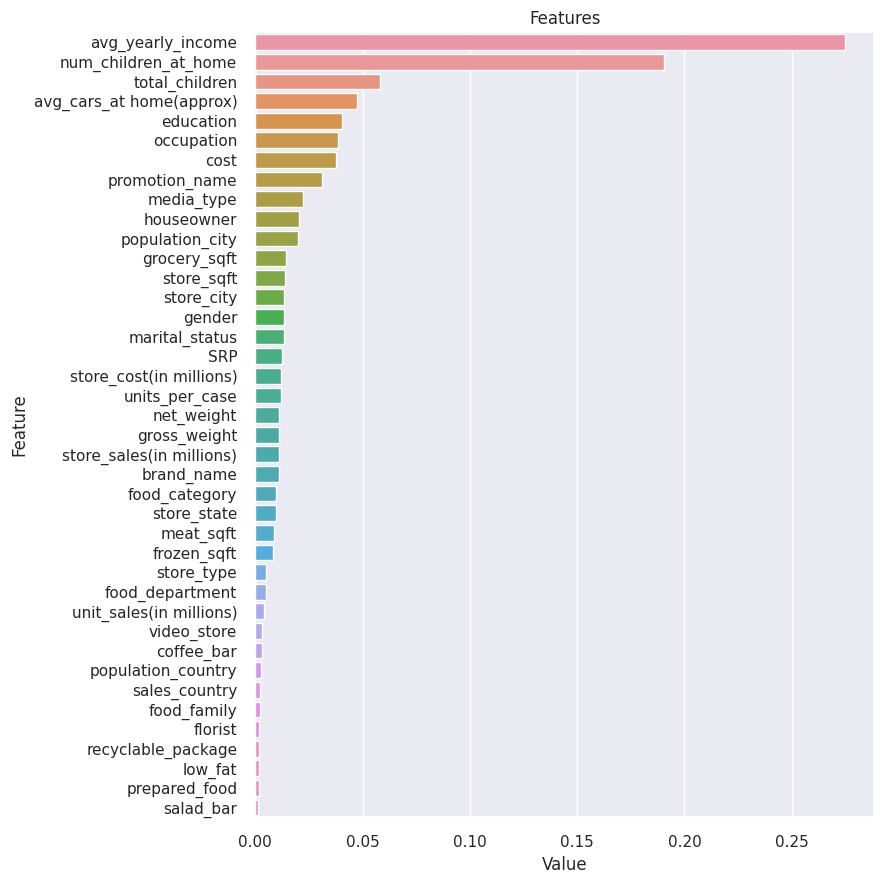

In [106]:
plot_importance(model_df_pred_labl_scaled,
                X_df_pred_labl_scaled,
                len(X_df_pred_labl_scaled))

plot_importance(model_df_pred_freq_scaled,
                X_df_pred_freq_scaled,
                len(X_df_pred_freq_scaled))

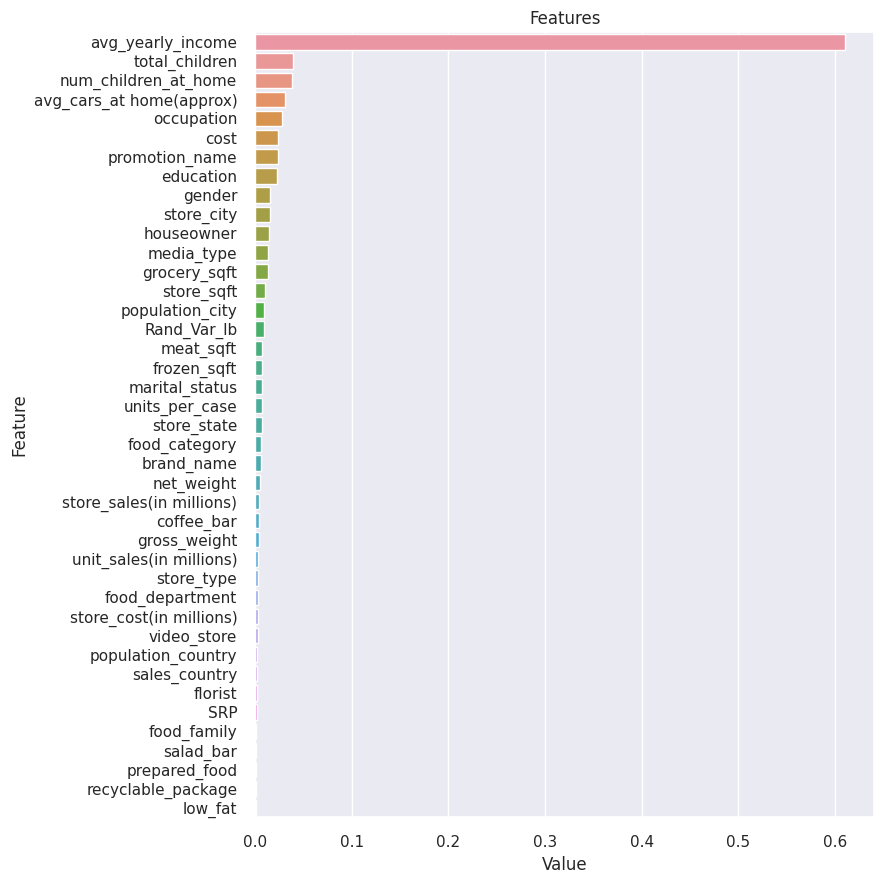

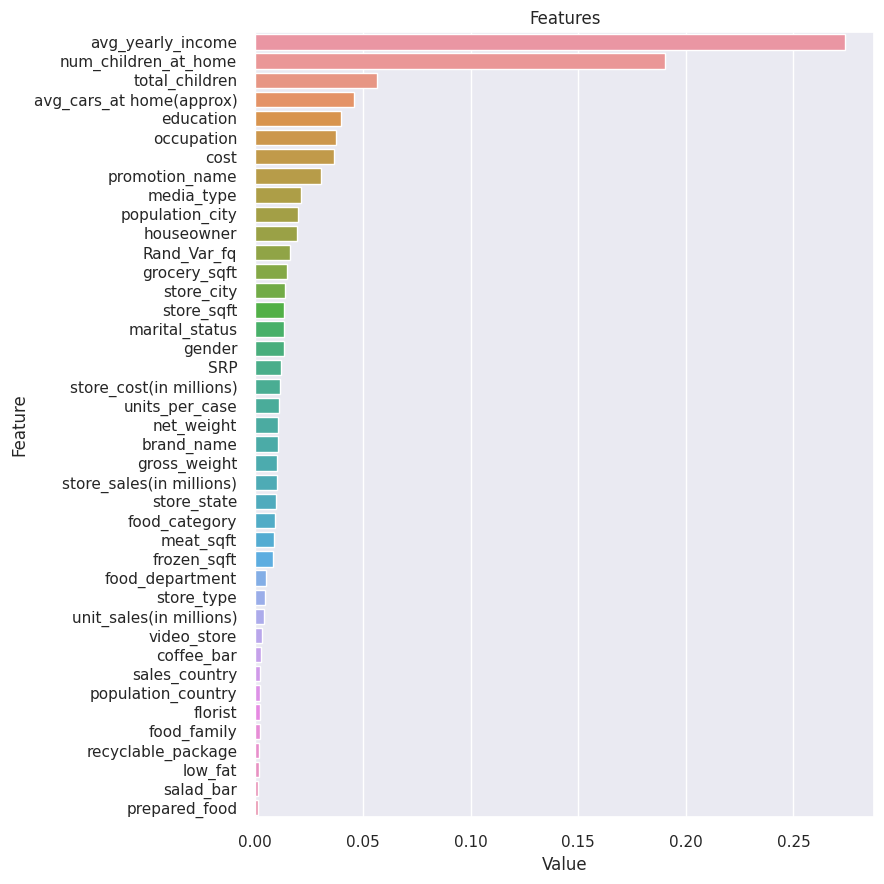

In [107]:
plot_importance(model_rand_pred_labl_scaled,
                X_rand_pred_labl_scaled,
                len(X_rand_pred_labl_scaled))

plot_importance(model_rand_pred_freq_scaled,
                X_rand_pred_freq_scaled,
                len(X_rand_pred_freq_scaled))

In [108]:
# Feature importance Clssifier

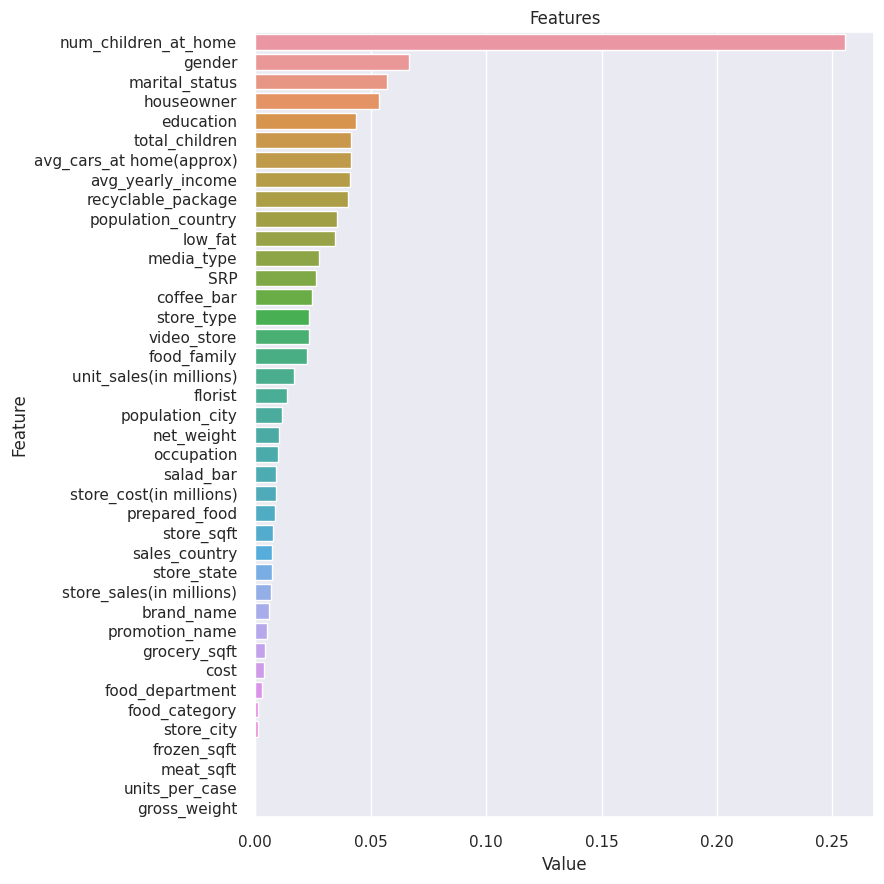

------------------------------------------------------


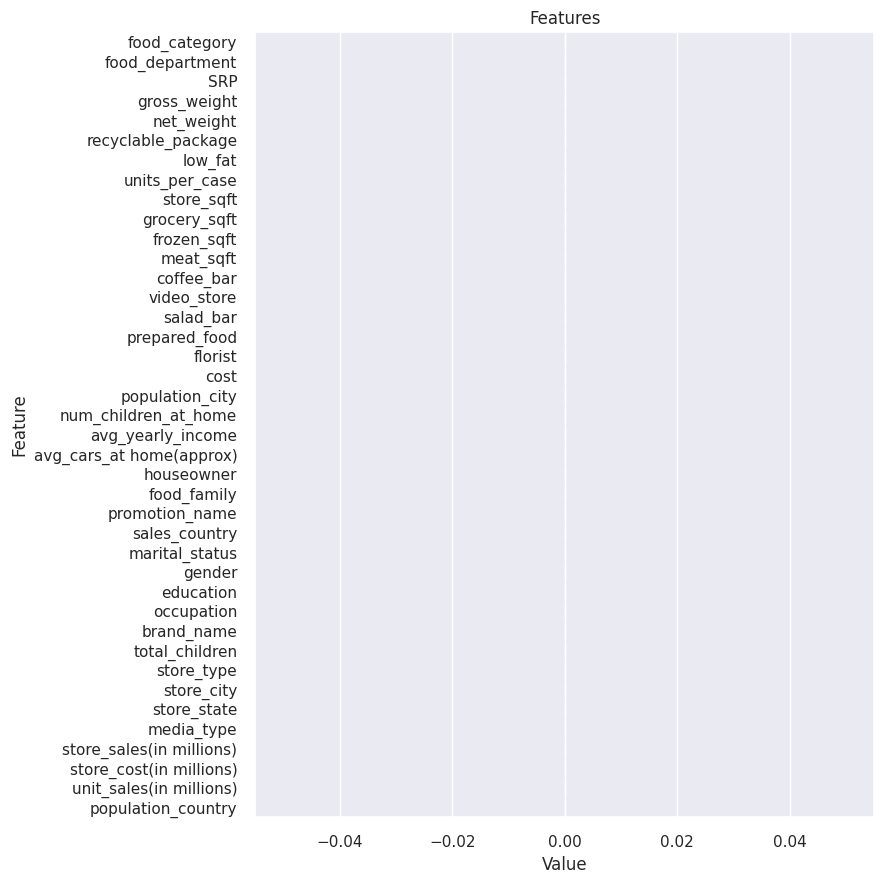

In [109]:
plot_importance(model_df_pred_labl_scaled_copy,
                X_df_pred_labl_scaled_copy,
                len(X_df_pred_labl_scaled_copy))
print("------------------------------------------------------")
plot_importance(model_df_pred_freq_scaled_copy,
                X_df_pred_freq_scaled_copy,
                len(X_df_pred_freq_scaled_copy))

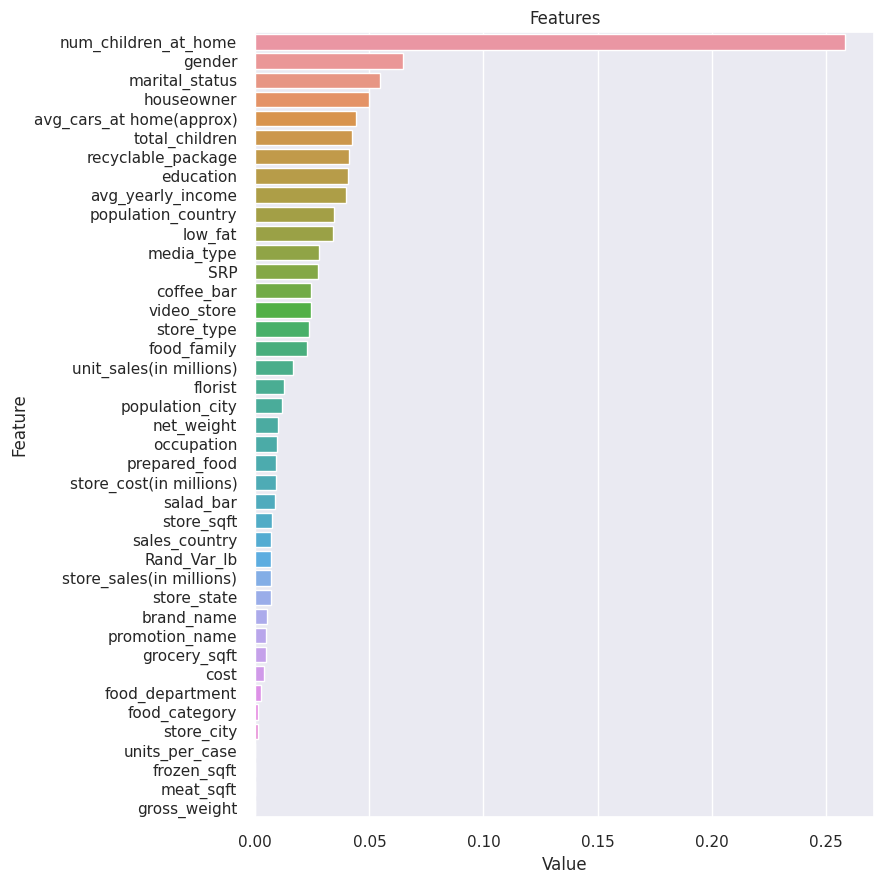

------------------------------------------------------


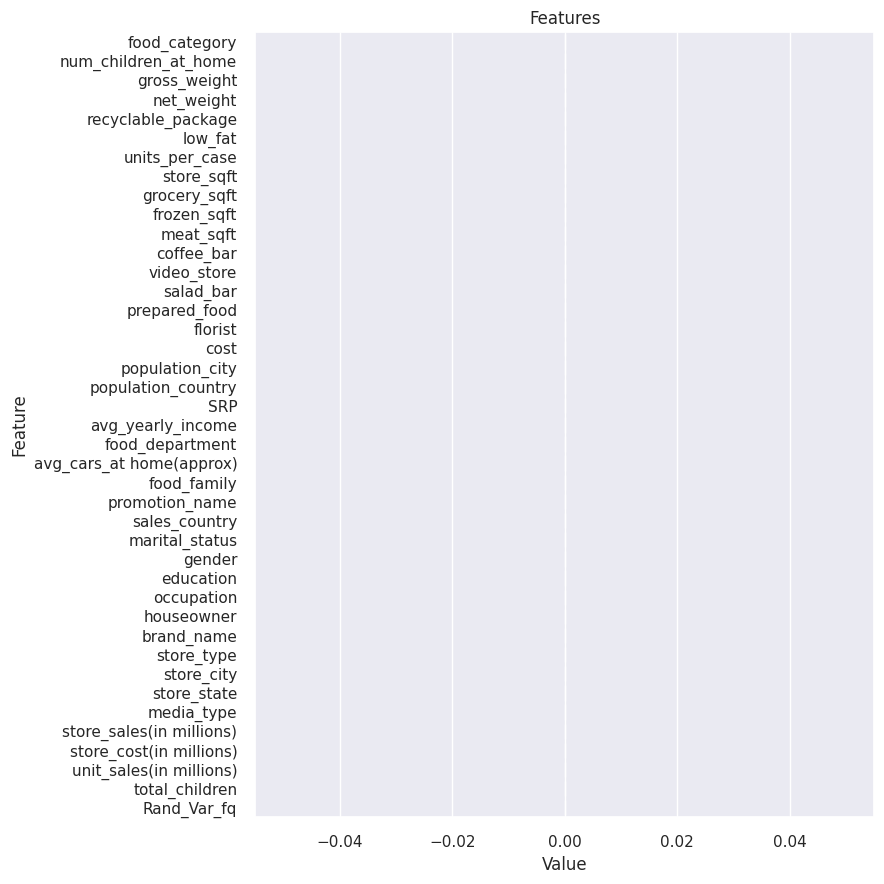

In [110]:
plot_importance(model_rand_pred_labl_scaled_copy,
                X_rand_pred_labl_scaled_copy,
                len(X_rand_pred_labl_scaled_copy))
print("------------------------------------------------------")
plot_importance(model_rand_pred_freq_scaled_copy,
                X_rand_pred_freq_scaled_copy,
                len(X_rand_pred_freq_scaled_copy))

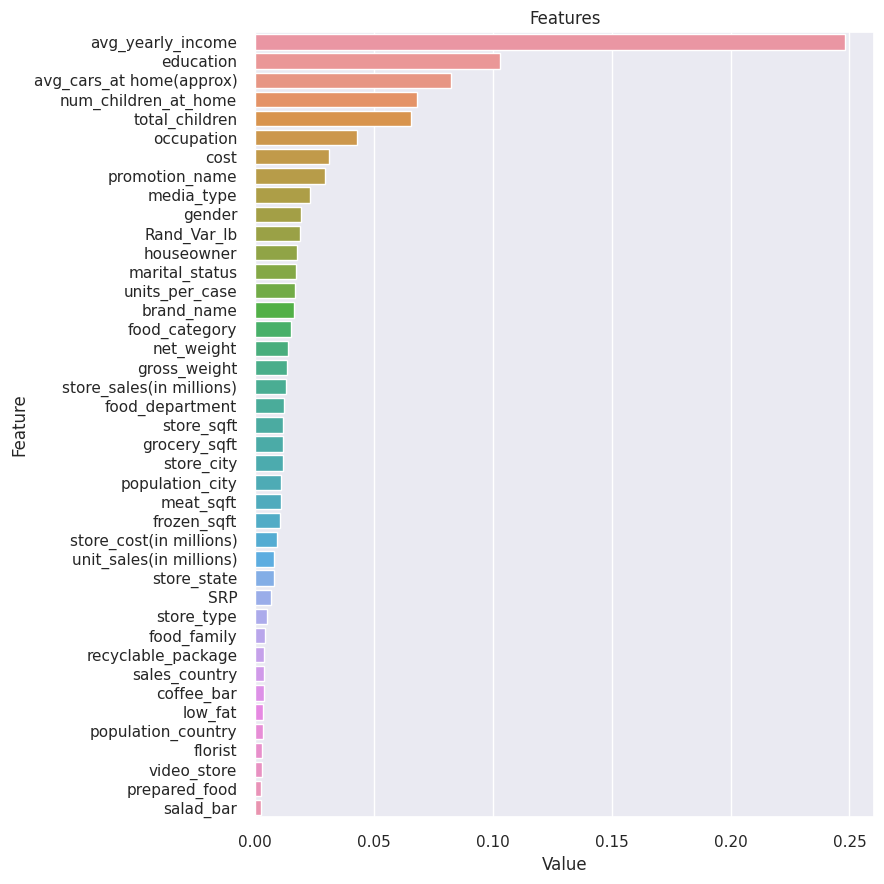

------------------------------------------------------


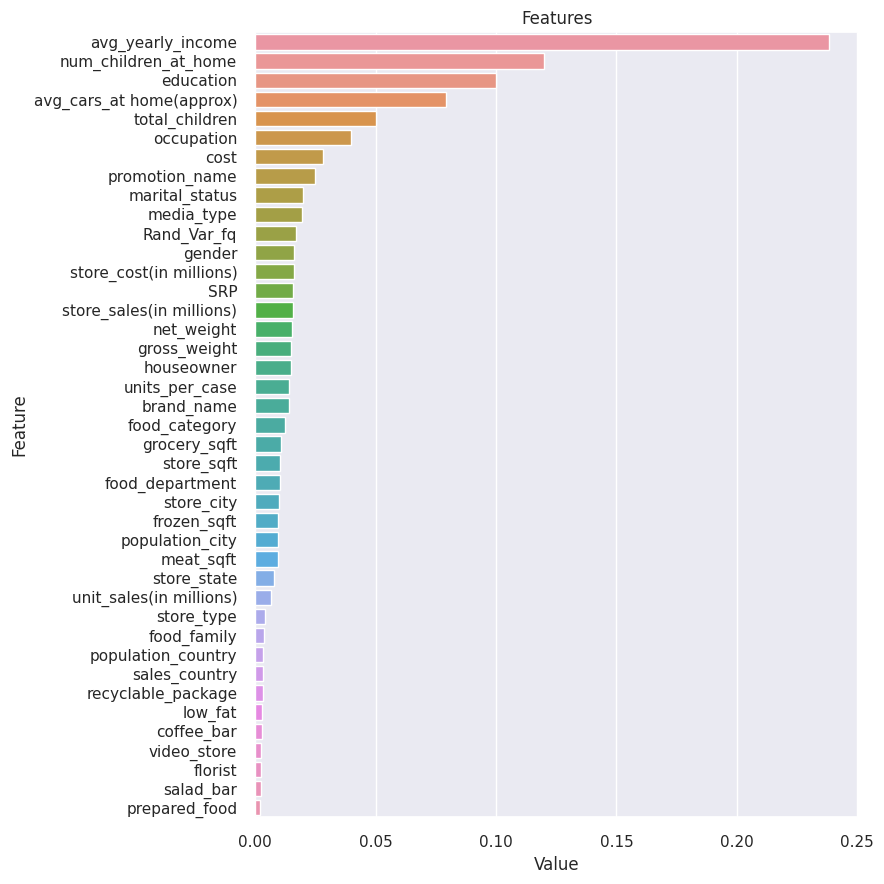

In [111]:
plot_importance(model_df_labl_rand,
                X_df_labl_rand,
                len(X_df_labl_rand))
print("------------------------------------------------------")
plot_importance(model_df_freq_rand,
                X_df_freq_rand,
                len(X_df_freq_rand))

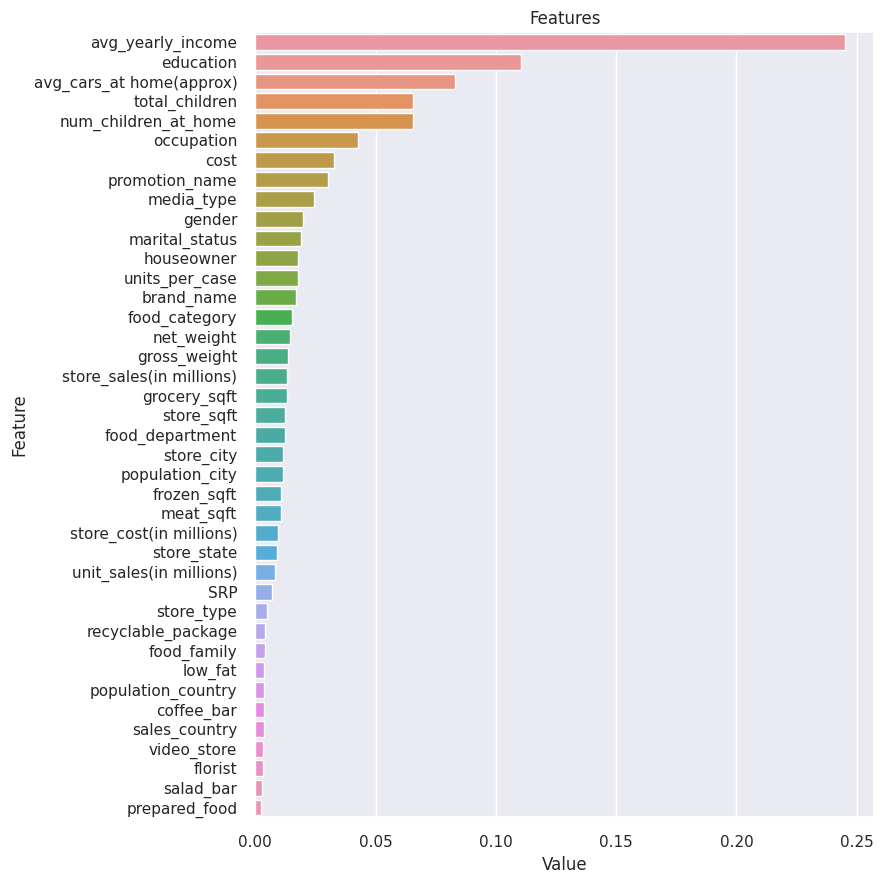

------------------------------------------------------


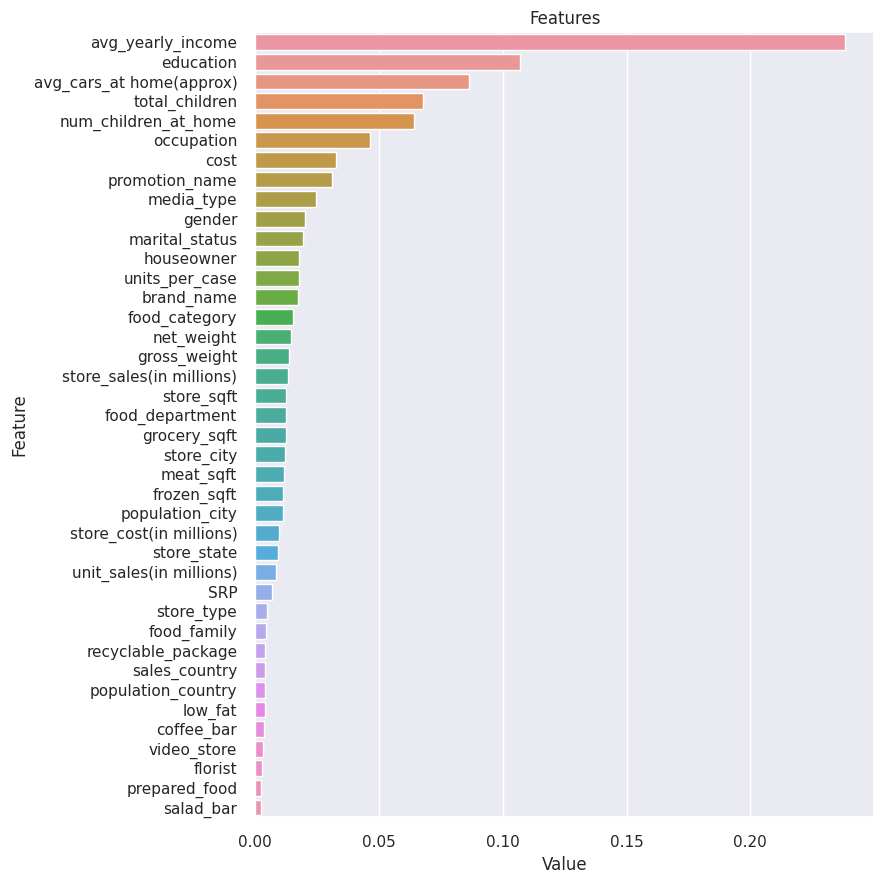

In [112]:
plot_importance(model_prediction_labl_df_int,
                X_prediction_labl_df_int,
                len(X_prediction_labl_df_int))
print("------------------------------------------------------")
plot_importance(model_prediction_freq_df_int,
                X_prediction_freq_df_int,
                len(X_prediction_freq_df_int))

In [113]:
list_list =[
    [rand_pred_labl_scaled, model_rand_pred_labl_scaled],
    [rand_pred_freq_scaled, model_rand_pred_freq_scaled],
    [df_pred_labl_scaled, model_df_pred_labl_scaled],
    [df_pred_freq_scaled, model_df_pred_freq_scaled],
    [df_pred_labl_scaled_copy, model_df_pred_labl_scaled_copy],
    [df_pred_freq_scaled_copy, model_df_pred_freq_scaled_copy],
    [rand_pred_labl_scaled_copy, model_rand_pred_labl_scaled_copy],
    [rand_pred_freq_scaled_copy, model_rand_pred_freq_scaled_copy],
    [df_labl_rand, model_df_labl_rand],
    [df_freq_rand, model_df_freq_rand],
    [prediction_labl_df_int, model_prediction_labl_df_int],
    [prediction_freq_df_int, model_prediction_freq_df_int]
]

def importance_list(list_l):

    list_feat = []

    for l in list_l:
        df_data_mc = l[0].drop('member_card', axis = 1)
        feat_list = df_data_mc.columns.to_list()
        feat_importances = l[1].feature_importances_

        sorted_features = sorted(zip(feat_list, feat_importances), key=lambda x: x[1], reverse=True)

        for feat in sorted_features[:15]:
            list_feat.append(feat)

    return list_feat

In [114]:
top_features_list = importance_list(list_list)
top_features_list_complete = [f[0] for f in top_features_list]
top_features_list_complete

['avg_yearly_income',
 'total_children',
 'num_children_at_home',
 'avg_cars_at home(approx)',
 'occupation',
 'cost',
 'promotion_name',
 'education',
 'gender',
 'store_city',
 'houseowner',
 'media_type',
 'grocery_sqft',
 'store_sqft',
 'population_city',
 'avg_yearly_income',
 'num_children_at_home',
 'total_children',
 'avg_cars_at home(approx)',
 'education',
 'occupation',
 'cost',
 'promotion_name',
 'media_type',
 'population_city',
 'houseowner',
 'Rand_Var_fq',
 'grocery_sqft',
 'store_city',
 'store_sqft',
 'avg_yearly_income',
 'total_children',
 'num_children_at_home',
 'avg_cars_at home(approx)',
 'occupation',
 'cost',
 'promotion_name',
 'education',
 'gender',
 'store_city',
 'houseowner',
 'media_type',
 'grocery_sqft',
 'store_sqft',
 'population_city',
 'avg_yearly_income',
 'num_children_at_home',
 'total_children',
 'avg_cars_at home(approx)',
 'education',
 'occupation',
 'cost',
 'promotion_name',
 'media_type',
 'houseowner',
 'population_city',
 'grocery_sqf

In [115]:
feat_counts = Counter(top_features_list_complete)
print(feat_counts)

Counter({'education': 12, 'media_type': 12, 'gender': 11, 'houseowner': 11, 'avg_yearly_income': 10, 'total_children': 10, 'num_children_at_home': 10, 'avg_cars_at home(approx)': 10, 'occupation': 10, 'promotion_name': 10, 'cost': 8, 'marital_status': 8, 'store_city': 6, 'brand_name': 5, 'grocery_sqft': 4, 'store_sqft': 4, 'population_city': 4, 'food_category': 4, 'SRP': 3, 'store_type': 3, 'units_per_case': 3, 'Rand_Var_fq': 2, 'recyclable_package': 2, 'population_country': 2, 'low_fat': 2, 'coffee_bar': 2, 'food_department': 2, 'food_family': 2, 'sales_country': 2, 'store_state': 2, 'video_store': 1, 'Rand_Var_lb': 1, 'store_cost(in millions)': 1, 'store_sales(in millions)': 1})


In [116]:
feat_sorted_by_values = sorted(feat_counts.items(), key=lambda x: x[1], reverse=True)
for ft in feat_sorted_by_values:
    print(ft)

('education', 12)
('media_type', 12)
('gender', 11)
('houseowner', 11)
('avg_yearly_income', 10)
('total_children', 10)
('num_children_at_home', 10)
('avg_cars_at home(approx)', 10)
('occupation', 10)
('promotion_name', 10)
('cost', 8)
('marital_status', 8)
('store_city', 6)
('brand_name', 5)
('grocery_sqft', 4)
('store_sqft', 4)
('population_city', 4)
('food_category', 4)
('SRP', 3)
('store_type', 3)
('units_per_case', 3)
('Rand_Var_fq', 2)
('recyclable_package', 2)
('population_country', 2)
('low_fat', 2)
('coffee_bar', 2)
('food_department', 2)
('food_family', 2)
('sales_country', 2)
('store_state', 2)
('video_store', 1)
('Rand_Var_lb', 1)
('store_cost(in millions)', 1)
('store_sales(in millions)', 1)


In [117]:
def_feature_list = [f[0] for f in feat_sorted_by_values if f[1] >= 10]
def_feature_list.append('member_card')
def_feature_list

['education',
 'media_type',
 'gender',
 'houseowner',
 'avg_yearly_income',
 'total_children',
 'num_children_at_home',
 'avg_cars_at home(approx)',
 'occupation',
 'promotion_name',
 'member_card']

In [118]:
def_feature_list_02 = ['member_card',
                       'occupation',
                       'education',
                       'gender',
                       'avg_yearly_income',
                       'total_children']

# Dataframe Feature Selected

In [119]:
'''nd_labl_df1 = prediction_freq_df_copy.filter(items=def_feature_list_02)
data_labl_arr1, data_labl_df1 = scaling_m_dfs(nd_labl_df1)

def k_val_test(data_arr):
    scrs= []

    for c in range(2, 8):
        scr={}
        kms = KMeans(n_clusters=c, n_init=10, max_iter= 300)
        pred = kms.fit_predict(data_arr)
        labels = kms.labels_
        scr['Cluster'] = c
        scr['Silhouette'] = silhouette_score(data_arr, labels, metric='euclidean')
        scrs.append(scr)

    val_table = pds.DataFrame(scrs)
    display(val_table)

    return val_table

validation_table_labl1 = k_val_test(data_labl_arr1)'''

"nd_labl_df1 = prediction_freq_df_copy.filter(items=def_feature_list_02)\ndata_labl_arr1, data_labl_df1 = scaling_m_dfs(nd_labl_df1)\n\ndef k_val_test(data_arr):\n    scrs= []\n\n    for c in range(2, 8):\n        scr={}\n        kms = KMeans(n_clusters=c, n_init=10, max_iter= 300)\n        pred = kms.fit_predict(data_arr)\n        labels = kms.labels_\n        scr['Cluster'] = c\n        scr['Silhouette'] = silhouette_score(data_arr, labels, metric='euclidean')\n        scrs.append(scr)\n\n    val_table = pds.DataFrame(scrs)\n    display(val_table)\n\n    return val_table\n\nvalidation_table_labl1 = k_val_test(data_labl_arr1)"

In [120]:
nd_labl_df = prediction_labl_df_copy.filter(items=def_feature_list_02)
nd_freq_df = prediction_freq_df_copy.filter(items=def_feature_list_02)

data_labl_arr, data_labl_df = scaling_m_dfs(nd_labl_df)
data_freq_arr, data_freq_df = scaling_m_dfs(nd_freq_df)

,member_card,occupation,education,gender,avg_yearly_income,total_children
24106,0.666667,0.5,0.5,1.0,0.166667,0.6
27233,0.666667,0.0,0.5,1.0,0.166667,0.2


------------------------------------------------------


array([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.2       ],
       [0.33333333, 0.25      , 0.25      , 1.        , 0.33333333,
        0.        ],
       [0.        , 0.5       , 0.        , 0.        , 0.        ,
        0.8       ],
       ...,
       [0.66666667, 0.5       , 0.5       , 1.        , 0.16666667,
        0.2       ],
       [0.66666667, 0.25      , 0.25      , 1.        , 0.5       ,
        0.4       ],
       [0.66666667, 0.5       , 0.        , 0.        , 0.        ,
        0.6       ]])

,member_card,occupation,education,gender,avg_yearly_income,total_children
20655,0.303017,0.703648,0.934209,0.0,0.333333,0.4
20269,0.082422,0.600000,0.934209,0.0,0.166667,1.0


------------------------------------------------------


array([[0.30301653, 0.7036477 , 1.        , 1.        , 0.        ,
        0.2       ],
       [0.        , 1.        , 0.6       , 0.        , 0.33333333,
        0.        ],
       [0.30301653, 0.6       , 1.        , 1.        , 0.        ,
        0.8       ],
       ...,
       [1.        , 0.6       , 0.93420933, 0.        , 0.16666667,
        0.2       ],
       [1.        , 1.        , 0.6       , 0.        , 0.5       ,
        0.4       ],
       [1.        , 0.6       , 1.        , 1.        , 0.        ,
        0.6       ]])

In [121]:
display(data_labl_df.sample(6))
print("------------------------------------------------------")
display(data_labl_arr)
print("------------------------------------------------------")

display(data_freq_df.sample(6))
print("------------------------------------------------------")
display(data_freq_arr)

,member_card,occupation,education,gender,avg_yearly_income,total_children
42664,0.000000,0.50,0.00,1.0,0.000000,0.4
55036,0.666667,1.00,1.00,0.0,0.333333,0.6
10050,0.666667,0.25,0.50,0.0,0.500000,0.6
19714,0.333333,0.75,1.00,0.0,0.500000,0.0
18339,0.666667,0.75,0.25,0.0,0.666667,0.6
6515,0.666667,0.50,0.50,0.0,0.166667,0.6


------------------------------------------------------


array([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.2       ],
       [0.33333333, 0.25      , 0.25      , 1.        , 0.33333333,
        0.        ],
       [0.        , 0.5       , 0.        , 0.        , 0.        ,
        0.8       ],
       ...,
       [0.66666667, 0.5       , 0.5       , 1.        , 0.16666667,
        0.2       ],
       [0.66666667, 0.25      , 0.25      , 1.        , 0.5       ,
        0.4       ],
       [0.66666667, 0.5       , 0.        , 0.        , 0.        ,
        0.6       ]])

------------------------------------------------------


,member_card,occupation,education,gender,avg_yearly_income,total_children
5506,0.303017,0.703648,1.000000,0.0,0.000000,0.0
35356,0.303017,0.160083,0.934209,0.0,0.666667,0.6
25109,1.000000,1.000000,0.600000,0.0,0.500000,0.2
59346,1.000000,1.000000,0.600000,1.0,0.333333,0.0
24060,0.303017,1.000000,1.000000,0.0,0.833333,1.0
19331,1.000000,0.600000,1.000000,1.0,0.000000,0.6


------------------------------------------------------


array([[0.30301653, 0.7036477 , 1.        , 1.        , 0.        ,
        0.2       ],
       [0.        , 1.        , 0.6       , 0.        , 0.33333333,
        0.        ],
       [0.30301653, 0.6       , 1.        , 1.        , 0.        ,
        0.8       ],
       ...,
       [1.        , 0.6       , 0.93420933, 0.        , 0.16666667,
        0.2       ],
       [1.        , 1.        , 0.6       , 0.        , 0.5       ,
        0.4       ],
       [1.        , 0.6       , 1.        , 1.        , 0.        ,
        0.6       ]])

# Algorithms

### k-means

#### Validation

In [122]:
def kmeans_val_metrics(data_arr):
    scrs= []

    for c in range(3,11):
        scr={}
        kms = KMeans(n_clusters=c, n_init=10, max_iter= 300)
        pred = kms.fit_predict(data_arr)
        labels = kms.labels_
        scr['Cluster'] = c
        scr['Silhouette'] = silhouette_score(data_arr, labels, metric='euclidean')
        scr['Davies_Bouldin'] = davies_bouldin_score(data_arr, labels)
        scr['Calinski_Harabasz'] = calinski_harabasz_score(data_arr, labels)
        scrs.append(scr)

    val_table = pds.DataFrame(scrs)
    display(val_table)

    return val_table

In [123]:
validation_table_labl = kmeans_val_metrics(data_labl_arr)
validation_table_freq = kmeans_val_metrics(data_freq_arr)

,Cluster,Silhouette,Davies_Bouldin,Calinski_Harabasz
0,3,0.330545,1.217421,26157.340379
1,4,0.315578,1.152721,24078.415208
2,5,0.280301,1.430993,21145.453024
3,6,0.251442,1.703777,19305.742330
4,7,0.256853,1.528478,18526.287631
5,8,0.250926,1.497212,17240.738574
6,9,0.263878,1.372678,17022.945579
7,10,0.259685,1.320725,16467.559488


,Cluster,Silhouette,Davies_Bouldin,Calinski_Harabasz
0,3,0.298101,1.287856,22615.730771
1,4,0.343501,1.325080,23537.062216
2,5,0.346663,1.309833,20861.322772
3,6,0.344436,1.351738,19268.600249
4,7,0.352110,1.272361,17901.474432
5,8,0.348845,1.266903,17591.692291
6,9,0.327601,1.257201,17018.100674
7,10,0.352913,1.252930,16912.125566


In [124]:
'''
def eval_query(val_tab, slhtt_val, davbl_val):
    filtered_vals = val_tab.query('Silhouette > @slhtt_val and Davies_Bouldin < @davbl_val').nlargest(1, 'Calinski_Harabasz')
    filtered_vals
    if len(filtered_vals) != 0:
      filtered_vals
    else:
      print("no values matched!")
'''
def eval_query(val_tab, s_val, d_val):
  c_val = val_tab.query('Silhouette <= {} and Davies_Bouldin >= {}'.format(s_val, d_val)).nlargest(1, 'Calinski_Harabasz')
  print(c_val['Cluster'].values) if len(c_val) !=0 else print("no.....values.....")
  c_vval = c_val['Cluster'].values
  return c_vval

In [125]:
s = validation_table_freq.nlargest(1, 'Silhouette')['Silhouette'].values
d = validation_table_freq.nsmallest(1, 'Davies_Bouldin')['Davies_Bouldin'].values
c = validation_table_freq.nlargest(1, 'Calinski_Harabasz')['Calinski_Harabasz'].values

cval = eval_query(validation_table_freq, s, d)

[4]


#### Find K

In [126]:
# Find K
def kmeans_k(df_data, arr_data):

    km = KMeans()
    ssd = []
    K = range(1, 26)

    for k in K:
        #km = KMeans(n_clusters=k, random_state = 111).fit(df_data)
        km = KMeans(n_clusters=k).fit(df_data)
        ssd.append(km.inertia_)

    ssd

    mpl.rcParams['font.family']='DejaVu Sans'
    mpl.plot(K, ssd, "bx-")
    mpl.xlabel("Distance Residual Sums for K Values (WCSS)")
    mpl.title("Elbow Method for Optimum Number of Clusters")
    mpl.show()

    print("------------------------------------------------------")

    km = KMeans()
    viz = KElbowVisualizer(km, k=(2, 21))
    viz.fit(arr_data)
    k_val = viz.elbow_value_
    viz.show()

    print("------------------------------------------------------")
    print(k_val)

    return k_val

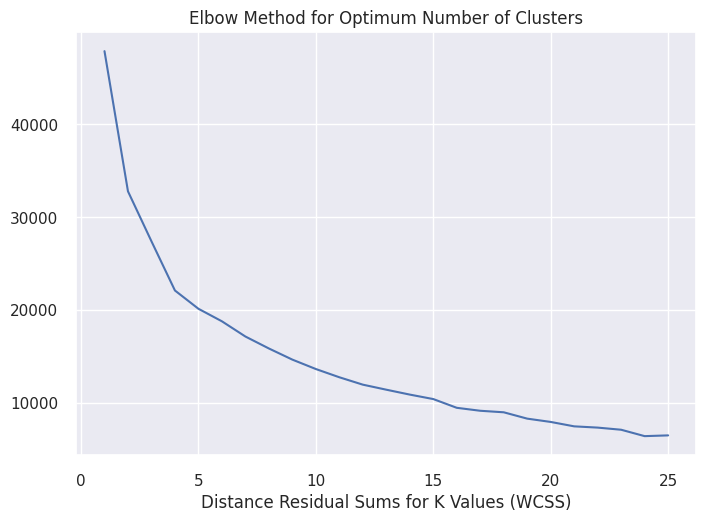

------------------------------------------------------


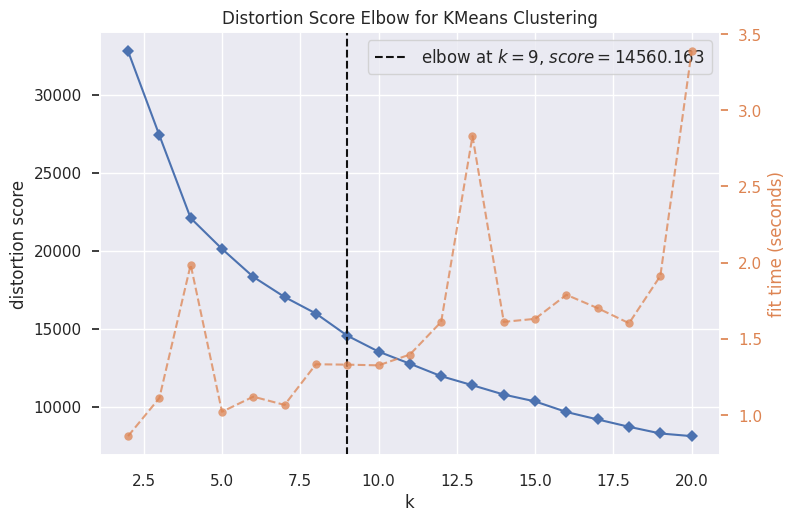

------------------------------------------------------
9


In [127]:
kval = kmeans_k(data_freq_df, data_freq_arr)

In [128]:
# Def k - Freq...
num_k = int((cval + kval ) / 2)
num_k

6

In [129]:
# random dataset
random_data = npy.random.rand(60428, 6)
validation_table_rand = kmeans_val_metrics(random_data)

,Cluster,Silhouette,Davies_Bouldin,Calinski_Harabasz
0,3,0.111307,2.256370,7654.831757
1,4,0.116169,2.146623,7202.220475
2,5,0.115216,1.922160,6731.107361
3,6,0.119583,1.756684,6462.964160
4,7,0.122802,1.651622,6257.034837
5,8,0.121858,1.667528,5971.412079
6,9,0.124749,1.622056,5784.365814
7,10,0.128648,1.548961,5680.122567


In [130]:
# Cluster stability
def kmeans_val_metrics_set(data_arr, kc):

  set_1,set_2,set_3,set_4,set_5 = npy.array_split(data_arr, 5)
  sets = [set_1,set_2,set_3,set_4,set_5]

  scores= []
  n=1
  for st in sets:
    score={}
    kmeans = KMeans(n_clusters= kc, n_init=10, max_iter= 300)
    y_pred = kmeans.fit_predict(st)
    labels = kmeans.labels_
    score['Set'] = f'set{n}'
    n += 1
    score['Silhouette'] = silhouette_score(st, labels, metric='euclidean')
    score['Davies-Bouldin'] = davies_bouldin_score(st, labels)
    score['Calinski-Harabasz'] = calinski_harabasz_score(st, labels)
    scores.append(score)

  raw_data = pds.DataFrame(scores)
  display(raw_data)
  return raw_data

In [131]:
validation_table_sets = kmeans_val_metrics_set(data_freq_arr, num_k)

,Set,Silhouette,Davies-Bouldin,Calinski-Harabasz
0,set1,0.328219,1.391621,3812.605048
1,set2,0.345205,1.346915,3870.336784
2,set3,0.344414,1.344409,3864.693502
3,set4,0.330011,1.366572,3816.257026
4,set5,0.352825,1.308113,3873.656068


#### Clusters

In [132]:
# Find Clusters
def kameans_cltrs(k, df_data):

    km = KMeans(n_clusters=k)
    km.fit(df_data)

    lbls = km.predict(df_data)
    # preds = km.fit_predict(df_data)

    cltrs = km.labels_
    cntrds = km.cluster_centers_

    #score_slht = silhouette_score(df_data, lbls) # metric='euclidean'
    #score_dvBld = davies_bouldin_score(df_data, lbls)
    #score_calHabz = calinski_harabasz_score(df_data, lbls)

    score_slht = silhouette_score(df_data, cltrs)
    score_dvBld = davies_bouldin_score(df_data, cltrs)
    score_calHabz = calinski_harabasz_score(df_data, cltrs)

    slht = "Silhouette score is {})".format(score_slht)
    dvBld = "Davies Bouldin score is {})".format(score_dvBld)
    calHabz = "Calinski Harabasz score is {})".format(score_calHabz)

    # Visualizing the silhouette plot
    # kmeans = KMeans(n_clusters=8)
    # sam_pred = ks.predict(labl_arr_s)

    silh_visualizer = SilhouetteVisualizer(km)
    silh_visualizer.fit(df_data)
    silh_visualizer.show()

    #df_data["cluster_no"] = cltrs

    print("------------------------------------------------------")
    display(df_data.sample(4))
    print(" ")
    print("For n_clusters = {}:".format(k))
    print("....................\n")
    display(slht)
    print("------------------------------------------------------")
    display(dvBld)
    print("------------------------------------------------------")
    display(calHabz)

    return cltrs, cntrds, lbls

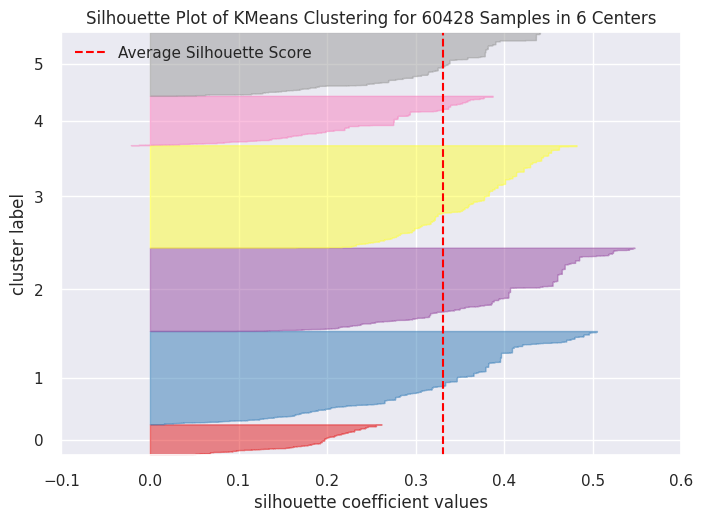

------------------------------------------------------


,member_card,occupation,education,gender,avg_yearly_income,total_children
35643,0.000000,0.160083,0.934209,1.0,0.500000,0.4
46756,0.082422,1.000000,0.000000,1.0,0.333333,0.6
2299,1.000000,1.000000,0.600000,0.0,0.333333,0.4
42773,0.082422,0.160083,0.934209,1.0,1.000000,1.0


 
For n_clusters = 6:
....................



'Silhouette score is 0.3303338991750578)'

------------------------------------------------------


'Davies Bouldin score is 1.373835220591027)'

------------------------------------------------------


'Calinski Harabasz score is 19090.087674832102)'

In [133]:
cltrs_freq, cntrds_freq, labels_freq = kameans_cltrs(num_k, data_freq_df)

In [134]:
'''print(cltrs_freq, "\n")
print(cntrds_freq, "\n")
display(data_freq_df.sample(2))'''

'print(cltrs_freq, "\n")\nprint(cntrds_freq, "\n")\ndisplay(data_freq_df.sample(2))'

In [135]:
def print_cltrs_info(df_data, cltrs, lbls):
  # tag the dataframe
  df_data['cluster_no'] = cltrs + 1
  df_data['label'] = lbls + 1

  display(df_data.groupby("cluster_no").agg({"cluster_no": "count"}))
  print("------------------------------------------------------")
  display(df_data.groupby("cluster_no").agg(npy.mean))

In [136]:
print_cltrs_info(data_freq_df, cltrs_freq, labels_freq)

,cluster_no
cluster_no,
1,4422
2,13322
3,11896
4,14624
5,7048
6,9116


------------------------------------------------------


,member_card,occupation,education,gender,avg_yearly_income,total_children,label
cluster_no,,,,,,,
1,0.736349,0.648434,0.000000,1.0,0.440412,0.488241,1.0
2,0.177279,0.673960,0.831898,0.0,0.232473,0.531467,2.0
3,0.197154,0.686992,0.911844,1.0,0.214442,0.559331,3.0
4,1.000000,0.697713,0.805947,1.0,0.357973,0.487910,4.0
5,0.983048,0.961265,0.488886,0.0,0.534620,0.448326,5.0
6,1.000000,0.477962,0.800805,0.0,0.273969,0.486551,6.0


In [137]:
print(cltrs_freq, "\n")
print(cntrds_freq, "\n")
display(data_freq_df.sample(2))

[2 1 2 ... 5 4 3] 

[[ 7.36348532e-01  6.48433525e-01 -2.79776202e-14  1.00000000e+00
   4.40411578e-01  4.88240615e-01]
 [ 1.77278592e-01  6.73960478e-01  8.31898083e-01  9.05941988e-14
   2.32472602e-01  5.31466747e-01]
 [ 1.97154009e-01  6.86991919e-01  9.11844260e-01  1.00000000e+00
   2.14441829e-01  5.59330868e-01]
 [ 1.00000000e+00  6.97712788e-01  8.05947359e-01  1.00000000e+00
   3.57973195e-01  4.87910284e-01]
 [ 9.83048424e-01  9.61265291e-01  4.88886242e-01 -1.11022302e-16
   5.34619750e-01  4.48325766e-01]
 [ 1.00000000e+00  4.77961525e-01  8.00804751e-01  2.77555756e-14
   2.73968846e-01  4.86551119e-01]] 



,member_card,occupation,education,gender,avg_yearly_income,total_children,cluster_no,label
22069,1.0,0.703648,0.934209,1.0,0.166667,0.6,4,4
30170,1.0,0.703648,0.934209,0.0,0.166667,0.2,6,6


In [138]:
data_freq_df_bk = data_freq_df.drop(['cluster_no', 'label'], axis=1)

In [139]:
data_freq_df_bk.sample(2)

,member_card,occupation,education,gender,avg_yearly_income,total_children
57816,0.303017,0.600000,1.0,0.0,0.000000,0.6
35421,1.000000,0.160083,0.6,0.0,0.333333,0.6


In [140]:
# selected_elements = random.sample(arr, 4)
# selected_elements = arr[:4] first elements
# selected_elements = arr[-4:] last elements

def qty_by_color(list_f, labels, df_data, kc):

    colors = ['red','green','blue', 'pink', 'purple', 'yellow', 'orange', 'cyan', 'magenta', 'olive']

    copy_labl = pds.DataFrame()

    for n in list_f:
        copy_labl['label'] = labels + 1
        copy_labl[n]=df_data[n].values

    qty_by_group = pds.DataFrame()
    qty_by_group['Qty']=copy_labl.groupby('label').size()
    qty_by_group['Color']= colors[:kc]

    display(copy_labl.sample(4))
    print("------------------------------------------------------")
    display(qty_by_group)

In [141]:
qty_by_color(def_feature_list_02, labels_freq, data_freq_df, num_k)

,label,member_card,occupation,education,gender,avg_yearly_income,total_children
4640,3,0.082422,1.000000,0.600000,1.0,0.333333,0.8
26415,3,0.303017,0.600000,1.000000,1.0,0.000000,0.8
60124,6,1.000000,0.160083,1.000000,0.0,0.666667,0.4
50249,3,0.303017,0.703648,0.934209,1.0,0.000000,0.4


------------------------------------------------------


,Qty,Color
label,,
1,4422,red
2,13322,green
3,11896,blue
4,14624,pink
5,7048,purple
6,9116,yellow


In [142]:
# Plot the histogram of various clusters
def plot_cltrs_hist(df_data, range_k):

  Xdf = df_data.drop('label', axis=1)
  for i in Xdf.columns:
      mpl.figure(figsize = (35, 5))
      mpl.rcParams['font.family']='DejaVu Sans'
      for j in range(1,range_k+1):
          mpl.subplot(1,range_k+1,j+1)
          cluster = Xdf[Xdf['cluster_no'] == j]
          cluster[i].hist(bins = 20)
          mpl.title('{}    \nCluster {} '.format(i, j))

      mpl.show()

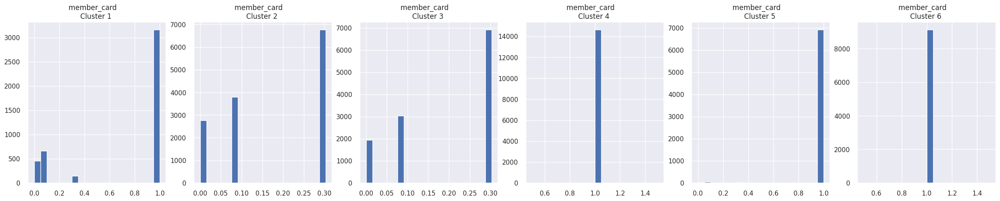

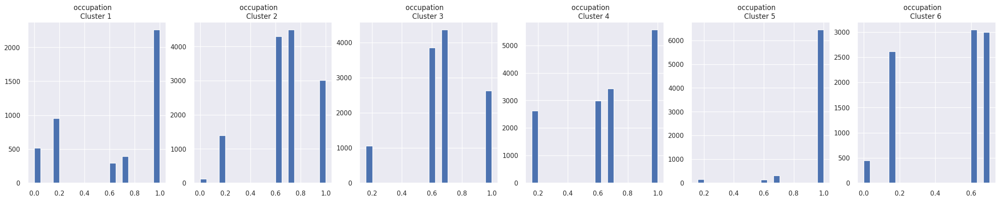

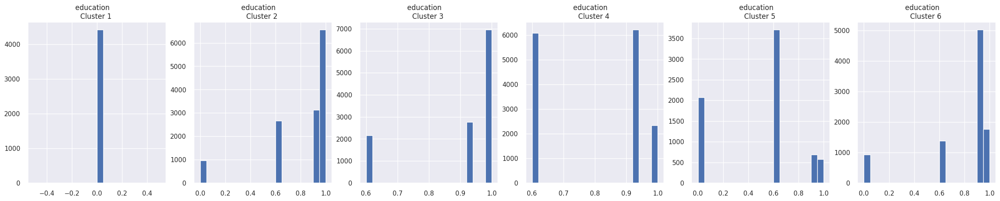

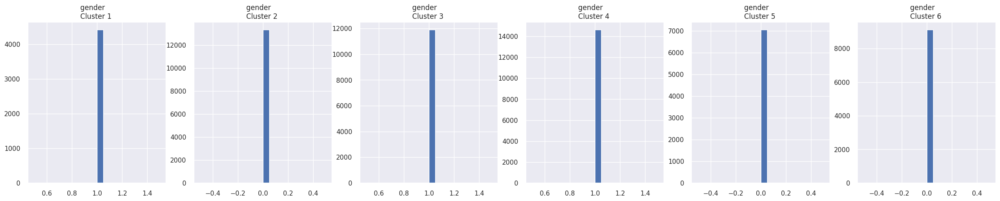

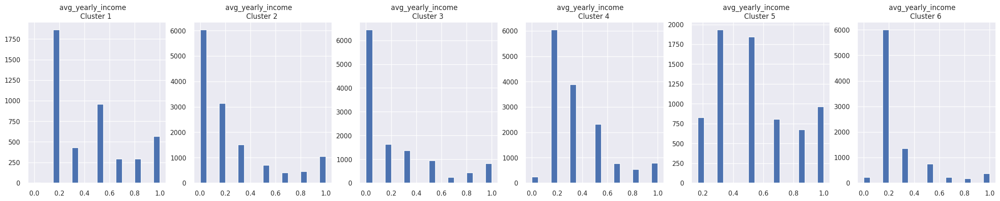

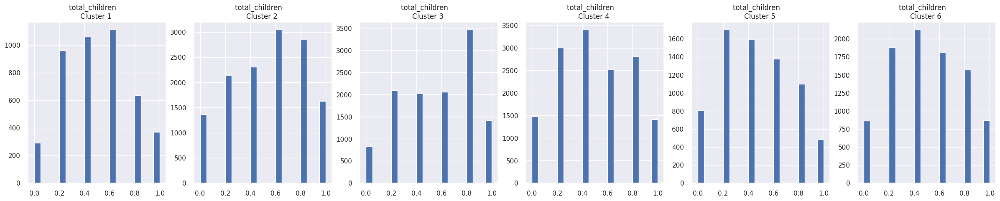

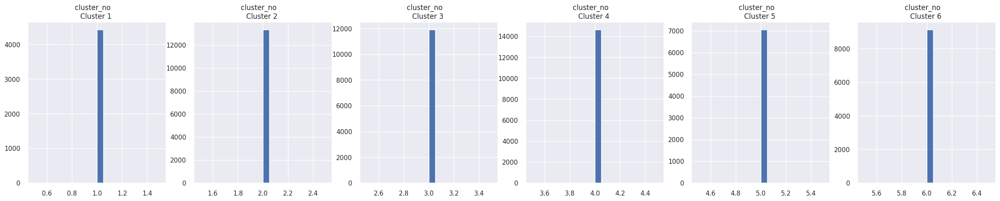

In [143]:
plot_cltrs_hist(data_freq_df, num_k)

#### Visualization

Text(0.5, 0, 'Z')

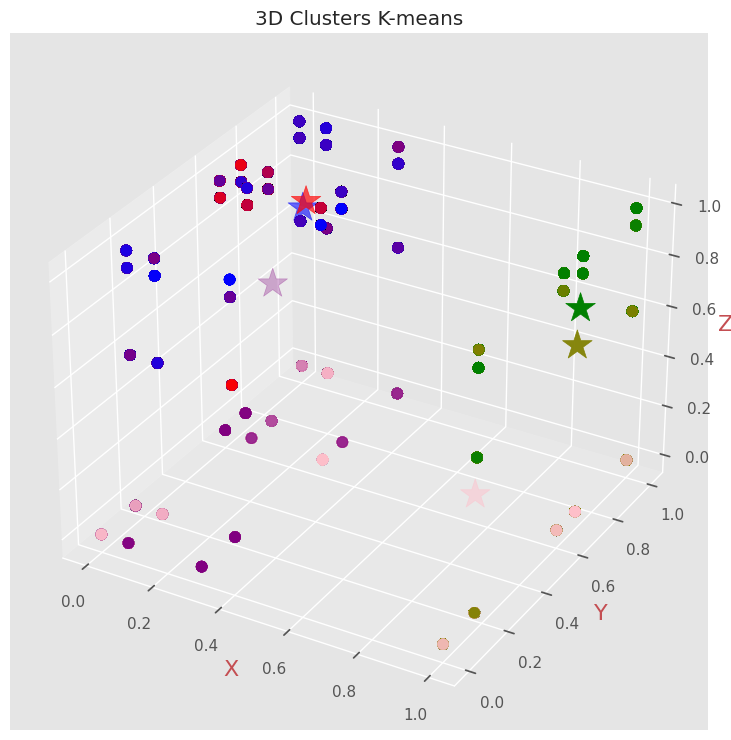

In [144]:
Xlb = data_freq_df_bk.drop('member_card', axis=1)
Xlb = npy.array(data_freq_df_bk)
ylb = npy.array(data_freq_df_bk['member_card'])


k_means = KMeans(n_clusters=num_k).fit(Xlb)
#cntrds = kmeans.cluster_centers_

# Predicting the clusters
labels = k_means.predict(Xlb)
# Getting the cluster centers
C = k_means.cluster_centers_

cols=['red','green','blue', 'olive', 'pink', 'purple', 'yellow', 'magenta', 'cyan', 'gray']
asg=[]
for row in labels:
    asg.append(cols[row])

# mpl.rcParams['figure.figsize'] = [9, 12]
mpl.style.use('ggplot')

# fig = mpl.figure()
fig = mpl.figure(figsize=(9, 12))
ax = fig.add_subplot(projection='3d')

ax.scatter(Xlb[:, 0],
           Xlb[:, 1],
           Xlb[:, 2],
           s=60, c=asg)

ax.scatter(C[:, 0],
           C[:, 1],
           C[:, 2],
           marker='*',
           s=500,
           c=cols[:num_k])

# c=random.sample(cols, num_k))

ax.set_title("3D Clusters K-means")
ax.set_xlabel('X', color='r', fontsize=16)
ax.set_ylabel('Y', color='r', fontsize=16)
ax.set_zlabel('Z', color='r', fontsize=16)

In [145]:
def plot_vals(var, tl):
  # Getting the values and plotting it
  f1 = data_freq_df_bk['member_card'].values
  f2 = data_freq_df_bk[var].values

  mpl.scatter(f1, f2, c=asg, s=70)
  mpl.scatter(C[:, 0],
              C[:, 1],
              marker='*',
              s=600,
              c=random.sample(cols, num_k))
  mpl.title(f"Member Card and {tl}")
  mpl.show()

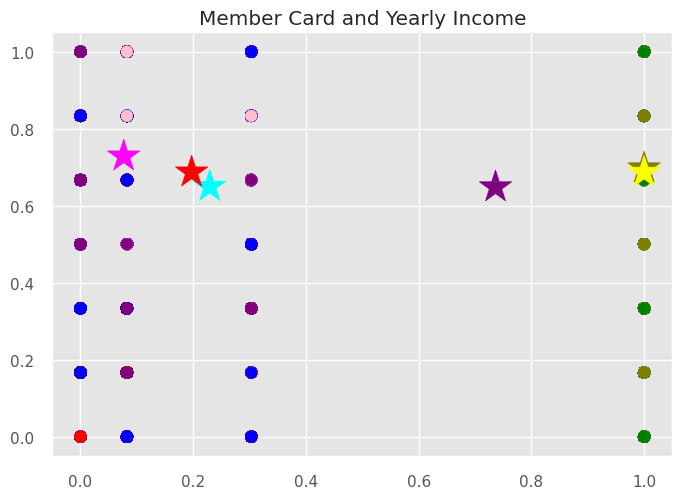

------------------------------------------------------


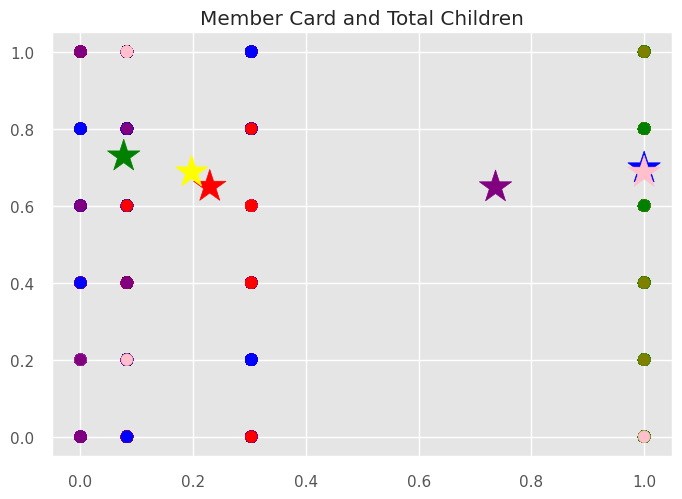

------------------------------------------------------


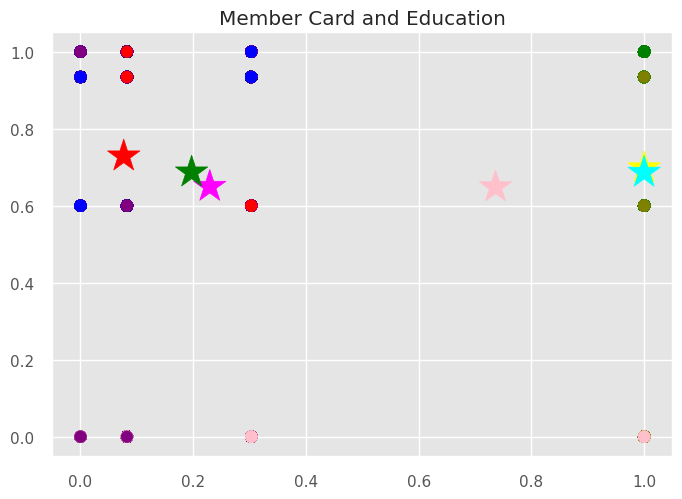

------------------------------------------------------


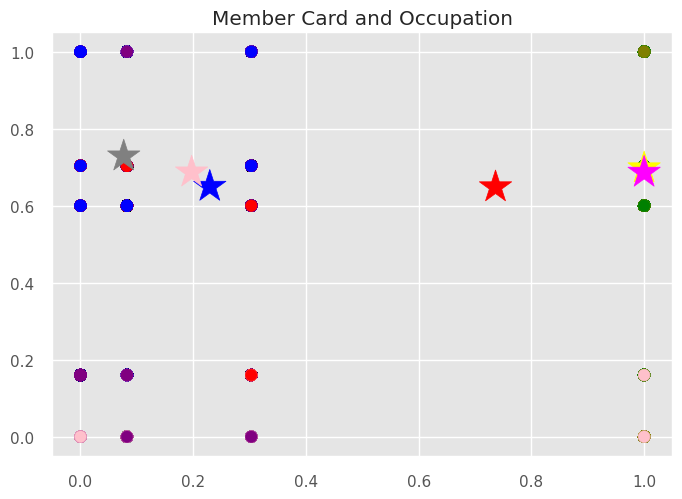

------------------------------------------------------


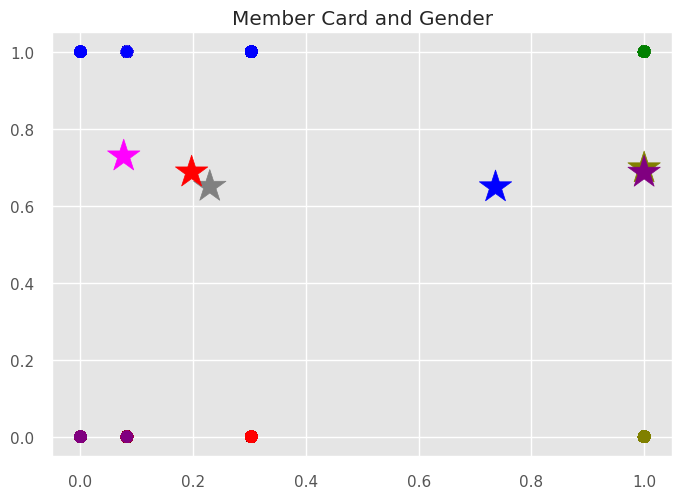

In [146]:
plot_vals('avg_yearly_income', 'Yearly Income')
print("------------------------------------------------------")
plot_vals('total_children', 'Total Children')
print("------------------------------------------------------")
plot_vals('education', 'Education')
print("------------------------------------------------------")
plot_vals('occupation', 'Occupation')
print("------------------------------------------------------")
plot_vals('gender', 'Gender')

#### PCA Viz

In [147]:
# def plot_kmeans_pca(df_data, cntrds, cltrs, kc):
def plot_kmeans_pca(df_data, cntrds, cltrs):

    # Xd = df_data.drop(['cluster_no', 'label'], axis=1)
    Xd = df_data

    model_pca = PCA(n_components = 2)
    model_pca.fit(Xd)
    pca = model_pca.transform(Xd)

    # Dimensionality reduction is applied to centroids
    cntrds_pca = model_pca.transform(cntrds)

    # The colors of each cluster are defined
    colors_cltrs = ['magenta', 'olive', 'cyan', 'orange', 'yellow', 'purple', 'teal', 'green', 'red', 'blue']

    # Colors are assigned to each cluster
    color_clusters = colors_cltrs[::-1]
    color_clusters = [color_clusters[cltrs[i]] for i in range(len(pca))]

    mpl.rcParams['font.family']='DejaVu Sans'
    mpl.figure(figsize=(15, 9))

    # PCA components are graphed
    mpl.scatter(pca[:, 0],
                pca[:, 1],
                c = color_clusters,
                marker = (5, 1),
                alpha = .5)

    # The centroids are plotted
    mpl.scatter(cntrds_pca[:, 0],
                cntrds_pca[:, 1],
                c = 'b',
                # c = random.sample(colors_cltrs, kc),
                marker = (5, 0),
                s = 50,
                linewidths = 4)

    # Data is saved in a variable
    xvector = model_pca.components_[0] * max(pca[:,0])
    yvector = model_pca.components_[1] * max(pca[:,1])
    cols = Xd.columns

    # Cluster names are plotted with vector distance
    for i in range(len(cols)):
        # Vectors are plotted
        mpl.arrow(0, 0,
                  xvector[i],
                  yvector[i],
                  color = 'black',
                  width = 0.0005,
                  head_width = 0.02,
                  alpha = .75)
        # Names are placed
        mpl.text(xvector[i],
                 yvector[i],
                 list(cols)[i],
                 color='black',
                 alpha=0.75)

    mpl.show()

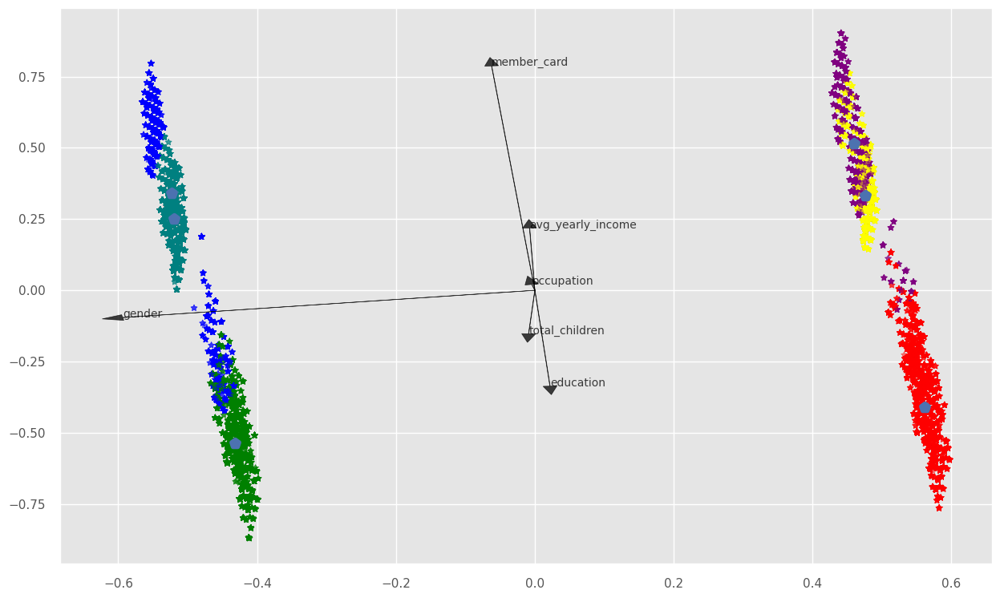

In [148]:
plot_kmeans_pca(data_freq_df_bk, cntrds_freq, cltrs_freq)

In [149]:
'''mpl.plot(npy.cumsum(pca.explained_variance_ratio_))
mpl.xlabel("# of components")
mpl.ylabel("Cumulative Variance Ratio")
mpl.show()'''

'mpl.plot(npy.cumsum(pca.explained_variance_ratio_))\nmpl.xlabel("# of components")\nmpl.ylabel("Cumulative Variance Ratio")\nmpl.show()'

In [150]:
Xd = data_freq_df.drop(['cluster_no', 'label'], axis=1)

pca = PCA()
pca.fit(Xd)

exp_var_cumul = npy.cumsum(pca.explained_variance_ratio_)

px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Components", "y": "Explained Variance"}
)

In [151]:
n_pcs = pca.components_.shape[0] - 1
n_pcs

5

In [152]:
f_test = def_feature_list_02.copy()
del f_test[0]

display(def_feature_list_02)
print("------------------------------------------------------")
display(f_test)

['member_card',
 'occupation',
 'education',
 'gender',
 'avg_yearly_income',
 'total_children']

------------------------------------------------------


['occupation', 'education', 'gender', 'avg_yearly_income', 'total_children']

In [153]:
pca = PCA()
components = pca.fit_transform(data_freq_df_bk[f_test])

labels = {str(i): f"PC {i+1} ({var:.1f}%)" for i, var in enumerate(pca.explained_variance_ratio_ * 100)}

fig = px.scatter_matrix(components,
                        dimensions=range(n_pcs),
                        color=data_freq_df_bk["member_card"],
                        labels=labels,
                        title="Principal Component Analysis (PCA) of Dataset")

fig.update_traces(diagonal_visible=False)
fig.show()

In [154]:
X = data_freq_df_bk[f_test]

pca = PCA(n_components=n_pcs)
components = pca.fit_transform(X)

loadings = pca.components_.T * npy.sqrt(pca.explained_variance_)

fig = px.scatter(components, x=0, y=1, color=data_freq_df_bk['member_card'])

for i, feature in enumerate(f_test):
    fig.add_annotation(
        ax=0, ay=0,
        axref="x", ayref="y",
        x=loadings[i, 0],
        y=loadings[i, 1],
        showarrow=True,
        arrowsize=2,
        arrowhead=2,
        xanchor="right",
        yanchor="top"
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
        yshift=5,
    )
fig.show()

In [155]:
def arr_variance_ratio(df_data, cmpnts):
    Xd = df_data.drop(['cluster_no', 'label'], axis=1)
    pca = PCA(n_components=cmpnts)
    pca_fit = pca.fit_transform(Xd)
    pca.explained_variance_ratio_
    print(npy.cumsum(pca.explained_variance_ratio_))

In [156]:
arr_variance_ratio(data_freq_df, n_pcs)

[0.31634617 0.55614456 0.70409035 0.81279743 0.92056981]


#### Prediction

In [157]:
nd_freq_df_test = nd_freq_df.copy()

indx_test = [69, 432, 999,
             1234, 4368, 5005,
             6004, 10123, 12501,
             17000, 22951, 29741,
             36247, 41654, 49019,
             56789, 60000]

In [158]:
def sample_df(df_data, indx=indx_test):
    dfs = pds.DataFrame(df_data.loc[indx],
                            columns = df_data.keys()).reset_index(drop = True)

    dfd = df_data.drop(indx, axis = 0)

    return dfd, dfs

In [159]:
df_fq_test, smp_test_fq = sample_df(nd_freq_df_test)

In [160]:
display(df_fq_test)
print("------------------------------------------------------")
display(smp_test_fq)

,member_card,occupation,education,gender,avg_yearly_income,total_children
0,13867,15995.0,18201.0,30942,20000,1.0
1,5198,19915.0,15994.0,29486,60000,0.0
2,13867,14624.0,18201.0,30942,20000,4.0
3,33807,14624.0,17838.0,30942,40000,2.0
4,33807,15995.0,18201.0,29486,40000,0.0
...,...,...,...,...,...,...
60423,13867,15995.0,18201.0,30942,20000,1.0
60424,33807,15995.0,17838.0,30942,40000,2.0
60425,33807,14624.0,17838.0,29486,40000,1.0
60426,33807,19915.0,15994.0,29486,80000,2.0


------------------------------------------------------


,member_card,occupation,education,gender,avg_yearly_income,total_children
0,33807,19915.0,15994.0,30942,80000,3.0
1,33807,19915.0,15994.0,29486,60000,1.0
2,33807,19915.0,15994.0,29486,60000,3.0
3,7556,19915.0,15994.0,30942,140000,1.0
4,33807,19915.0,15994.0,29486,60000,0.0
5,5198,19915.0,12683.5,30942,120000,4.0
6,33807,6687.5,12683.5,30942,40000,3.0
7,13867,14624.0,18201.0,30942,20000,2.0
8,13867,15995.0,18201.0,29486,20000,1.0
9,5198,19915.0,15994.0,29486,80000,5.0


In [161]:
freq_arr_t, freq_df_t = scaling_m_dfs(df_fq_test)
freq_arr_s, freq_df_s = scaling_m_dfs(smp_test_fq)

,member_card,occupation,education,gender,avg_yearly_income,total_children
44565,1.0,0.703648,0.934209,1.0,0.166667,0.4
53881,1.0,1.000000,0.000000,0.0,0.333333,0.0


------------------------------------------------------


array([[0.30301653, 0.7036477 , 1.        , 1.        , 0.        ,
        0.2       ],
       [0.        , 1.        , 0.6       , 0.        , 0.33333333,
        0.        ],
       [0.30301653, 0.6       , 1.        , 1.        , 0.        ,
        0.8       ],
       ...,
       [1.        , 0.6       , 0.93420933, 0.        , 0.16666667,
        0.2       ],
       [1.        , 1.        , 0.6       , 0.        , 0.5       ,
        0.4       ],
       [1.        , 0.6       , 1.        , 1.        , 0.        ,
        0.6       ]])

,member_card,occupation,education,gender,avg_yearly_income,total_children
13,1.000000,0.703648,1.0,1.0,0.166667,0.0
3,0.082422,1.000000,0.6,1.0,1.000000,0.2


------------------------------------------------------


array([[1.        , 1.        , 0.6       , 1.        , 0.5       ,
        0.6       ],
       [1.        , 1.        , 0.6       , 0.        , 0.33333333,
        0.2       ],
       [1.        , 1.        , 0.6       , 0.        , 0.33333333,
        0.6       ],
       [0.08242162, 1.        , 0.6       , 1.        , 1.        ,
        0.2       ],
       [1.        , 1.        , 0.6       , 0.        , 0.33333333,
        0.        ],
       [0.        , 1.        , 0.        , 1.        , 0.83333333,
        0.8       ],
       [1.        , 0.        , 0.        , 1.        , 0.16666667,
        0.6       ],
       [0.30301653, 0.6       , 1.        , 1.        , 0.        ,
        0.4       ],
       [0.30301653, 0.7036477 , 1.        , 0.        , 0.        ,
        0.2       ],
       [0.        , 1.        , 0.6       , 0.        , 0.5       ,
        1.        ],
       [1.        , 0.        , 0.        , 1.        , 0.33333333,
        0.6       ],
       [0.        , 0

In [162]:
def pred_new_data(k, df_data_t, df_data_s):
  kms = KMeans(n_clusters=k)
  kms.fit(df_data_t)

  # kms.fit(df_data_s)
  # X_new = df_data_s.values

  new_lbls = kms.predict(df_data_s)
  new_lbls += 1

  print(new_lbls)

  '''score_slht = silhouette_score(df_data_s, new_lbls)
  score_dvBld = davies_bouldin_score(df_data_s, new_lbls)
  score_calHabz = calinski_harabasz_score(df_data_s, new_lbls)

  print("For n_clusters = {}, silhouette score is {})".format(k, score_slht))
  print("For n_clusters = {}, Davies Bouldin score is {})".format(k, score_dvBld))
  print("For n_clusters = {}, Calinski Harabasz score is {})".format(k, score_calHabz))'''

In [163]:
pred_new_data(num_k, freq_df_t, freq_df_s)

[3 1 1 2 1 2 6 2 5 5 6 2 5 6 5 1 1]


In [164]:
def kmeans_new_data(k, arr_data_t, arr_data_s):

    kams = KMeans(n_clusters=k).fit(arr_data_t)
    sample_pred = kams.predict(arr_data_s)

    for smp, prd in enumerate(sample_pred):
        print("Sample", smp+1, "is in the cluster:", prd+1)

    '''score_slht = silhouette_score(arr_data_s, sample_pred)
    score_dvBld = davies_bouldin_score(arr_data_s, sample_pred)
    score_calHabz = calinski_harabasz_score(arr_data_s, sample_pred)

    print("For n_clusters = {}, silhouette score is {})".format(k, score_slht))
    print("For n_clusters = {}, Davies Bouldin score is {})".format(k, score_dvBld))
    print("For n_clusters = {}, Calinski Harabasz score is {})".format(k, score_calHabz))'''

In [165]:
kmeans_new_data(num_k, freq_arr_t, freq_arr_s)

Sample 1 is in the cluster: 2
Sample 2 is in the cluster: 4
Sample 3 is in the cluster: 4
Sample 4 is in the cluster: 1
Sample 5 is in the cluster: 4
Sample 6 is in the cluster: 1
Sample 7 is in the cluster: 2
Sample 8 is in the cluster: 6
Sample 9 is in the cluster: 5
Sample 10 is in the cluster: 5
Sample 11 is in the cluster: 2
Sample 12 is in the cluster: 1
Sample 13 is in the cluster: 5
Sample 14 is in the cluster: 2
Sample 15 is in the cluster: 5
Sample 16 is in the cluster: 4
Sample 17 is in the cluster: 4


### DBSCAN

In [166]:
rng = range(1, 6)
epsilon = [.05, .09, .2, .5, .9]

for ms in rng:
  for e in epsilon:

    db = DBSCAN(eps=e, min_samples=ms)

    # Fit the data and get cluster labels
    labels = db.fit_predict(data_freq_arr)

    # Calculate the Silhouette Coefficient
    silhouette_coefficient = silhouette_score(data_freq_arr, labels)

    print(f"min_samples= {ms}, epsilon= {e:.2f}, Silhouette Coefficient= {silhouette_coefficient:.3f}")

min_samples= 1, epsilon= 0.05, Silhouette Coefficient= 1.000
min_samples= 1, epsilon= 0.09, Silhouette Coefficient= 0.913
min_samples= 1, epsilon= 0.20, Silhouette Coefficient= 0.436
min_samples= 1, epsilon= 0.50, Silhouette Coefficient= 0.345
min_samples= 1, epsilon= 0.90, Silhouette Coefficient= 0.320
min_samples= 2, epsilon= 0.05, Silhouette Coefficient= 0.999
min_samples= 2, epsilon= 0.09, Silhouette Coefficient= 0.913
min_samples= 2, epsilon= 0.20, Silhouette Coefficient= 0.436
min_samples= 2, epsilon= 0.50, Silhouette Coefficient= 0.345
min_samples= 2, epsilon= 0.90, Silhouette Coefficient= 0.320
min_samples= 3, epsilon= 0.05, Silhouette Coefficient= 0.996
min_samples= 3, epsilon= 0.09, Silhouette Coefficient= 0.912
min_samples= 3, epsilon= 0.20, Silhouette Coefficient= 0.438
min_samples= 3, epsilon= 0.50, Silhouette Coefficient= 0.345
min_samples= 3, epsilon= 0.90, Silhouette Coefficient= 0.320
min_samples= 4, epsilon= 0.05, Silhouette Coefficient= 0.993
min_samples= 4, epsilon=

In [167]:
dbscan = DBSCAN(eps=.09, min_samples=5)
labels_pred = dbscan.fit_predict(data_freq_arr)
labels_p = dbscan.labels_

# Number of Clusters
N_clus = len(set(labels_p)) - (1 if -1 in labels_p else 0)
print('Estimated no. of clusters: %d' % N_clus)

# Identify Noise
n_noise = list(labels_p).count(-1)
print('Estimated no. of noise points: %d' % n_noise)

# Calculate the Silhouette Coefficient
silhouette = silhouette_score(data_freq_arr, labels_pred)
print(f"Silhouette Coefficient: {silhouette:.3f}")

Estimated no. of clusters: 839
Estimated no. of noise points: 241
Silhouette Coefficient: 0.906


In [168]:
def dbscan_pca_viz(arr_data, ep):
  pca = PCA(n_components=2)
  X = pca.fit_transform(arr_data)

  dbscan = DBSCAN(eps=ep, min_samples=5)
  clusters = dbscan.fit_predict(X)

  mpl.scatter(X[:, 0], X[:, 1], c=clusters, cmap="Set2")
  mpl.title("DBSCAN Clustering")
  mpl.xlabel("Feature 1")
  mpl.ylabel("Feature 2")
  mpl.show()

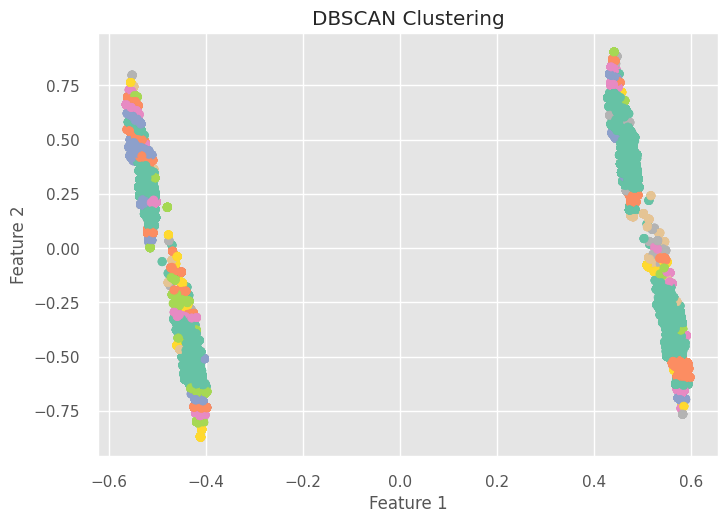

In [169]:
dbscan_pca_viz(data_freq_arr, 0.01)

### Hierarchical Clustering

In [170]:
'''def hier_clstr(df_data):

  # Average, Complete and Ward Linkage Methods
  mthds = ['ward', 'average', 'complete']

  for m in mthds:
    hc = linkage(df_data,
                 method = m,
                 metric = 'euclidean')

    mpl.figure(figsize=(15, 10))
    mpl.rcParams['font.family']='DejaVu Sans'
    mpl.title("Hierarchical Clustering")
    mpl.xlabel("Observations")
    mpl.ylabel("Distance")

    dendrogram(hc, p=10,
              leaf_font_size=10,
              show_contracted=True,
              truncate_mode="lastp")
              # truncate_mode='level'

    mpl.show()'''

'def hier_clstr(df_data):\n\n  # Average, Complete and Ward Linkage Methods\n  mthds = [\'ward\', \'average\', \'complete\']\n\n  for m in mthds:\n    hc = linkage(df_data,\n                 method = m,\n                 metric = \'euclidean\')\n\n    mpl.figure(figsize=(15, 10))\n    mpl.rcParams[\'font.family\']=\'DejaVu Sans\'\n    mpl.title("Hierarchical Clustering")\n    mpl.xlabel("Observations")\n    mpl.ylabel("Distance")\n\n    dendrogram(hc, p=10,\n              leaf_font_size=10,\n              show_contracted=True,\n              truncate_mode="lastp")\n              # truncate_mode=\'level\'\n\n    mpl.show()'

In [171]:
# hier_clstr(data_freq_df_bk)

# Final Doc

In [172]:
# Final Analysis Document in the Main Folder...